<a href="https://colab.research.google.com/github/santiric/UMUD_Challenge_my_solution/blob/main/nn_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Author:** Riccardo Santi

riccardo.santi.1@studenti.unipd.it




# UMUD Challenge — Automated Muscle Architecture Analysis from Ultrasound

**Course/Project context.** This notebook implements an end-to-end pipeline for the
Kaggle competition [*UMUD: Muscle Architecture in Ultrasound Data*](https://www.kaggle.com/competitions/umud-challenge-muscle-architecture-in-ultrasound-data).
The goal is to automatically extract clinically relevant muscle architecture
parameters — **muscle thickness (MT)**, **fascicle length (FL)** and **pennation
angle (PA)** — from B-mode ultrasound images, replacing the laborious manual
tracing normally required.

**Reference method.** Our design closely follows the approach described in
Ritsche et al. (2024), *"Fully Automated Analysis of Muscle Architecture from
B-Mode Ultrasound Images with DL_Track_US"* (Ultrasound in Medicine & Biology).
That paper trains two separate U-Net segmentation models — one for the
**aponeuroses** (the connective-tissue sheets bounding the muscle) and one for
the **fascicles** (the muscle fiber bundles) — and then derives MT, FL and PA
from the predicted binary masks via geometric post-processing (curve fitting,
line–curve intersection, etc.).

**What this notebook does, end to end:**

1. **Data setup.** Downloads the competition dataset via `kagglehub` and locates
   the four data folders (aponeurosis images/masks, fascicle images/masks) plus
   the unlabeled test image folder.
2. **Pre-processing pipeline (shared by both tasks).**
   - `normalize_mask()` fixes masks that were exported with inverted (white-background) colors.
   - Automatic **ROI detection** crops out ultrasound machine UI/borders using a
     column/row pixel-variability heuristic, with results cached to CSV
     (`apo_boxes.csv`, `fasc_boxes.csv`, `test_boxes.csv`) so boxes aren't recomputed every epoch.
   - A custom `UltrasoundDataset` applies an explicit three-step **T1 → T2 → T3**
     transform chain (resize to 512×512 → crop to ROI → resize to network input
     size), storing enough metadata to invert the chain later.
   - A fixed-seed **90/10 train/val split** at the filename level, done once for
     APO and once for FASC, feeding `create_loaders()`.
3. **Segmentation models.** Trains a classic **U-Net** (Ronneberger et al.,
   the baseline architecture in Ritsche et al.) from scratch, separately for the
   aponeurosis task and the fascicle task, with matching architecture and
   hyperparameters: Adam (lr=1e-3, betas=(0.9, 0.999), eps=1e-7),
   `ReduceLROnPlateau` (factor=0.1, patience=10, min_lr=1e-5), `BCEWithLogitsLoss`,
   and IoU as the model-selection metric. Training checkpoints (best-IoU and
   latest, plus a CSV history) are persisted to **Google Drive** so training can
   resume across ephemeral Colab sessions.
4. **Pixel-to-mm calibration.** Recovers a `px_per_cm` conversion factor from the
   burned-in ultrasound scale-bar tick marks, adapting the `collect_metadata()`
   logic released with the competition's own baseline notebook.
5. **Post-processing into architecture measurements**, mirroring DL_Track_US's logic:
   - Splits the binary aponeurosis mask into superficial/deep bands via
     connected-component labeling, then fits a polynomial to each band's
     **inner edge** (the boundary facing the muscle belly, not the centerline).
   - Estimates **MT** as the mean vertical distance between the two inner-edge
     curves at three horizontal quantiles (10%, 50%, 90%) of the image width.
   - Estimates **FL/PA** by isolating fascicle fragments, filtering out
     noise/off-muscle fragments and implausible extrapolation angles, and
     selecting the fragments consistent with the fitted aponeuroses.
6. **Evaluation and submission.** Runs the MT and FL/PA analyses over the full
   test set, saves timestamped result CSVs (plus a `_latest.csv` convenience
   copy) to Google Drive, computes IoU against ground truth, and assembles the
   competition submission file.

Throughout, we try to stay faithful to the paper's choices (U-Net architecture,
Adam optimizer with lr=1e-3, `ReduceLROnPlateau`, BCE loss, batch size 3,
elastic-deformation augmentation) while adapting details to fit the specific
format of the UMUD competition data, that provides a bigger dataset than the one mentioned in Ritsche et al. (2024).

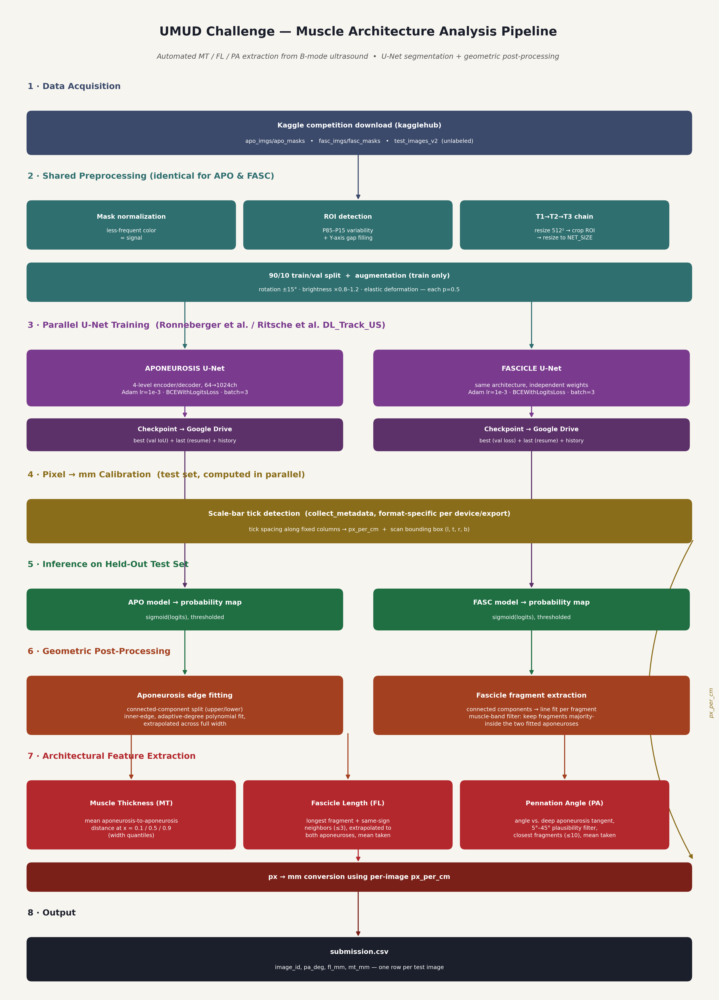

*Figure: end-to-end UMUD pipeline, from raw ultrasound frame to the three
submitted measurements (MT, FL, PA).*

In [1]:
import random
import numpy as np
import torch

SEED = 1

def seed_everything(seed=SEED):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything()

### ENVIRONMENT SETUP + DATASET DOWNLOAD (Kaggle)

This cell downloads the UMUD competition data via kagglehub using the Kaggle API
token, then locates the test image folder.

In [2]:
# ============================================================
# ENVIRONMENT SETUP + DATASET DOWNLOAD (Kaggle)
# ============================================================
import os

os.environ["KAGGLE_API_TOKEN"] = "your_kaggle_API"  # insert your kaggle api token here
# you can obtain one at your kaggle account

import kagglehub

path = kagglehub.competition_download('umud-challenge-muscle-architecture-in-ultrasound-data')
print("Path to competition files:", path)

files = os.listdir(path)
print("Downloaded files:")
for f in files:
    print(f"- {f}")

# ============================================================
# TEST SET — locate the folder
# ============================================================
test_base_idir = os.path.join(path, 'test_images_v2')
subfolders = [f for f in os.listdir(test_base_idir) if os.path.isdir(os.path.join(test_base_idir, f))]
test_idir = os.path.join(test_base_idir, subfolders[0]) if subfolders else test_base_idir
print(f"Test directory: {test_idir}")

100%|██████████| 2.56G/2.56G [00:39<00:00, 70.3MB/s]

Extracting files...


Path to competition files: /root/.cache/kagglehub/competitions/umud-challenge-muscle-architecture-in-ultrasound-data
Downloaded files:
- apo_masks_v1
- sample_submission.csv
- test_images_v2
- apo_imgs_v1
- fasc_imgs_v1
- fasc_masks_v1
Test directory: /root/.cache/kagglehub/competitions/umud-challenge-muscle-architecture-in-ultrasound-data/test_images_v2/test_set_v2


This cell locates the four data folders provided by the competition: aponeurosis
images/masks (`apo_imgs_v1` / `apo_masks_v1`) and fascicle images/masks
(`fasc_imgs_v1` / `fasc_masks_v1`).

In [3]:
# ============================================================
# LOCATE IMAGE/MASK FOLDERS
# apo_* = aponeurosis, fasc_* = fascicles. Each Kaggle dataset
# has an extra auto-generated subfolder, we look for it.
# ============================================================
def find_subfolder(base_dir):
    return os.path.join(base_dir, os.listdir(base_dir)[0]) if os.path.exists(base_dir) else ""

base_idir = os.path.join(path, 'apo_imgs_v1')
base_mdir = os.path.join(path, 'apo_masks_v1')
idir = find_subfolder(base_idir)
mdir = find_subfolder(base_mdir)

base_idir_f = os.path.join(path, 'fasc_imgs_v1')
base_mdir_f = os.path.join(path, 'fasc_masks_v1')
idir_f = find_subfolder(base_idir_f)
mdir_f = find_subfolder(base_mdir_f)

print(f"Aponeurosis -> img: {idir}\n               mask: {mdir}")
print(f"Fascicles   -> img: {idir_f}\n               mask: {mdir_f}")

# lists of valid (image, mask) pairs, reused everywhere
def build_pairs(idir, mdir, ext='.tif'):
    all_files = sorted([f for f in os.listdir(idir) if f.endswith(ext)])
    return [(os.path.join(idir, f), os.path.join(mdir, f))
            for f in all_files if os.path.exists(os.path.join(mdir, f))]

valid_pairs = build_pairs(idir, mdir)
valid_pairs_f = build_pairs(idir_f, mdir_f)
print(f"Apo pairs: {len(valid_pairs)} | Fasc pairs: {len(valid_pairs_f)}")

Aponeurosis -> img: /root/.cache/kagglehub/competitions/umud-challenge-muscle-architecture-in-ultrasound-data/apo_imgs_v1/apo_images_new_model_v1
               mask: /root/.cache/kagglehub/competitions/umud-challenge-muscle-architecture-in-ultrasound-data/apo_masks_v1/apo_masks_new_model_v1
Fascicles   -> img: /root/.cache/kagglehub/competitions/umud-challenge-muscle-architecture-in-ultrasound-data/fasc_imgs_v1/fasc_images_new_model_v1
               mask: /root/.cache/kagglehub/competitions/umud-challenge-muscle-architecture-in-ultrasound-data/fasc_masks_v1/fasc_masks_new_model_v1
Apo pairs: 1048 | Fasc pairs: 2761


## **PRE-PROCESSING**


### MASK NORMALIZATION

Some ground-truth masks in the dataset are inverted, with a white background instead
of black. Since we can't rely on a fixed pixel-value convention, `normalize_mask()`
always treats the less frequent color as the signal (aponeurosis or fascicle). This is
a safe heuristic because the structures we're segmenting are thin lines that occupy a
small fraction of the image, whichever way the mask happens to be encoded.

In [4]:
# ============================================================
# MASK NORMALIZATION
# Some masks in the dataset have a white background instead of black
# ("inverted" masks). Criterion: the LESS prevalent color is
# always the useful signal (aponeurosis/fascicle).
# ============================================================
import numpy as np

def normalize_mask(mask_arr):
    """
    mask_arr: 2D array.
    Returns a 0/1 binary mask where 1 = useful signal,
    regardless of any background/foreground inversion.
    """
    dark_pixels = np.sum(mask_arr < 128)
    light_pixels = np.sum(mask_arr >= 128)
    if light_pixels > dark_pixels:
        return (mask_arr < 128).astype(np.float32)   # white background -> dark signal
    else:
        return (mask_arr >= 128).astype(np.float32)  # black background -> light signal

### ROI DETECTION

This cell implements automatic region-of-interest (ROI) detection. Ultrasound frames
in the UMUD dataset include machine UI, borders and empty space around the actual scan,
which we crop out before feeding images to the network — a pre-processing step
DL_Track_US itself doesn't need, since its inputs are already-cropped scans, but that
our raw Kaggle images require.

The heuristic computes pixel-value variability (the P85-P15 percentile spread) along
each column and row: the scan region is high-contrast and high-variability, while the
surrounding UI is flat. We find the longest contiguous run of "active" columns/rows
above a threshold fraction of the max variability. On the X axis we use the raw
longest-run logic with no gap filling. On the Y axis we additionally fill short
internal gaps (`fill_small_gaps`), since the scan region can have locally uniform or
dark bands — for example over deep tissue — that would otherwise fragment the detected
run. The function falls back to the full 512x512 frame if the detected box is
implausibly small (under 80 px), to avoid degenerate crops on unusual images.

In [5]:
# ============================================================
# ROI DETECTION — gap filling ONLY on height (Y),
# X keeps the original logic (simple longest continuous run)
# ============================================================
def find_longest_continuous_run(bool_mask):
    max_length = 0
    best_start, best_end = 0, len(bool_mask)
    current_length, current_start = 0, 0
    for i, value in enumerate(bool_mask):
        if value:
            if current_length == 0:
                current_start = i
            current_length += 1
        else:
            if current_length > max_length:
                max_length = current_length
                best_start, best_end = current_start, i
            current_length = 0
    if current_length > max_length:
        best_start, best_end = current_start, len(bool_mask)
    return best_start, best_end

def fill_small_gaps(bool_array, max_gap):
    """Fills runs of False surrounded by True (internal gaps) if short enough."""
    array = bool_array.copy()
    n = len(array)
    i = 0
    while i < n:
        if not array[i]:
            j = i
            while j < n and not array[j]:
                j += 1
            gap_len = j - i
            if i > 0 and j < n and gap_len <= max_gap:
                array[i:j] = True
            i = j
        else:
            i += 1
    return array

def get_box_coordinates(img_path, max_gap_y=40):
    img_pil = Image.open(img_path).convert('L')
    img_512 = img_pil.resize((512, 512), resample=Image.BILINEAR)
    img_arr = np.array(img_512, dtype=np.float32)

    # --- X: original logic, NO gap filling ---
    p15_x = np.percentile(img_arr, 15, axis=0)
    p85_x = np.percentile(img_arr, 85, axis=0)
    variability_x_smooth = np.convolve(p85_x - p15_x, np.ones(15) / 15, mode='same')
    active_columns = variability_x_smooth > (np.max(variability_x_smooth) * 0.20)
    x_min, x_max = find_longest_continuous_run(active_columns)
    if (x_max - x_min) < 80:
        x_min, x_max = 0, 512

    # --- Y: std + gap filling (only here) ---
    screen_slice = img_arr[:, x_min:x_max]
    variability_rows_smooth = np.convolve(np.std(screen_slice, axis=1), np.ones(9) / 9, mode='same')
    active_rows = variability_rows_smooth > (np.max(variability_rows_smooth) * 0.1)
    active_rows = fill_small_gaps(active_rows, max_gap_y)   # <-- Y only
    y_min, y_max = find_longest_continuous_run(active_rows)
    if (y_max - y_min) < 80:
        y_min, y_max = 0, 512

    y_min = max(0, y_min - 2)
    y_max = min(512, y_max + 2)

    return x_min, y_min, x_max - x_min, y_max - y_min

This is a sanity check: it visualizes the detected ROI box (red rectangle) on a
handful of random images from each of the three sets — APO train, FASC train and TEST.
It's a purely visual QA step before committing to the box-detection logic for the
whole dataset, letting us catch obviously wrong crops early.

--- APO train: 1048 total images, showing 3 ---


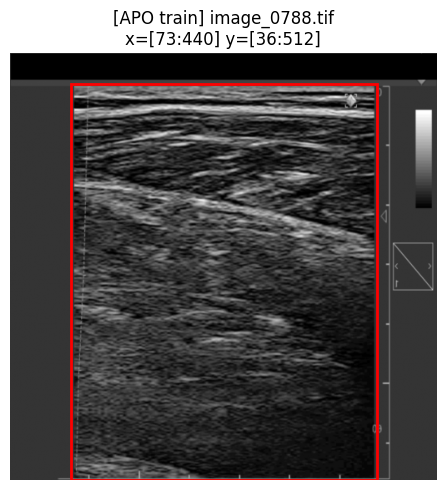

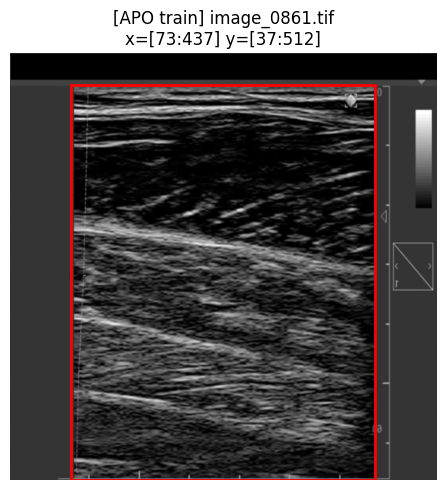

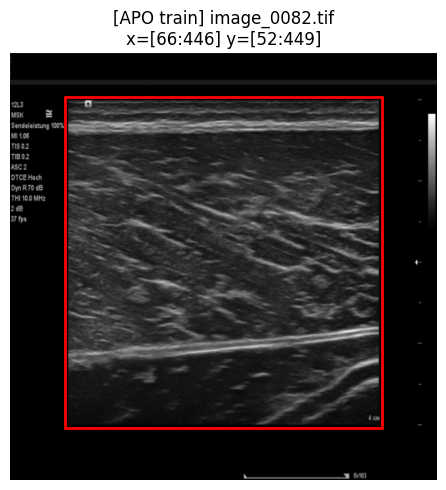

--- FASC train: 2761 total images, showing 3 ---


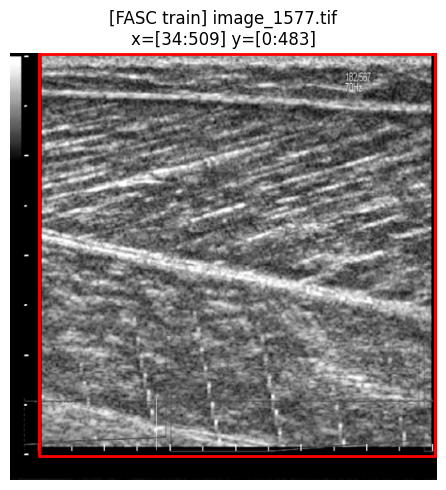

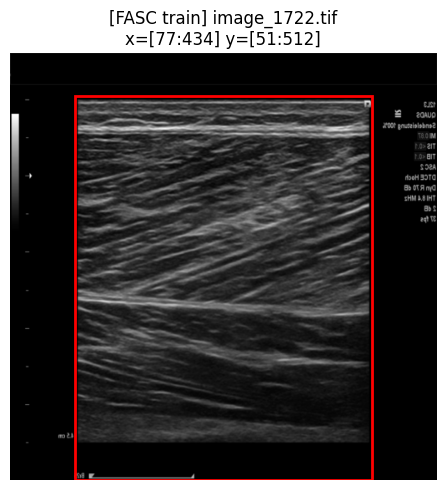

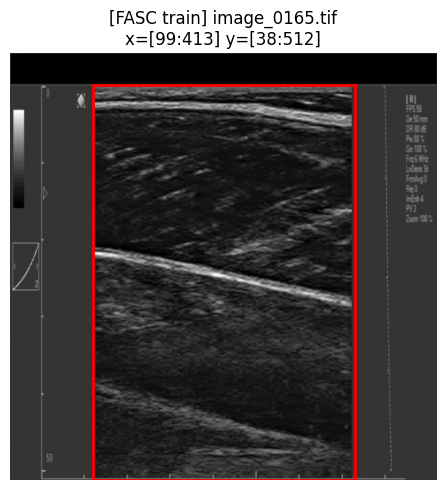

--- TEST: 251 total images, showing 3 ---


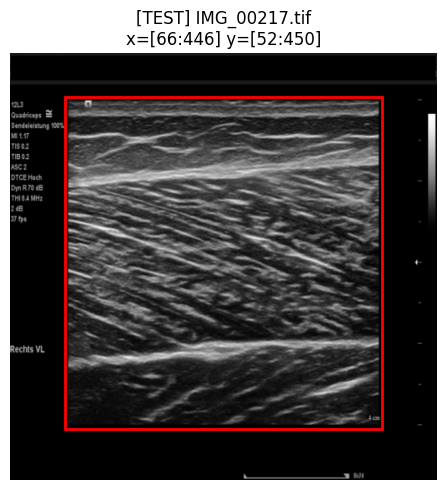

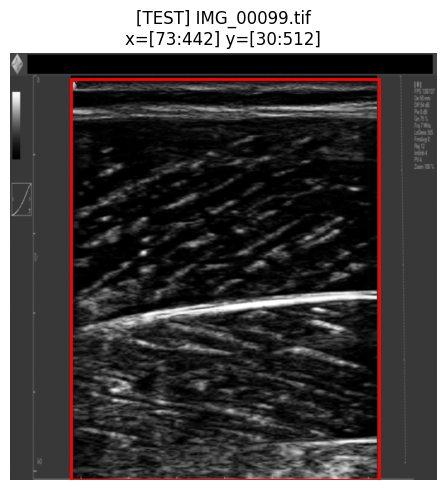

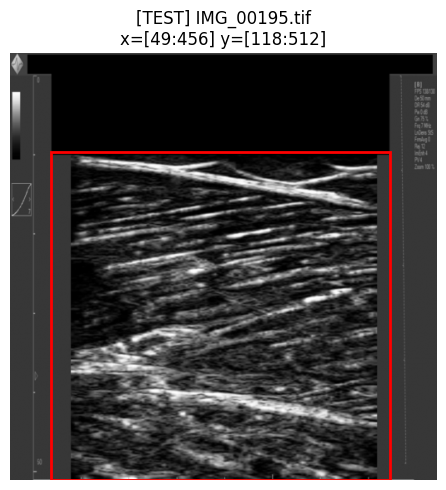

In [6]:
# ============================================================
# PRINT RANDOM IMAGES — APO train, FASC train, TEST
# uses only idir, idir_f, test_idir and get_box_coordinates
# ============================================================
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import os
import random
from PIL import Image

def show_random_boxes(img_dir, title, n=50, ext='.tif', seed=0):
    filenames = sorted([f for f in os.listdir(img_dir) if f.endswith(ext)])
    random.seed(seed)
    sample = random.sample(filenames, min(n, len(filenames)))

    print(f"--- {title}: {len(filenames)} total images, showing {len(sample)} ---")
    for fname in sample:
        fpath = os.path.join(img_dir, fname)
        img_arr = np.array(Image.open(fpath).convert('L').resize((512, 512), resample=Image.BILINEAR))

        x, y, w, h = get_box_coordinates(fpath)

        fig, ax = plt.subplots(figsize=(5, 5))
        ax.imshow(img_arr, cmap='gray')
        ax.add_patch(patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='red', facecolor='none'))
        ax.set_title(f"[{title}] {fname}\nx=[{x}:{x+w}] y=[{y}:{y+h}]")
        ax.axis('off')
        plt.tight_layout()
        plt.show()

show_random_boxes(idir, "APO train", n=3)
show_random_boxes(idir_f, "FASC train", n=3)
show_random_boxes(test_idir, "TEST", n=3)


This cell runs `get_box_coordinates()` over every image in each set and caches the
results to CSV (`apo_boxes.csv`, `fasc_boxes.csv`, `test_boxes.csv`). We precompute and
store boxes rather than recomputing them on the fly inside the Dataset, since box
detection is somewhat expensive and the ROI is a fixed property of each image, not
something that should vary per epoch or be randomized.

In [7]:
# ============================================================
# COMPUTE BOXES FOR ALL DATASETS (apo train/test, fasc)
# ============================================================
import csv
import pandas as pd
from tqdm.auto import tqdm

def compute_and_save_boxes(pairs_or_file_list, out_csv, is_pairs=True):
    """
    pairs_or_file_list: list of (img_path, mask_path) if is_pairs=True,
                         otherwise a list of img_path only (e.g. test set without masks).
    """
    with open(out_csv, mode='w', newline='', encoding='utf-8') as f:
        writer = csv.writer(f)
        writer.writerow(['image_name', 'x_min', 'y_min', 'width', 'height'])
        iterable = pairs_or_file_list if not is_pairs else [c[0] for c in pairs_or_file_list]
        for img_path in tqdm(iterable, desc=f"Boxes -> {out_csv}"):
            x, y, w, h = get_box_coordinates(img_path)
            writer.writerow([os.path.basename(img_path), x, y, w, h])
    print(f"✅ Boxes saved to '{out_csv}'")

# Aponeurosis
compute_and_save_boxes(valid_pairs, 'apo_boxes.csv')

# Fascicles
compute_and_save_boxes(valid_pairs_f, 'fasc_boxes.csv')

# Test set (if present, no masks)
test_base_idir = os.path.join(path, 'test_images_v2')
if os.path.exists(test_base_idir):
    subfolders = [f for f in os.listdir(test_base_idir) if os.path.isdir(os.path.join(test_base_idir, f))]
    test_idir = os.path.join(test_base_idir, subfolders[0]) if subfolders else test_base_idir
    test_files = sorted([os.path.join(test_idir, f) for f in os.listdir(test_idir)
                          if f.lower().endswith(('.tif', '.png', '.jpg', '.jpeg'))])
    compute_and_save_boxes(test_files, 'test_boxes.csv', is_pairs=False)

Boxes -> apo_boxes.csv:   0%|          | 0/1048 [00:00<?, ?it/s]

✅ Boxes saved to 'apo_boxes.csv'


Boxes -> fasc_boxes.csv:   0%|          | 0/2761 [00:00<?, ?it/s]

✅ Boxes saved to 'fasc_boxes.csv'


Boxes -> test_boxes.csv:   0%|          | 0/309 [00:00<?, ?it/s]

✅ Boxes saved to 'test_boxes.csv'


### DATASET — explicitly tracks the 3 transformations: T1/T2/T3

This cell defines the custom PyTorch Dataset used for the segmentation task. It tracks
three chained transformations explicitly: T1 resizes to 512x512, T2 crops to the ROI
box, and T3 resizes the crop to the network input size `NET_SIZE`. Enough metadata
(`box_512`, `orig_size`) is stored to invert this chain later and map a prediction back
onto the original image, which is needed for the mm-calibration step since the scale
bar lives in original-image pixel space.

Augmentation, applied only on the train split, consists of rotation, brightness jitter
and elastic deformation (Simard et al. 2003, the classic U-Net-style augmentation),
each applied independently with 50% probability. This matches the augmentation
strategy described in Ritsche et al. — height/width shift, brightness and rotation. The same displacement field is applied to image and mask together so
they stay pixel-aligned, and the mask elastic-warp uses nearest-neighbor interpolation
to keep it binary.

In [8]:
# ============================================================
# DATASET — explicitly tracks the 3 transformations:
#    T1: original       -> 512x512  (space where the box was computed)
#    T2: crop the box     on 512x512 (removes machine UI / irrelevant parts)
#    T3: resize the crop -> NET_SIZE (actual network input)
# The returned meta allows inverting the T1->T2->T3 chain
# to map a prediction back to the original dimensions (cell 8).
#
# Augmentation (only if augment=True, each with independent 50% chance):
#   - random rotation [-15°, +15°]
#   - brightness variation [0.8x, 1.2x]
#   - elastic deformation (biomedical imaging standard, U-Net style)
# ============================================================
import os
import random
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms.functional as TF
from scipy.ndimage import gaussian_filter, map_coordinates

NET_SIZE = 512
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


def elastic_deformation(img, mask, alpha=30, sigma=5, random_state=None):
    """
    Elastic deformation, Simard et al. 2003 / original U-Net style.
    img: array (H, W, C) float32 in [0,1]
    mask: array (H, W) float32 binary
    alpha: displacement intensity (px)
    sigma: smoothing of the displacement field (px) — higher sigma = smoother deformation
    Applies the SAME displacement field to img and mask, to keep them aligned.
    """
    if random_state is None:
        random_state = np.random.RandomState(None)

    shape = mask.shape  # (H, W)

    dx = gaussian_filter((random_state.rand(*shape) * 2 - 1), sigma, mode="constant", cval=0) * alpha
    dy = gaussian_filter((random_state.rand(*shape) * 2 - 1), sigma, mode="constant", cval=0) * alpha

    x, y = np.meshgrid(np.arange(shape[1]), np.arange(shape[0]))
    indices_x = np.reshape(x + dx, (-1, 1))
    indices_y = np.reshape(y + dy, (-1, 1))
    indices = np.concatenate([indices_y, indices_x], axis=1).T  # (2, N)

    deformed_img = np.zeros_like(img)
    for c in range(img.shape[2]):
        deformed_img[..., c] = map_coordinates(img[..., c], indices, order=1, mode='reflect').reshape(shape)

    # nearest neighbor on the mask, otherwise interpolation creates non-binary values
    deformed_mask = map_coordinates(mask, indices, order=0, mode='constant', cval=0).reshape(shape)

    return deformed_img.astype(np.float32), deformed_mask.astype(np.float32)


class UltrasoundDataset(Dataset):
    def __init__(self, img_dir, mask_dir, boxes_df, filenames, net_size=NET_SIZE, augment=False,
                 elastic_alpha=30, elastic_sigma=5):
        self.img_dir, self.mask_dir = img_dir, mask_dir
        self.boxes = boxes_df
        self.filenames = filenames
        self.net_size = net_size
        self.augment = augment
        self.elastic_alpha = elastic_alpha
        self.elastic_sigma = elastic_sigma

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        fname = self.filenames[idx]
        img_pil = Image.open(os.path.join(self.img_dir, fname)).convert('RGB')
        mask_pil = Image.open(os.path.join(self.mask_dir, fname)).convert('L')
        orig_w, orig_h = img_pil.size

        # T1: normalize dimensions (which vary from image to image)
        img_512 = img_pil.resize((512, 512), resample=Image.BILINEAR)
        mask_512 = mask_pil.resize((512, 512), resample=Image.NEAREST)

        # T2: crop to the scan ROI, removes machine interface/background
        x_min, y_min, w, h = self.boxes.loc[fname, ['x_min', 'y_min', 'width', 'height']].astype(int)
        box = (x_min, y_min, x_min + w, y_min + h)
        img_crop = img_512.crop(box)
        mask_crop = mask_512.crop(box)

        # T3: resize to network input size
        img_net = img_crop.resize((self.net_size, self.net_size), resample=Image.BILINEAR)
        mask_net = mask_crop.resize((self.net_size, self.net_size), resample=Image.NEAREST)

        img_arr = np.array(img_net, dtype=np.float32) / 255.0   # (net,net,3)
        mask_arr = np.array(mask_net, dtype=np.float32)
        mask_bin = normalize_mask(mask_arr)

        if self.augment:
            img_arr, mask_bin = self._augment(img_arr, mask_bin)

        img_t = torch.from_numpy(img_arr.copy()).permute(2, 0, 1)     # (3, net, net)
        mask_t = torch.from_numpy(mask_bin.copy()).unsqueeze(0)       # (1, net, net)

        meta = {'filename': fname, 'orig_size': (orig_w, orig_h), 'box_512': (x_min, y_min, w, h)}
        return img_t, mask_t, meta

    def _augment(self, img, mask):
        # random rotation, applied to img and mask together (same angle)
        if random.random() < 0.5:
            angle = random.uniform(-15, 15)
            img = np.array(TF.rotate(Image.fromarray((img * 255).astype(np.uint8)), angle)).astype(np.float32) / 255.0
            mask = (np.array(TF.rotate(Image.fromarray((mask * 255).astype(np.uint8)), angle, fill=0)) > 127).astype(np.float32)

        # brightness variation, image only
        if random.random() < 0.5:
            img = np.clip(img * random.uniform(0.8, 1.2), 0, 1)

        # elastic deformation, applied to img and mask together (same displacement field)
        if random.random() < 0.5:
            img, mask = elastic_deformation(img, mask, alpha=self.elastic_alpha, sigma=self.elastic_sigma)

        return img, mask


def train_collate(batch):
    imgs = torch.stack([b[0] for b in batch])
    masks = torch.stack([b[1] for b in batch])
    return imgs, masks

### 90/10 SPLIT + DATALOADER (apo and fasc, same logic)

This cell performs the train/validation split (90/10). The split is done at the filename level, with a fixed seed, before wrapping the filenames into `UltrasoundDataset`, so train and validation never share images. `create_loaders()` is called once for APO (`idir`/`mdir`) and once for FASC (`idir_f`/`mdir_f`), producing the `train_ds`/`val_ds`/`train_loader`/`val_loader` pairs (and their `_f` fascicle counterparts) that are reused throughout training.

Note that this 90/10 split only concerns the labeled training data. A separate, fully held-out test set also exists, for which we have no ground-truth masks at all, since predicting on it is the actual goal of the competition.

In [9]:
# ============================================================
# 90/10 SPLIT + DATALOADER (apo and fasc, same logic)
# ============================================================
def create_loaders(img_dir, mask_dir, boxes_csv, seed=42, val_frac=0.1, batch_size=3):
    boxes_df = pd.read_csv(boxes_csv).set_index('image_name')
    all_files = sorted([f for f in os.listdir(img_dir) if f.lower().endswith('.tif')])
    all_files = [f for f in all_files if f in boxes_df.index]

    random.seed(seed)
    random.shuffle(all_files)
    n_val = int(val_frac * len(all_files))
    val_files, train_files = all_files[:n_val], all_files[n_val:]

    train_ds = UltrasoundDataset(img_dir, mask_dir, boxes_df, train_files, augment=True)
    val_ds   = UltrasoundDataset(img_dir, mask_dir, boxes_df, val_files, augment=False)

    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=2, collate_fn=train_collate)
    val_loader   = DataLoader(val_ds, batch_size=batch_size, shuffle=False, num_workers=2, collate_fn=train_collate)

    print(f"{os.path.basename(img_dir)} -> Train: {len(train_files)} | Val: {len(val_files)}")
    return train_ds, val_ds, train_loader, val_loader

# Aponeurosis
train_ds, val_ds, train_loader, val_loader = create_loaders(idir, mdir, 'apo_boxes.csv')

# Fascicles
train_ds_f, val_ds_f, train_loader_f, val_loader_f = create_loaders(idir_f, mdir_f, 'fasc_boxes.csv')

apo_images_new_model_v1 -> Train: 944 | Val: 104
fasc_images_new_model_v1 -> Train: 2485 | Val: 276


### Diagnostics: preprocessing transforms in isolation

Before training, this cell visualizes each augmentation (rotation, brightness,
elastic deformation) applied on its own to a fixed APO and FASC training
image. It's a debugging aid to confirm each transform behaves as intended in
isolation, before they're combined and applied randomly during training.

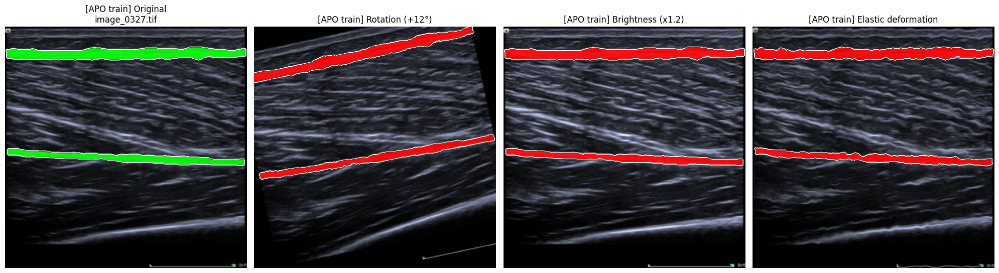

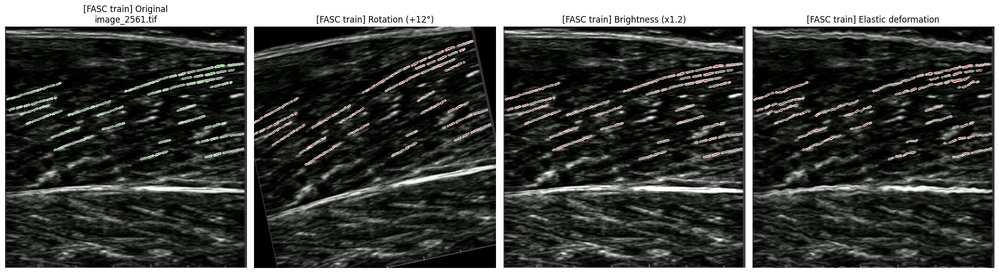

In [10]:
# ============================================================
# DIAGNOSTICS — each transformation isolated, one at a time,
# on a fixed image for APO train and FASC train
# ============================================================
import matplotlib.pyplot as plt
import matplotlib.colors
import numpy as np
import random
from PIL import Image
import torchvision.transforms.functional as TF
from scipy.ndimage import binary_dilation

def overlay_mask(ax, mask_arr, color='lime', alpha=0.9, outline_thickness=2):
    mask_vis = np.ma.masked_where(mask_arr == 0, mask_arr)
    ax.imshow(mask_vis, cmap=matplotlib.colors.ListedColormap([color]), alpha=alpha)
    outline = binary_dilation(mask_arr > 0, iterations=outline_thickness) & ~(mask_arr > 0)
    outline_vis = np.ma.masked_where(~outline, outline)
    ax.imshow(outline_vis, cmap=matplotlib.colors.ListedColormap(['white']), alpha=1.0)

# --- isolated versions of the single transformations (same logic as _augment, but forced) ---
def rotation_only(img, mask, angle=12):
    img_r = np.array(TF.rotate(Image.fromarray((img * 255).astype(np.uint8)), angle)).astype(np.float32) / 255.0
    mask_r = (np.array(TF.rotate(Image.fromarray((mask * 255).astype(np.uint8)), angle, fill=0)) > 127).astype(np.float32)
    return img_r, mask_r

def brightness_only(img, mask, factor=1.2):
    return np.clip(img * factor, 0, 1), mask.copy()

def elastic_deformation_only(img, mask, alpha=30, sigma=5):
    return elastic_deformation(img.copy(), mask.copy(), alpha=alpha, sigma=sigma)

def show_each_transformation(noaug_dataset, idx, title):
    img_t, mask_t, meta = noaug_dataset[idx]
    img_arr = img_t.permute(1, 2, 0).numpy()
    mask_arr = mask_t.squeeze(0).numpy()

    transformations = [
        ("Original", img_arr, mask_arr),
        ("Rotation (+12°)", *rotation_only(img_arr, mask_arr)),
        ("Brightness (x1.2)", *brightness_only(img_arr, mask_arr)),
        ("Elastic deformation", *elastic_deformation_only(img_arr, mask_arr)),
    ]

    fig, axes = plt.subplots(1, 4, figsize=(20, 5.5))
    for ax, (name, im, mk) in zip(axes, transformations):
        ax.imshow(im)
        overlay_mask(ax, mk, color='red' if name != "Original" else 'lime')
        ax.set_title(f"[{title}] {name}\n{meta['filename']}" if name == "Original" else f"[{title}] {name}")
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# --- APO ---
train_ds_noaug = UltrasoundDataset(idir, mdir, pd.read_csv('apo_boxes.csv').set_index('image_name'),
                                     train_ds.filenames, augment=False)
random.seed(1)
idx_apo = random.randint(0, len(train_ds_noaug) - 1)
show_each_transformation(train_ds_noaug, idx_apo, "APO train")

# --- FASC ---
train_ds_f_noaug = UltrasoundDataset(idir_f, mdir_f, pd.read_csv('fasc_boxes.csv').set_index('image_name'),
                                       train_ds_f.filenames, augment=False)
idx_fasc = random.randint(0, len(train_ds_f_noaug) - 1)
show_each_transformation(train_ds_f_noaug, idx_fasc, "FASC train")

This cell defines two utilities shared by both the APO and FASC models. `iou_score()`
computes batched Intersection-over-Union on thresholded sigmoid predictions, matching
the IoU definition used as the primary model-selection metric in Ritsche et al. (see
the IoU(A,B) formula in their "Neural network training" section). `mask_to_original_size()`
inverts the T3-T2-T1 preprocessing chain, pasting a NET_SIZE prediction back onto its
512x512 crop location and then resizing to the original image dimensions — this is
what lets us later measure distances in the same pixel space as the scale bar for mm
calibration.

In [11]:
# ============================================================
# UTILITIES COMMON TO ANY MODEL (metric + T1-T2-T3 inversion)
# ============================================================
def iou_score(pred_logits, target, thr=0.5, eps=1e-7):
    pred = (torch.sigmoid(pred_logits) > thr).float()
    inter = (pred * target).sum(dim=(1, 2, 3))
    union = pred.sum(dim=(1, 2, 3)) + target.sum(dim=(1, 2, 3)) - inter
    return ((inter + eps) / (union + eps)).mean().item()

def mask_to_original_size(pred_net, meta):
    """Inverts T3 -> T2 -> T1 to map the prediction (net_size) back to the original dimensions."""
    x_min, y_min, w, h = meta['box_512']
    orig_w, orig_h = meta['orig_size']
    pred_box = Image.fromarray((pred_net * 255).astype(np.uint8)).resize((w, h), resample=Image.NEAREST)
    canvas_512 = Image.new('L', (512, 512), 0)
    canvas_512.paste(pred_box, (x_min, y_min))
    canvas_orig = canvas_512.resize((orig_w, orig_h), resample=Image.NEAREST)
    return (np.array(canvas_orig) > 127).astype(np.uint8)

### GOOGLE DRIVE + GENERIC CHECKPOINTS

This cell mounts Google Drive, since Colab runtimes are ephemeral and training
progress and best weights need to live outside the container, and defines a reusable
checkpoint-path helper. Given a `model_name`, it returns paths for the best-IoU
checkpoint, the latest checkpoint for resuming after a disconnect, and a CSV training
history log. It's reused as-is for both the APO and FASC models by simply changing
`model_name`.

In [12]:
# ============================================================
# GOOGLE DRIVE + GENERIC CHECKPOINTS
# Reusable as-is for any new model: just change
# model_name to get a dedicated subfolder/files.
# ============================================================
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

def setup_checkpoint_paths(model_name, base_dir='/content/drive/MyDrive/UMUD_checkpoints'):
    os.makedirs(base_dir, exist_ok=True)
    return {
        'best': os.path.join(base_dir, f'{model_name}_best.pt'),
        'last': os.path.join(base_dir, f'{model_name}_last.pt'),
        'history': os.path.join(base_dir, f'{model_name}_history.csv'),
    }

# usage example for a new model:
# ckpt_paths = setup_checkpoint_paths('apo_new_model')

Mounted at /content/drive


## **APO MODEL** — ConvBlock / DecoderBlock / UNet

This cell defines a standard U-Net (Ronneberger et al. 2015), trained from scratch.

`ConvBlock` is two 3x3 conv+BN+ReLU layers with "same" padding, changing channels from
`in_ch` to `out_ch` while leaving spatial size unchanged. `DecoderBlock` performs
learned 2x2 stride-2 upsampling via `ConvTranspose2d`, concatenates the matching
encoder skip connection, then applies a `ConvBlock` to fuse channels back down. The
full `UNet` is a symmetric 4-level encoder/decoder, going 64 to 128 to 256 to 512 to a
1024-channel bottleneck, with skip connections at every resolution and a single 1x1
output conv producing raw logits — no sigmoid, since `BCEWithLogitsLoss` applies it
internally for numerical stability.

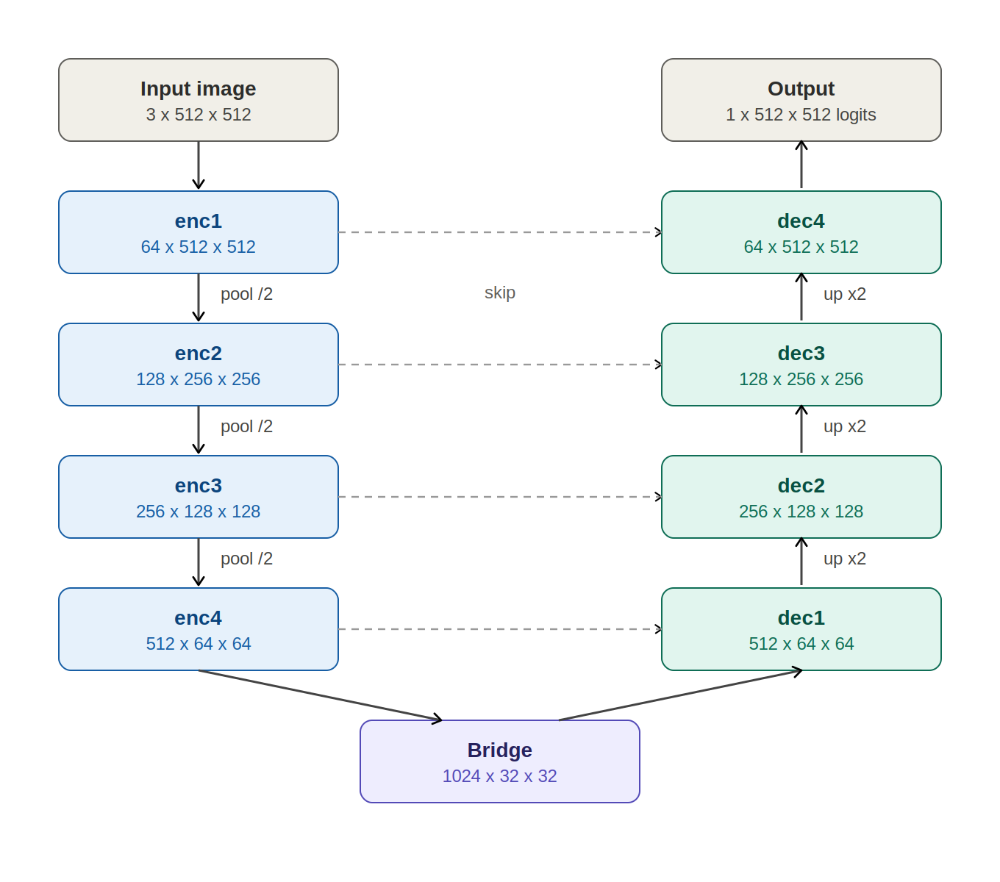

*Figure: the U-Net used for both the aponeurosis and fascicle models — a
symmetric encoder/decoder with skip connections, instantiated twice (once
per task) with identical architecture.*

In [13]:
import torch
import torch.nn as nn

# ============================================================
# BUILDING BLOCK 1: ConvBlock
# ------------------------------------------------------------
# Basic unit of the U-Net. Does NOT change spatial size (H, W) —
# padding=1 with a 3x3 kernel keeps H and W identical ("same"
# padding). Only changes the number of channels, in_ch -> out_ch.
# Two conv layers are stacked: the first changes channel count,
# the second refines features at the new depth. BatchNorm
# stabilizes training, ReLU adds non-linearity.
# ============================================================
class ConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.block(x)


# ============================================================
# BUILDING BLOCK 2: DecoderBlock
# ------------------------------------------------------------
# Mirror-image operation on the way back up:
#   1. ConvTranspose2d: learned upsampling (trainable weights),
#      kernel=2, stride=2 exactly doubles H and W.
#   2. Concatenation with the skip connection from the encoder,
#      so the decoder can recover fine spatial detail lost
#      during downsampling.
#   3. ConvBlock: fuses the concatenated features back down to
#      a clean channel count.
# ============================================================
class DecoderBlock(nn.Module):
    def __init__(self, in_ch, skip_ch, out_ch):
        super().__init__()
        self.up = nn.ConvTranspose2d(in_ch, out_ch, kernel_size=2, stride=2)
        self.conv = ConvBlock(out_ch + skip_ch, out_ch)

    def forward(self, x, skip):
        x = self.up(x)
        x = torch.cat([x, skip], dim=1)
        return self.conv(x)

In [14]:
# ============================================================
# FULL MODEL: classic U-Net, trained from scratch (no pretrained
# weights). Symmetric encoder/decoder: every downsampling step
# on the way down is mirrored by an upsampling step of the same
# magnitude on the way up, and every resolution level is handed
# across via a skip connection.
# ============================================================
class UNet(nn.Module):
    def __init__(self, in_ch=3):
        super().__init__()

        # ---------------- ENCODER (contracting path) ----------------
        self.enc1 = ConvBlock(in_ch, 64)      # -> s1: (B,  64, 512, 512)
        self.pool1 = nn.MaxPool2d(2)          # -> (B,  64, 256, 256)

        self.enc2 = ConvBlock(64, 128)        # -> s2: (B, 128, 256, 256)
        self.pool2 = nn.MaxPool2d(2)          # -> (B, 128, 128, 128)

        self.enc3 = ConvBlock(128, 256)       # -> s3: (B, 256, 128, 128)
        self.pool3 = nn.MaxPool2d(2)          # -> (B, 256,  64,  64)

        self.enc4 = ConvBlock(256, 512)       # -> s4: (B, 512,  64,  64)
        self.pool4 = nn.MaxPool2d(2)          # -> (B, 512,  32,  32)

        # ---------------- BRIDGE (bottleneck) ----------------
        self.bridge = ConvBlock(512, 1024)    # -> (B, 1024, 32, 32)

        # ---------------- DECODER (expanding path) ----------------
        self.dec1 = DecoderBlock(1024, 512, 512)  # bridge + s4 -> (B, 512, 64, 64)
        self.dec2 = DecoderBlock(512, 256, 256)   # dec1   + s3 -> (B, 256, 128, 128)
        self.dec3 = DecoderBlock(256, 128, 128)   # dec2   + s2 -> (B, 128, 256, 256)
        self.dec4 = DecoderBlock(128, 64, 64)     # dec3   + s1 -> (B,  64, 512, 512)

        # ---------------- OUTPUT HEAD ----------------
        # 1x1 conv: recombines the 64 channels at each pixel into
        # a single raw logit (pre-sigmoid). BCEWithLogitsLoss
        # applies sigmoid internally in a numerically stable way;
        # apply torch.sigmoid() manually only at inference time.
        self.out_conv = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, x):
        # encoder: save skip tensors BEFORE pooling
        s1 = self.enc1(x);   x = self.pool1(s1)
        s2 = self.enc2(x);   x = self.pool2(s2)
        s3 = self.enc3(x);   x = self.pool3(s3)
        s4 = self.enc4(x);   x = self.pool4(s4)

        # bridge
        b1 = self.bridge(x)

        # decoder: feed matching skip tensor into each stage
        d1 = self.dec1(b1, s4)
        d2 = self.dec2(d1, s3)
        d3 = self.dec3(d2, s2)
        d4 = self.dec4(d3, s1)

        return self.out_conv(d4)  # (B, 1, 512, 512) logits

### APO model instantiation, optimizer, scheduler, checkpoint paths

This cell instantiates a fresh UNet for the aponeurosis segmentation task.
Optimizer and scheduler hyperparameters mirror those reported in Ritsche et al.: Adam
with lr=1e-3, betas=(0.9, 0.999), eps=1e-7, and `ReduceLROnPlateau` with factor=0.1,
patience=10, min_lr=1e-5 on validation loss, with `BCEWithLogitsLoss` handling the
class imbalance between aponeurosis pixels and background. Checkpoint paths point at
Google Drive so training can resume across Colab sessions.

In [15]:
import os
import torch

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Using device:", DEVICE)

# Single model for the aponeurosis task, original U-Net design
apo_model_unet = UNet(in_ch=3).to(DEVICE)

apo_optimizer = torch.optim.Adam(apo_model_unet.parameters(), lr=1e-3, betas=(0.9, 0.999), eps=1e-7)
apo_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(apo_optimizer, mode='min', factor=0.1, patience=10, min_lr=1e-5)
apo_criterion = nn.BCEWithLogitsLoss()

APO_CKPT_DIR = '/content/drive/MyDrive/UMUD_checkpoints'
os.makedirs(APO_CKPT_DIR, exist_ok=True)
APO_CKPT_PATH = os.path.join(APO_CKPT_DIR, 'apo_model_unet_best.pt')
APO_LAST_CKPT_PATH = os.path.join(APO_CKPT_DIR, 'apo_model_unet_last.pt')
APO_HISTORY_PATH = os.path.join(APO_CKPT_DIR, 'apo_model_unet_history.csv')

print("APO_LAST_CKPT_PATH:", repr(APO_LAST_CKPT_PATH))
print("Exists?", os.path.exists(APO_LAST_CKPT_PATH))
print("\nAPO_CKPT_DIR contents:")
print(os.listdir(APO_CKPT_DIR) if os.path.exists(APO_CKPT_DIR) else "❌ folder not found from this runtime")

Using device: cuda
APO_LAST_CKPT_PATH: '/content/drive/MyDrive/UMUD_checkpoints/apo_model_unet_last.pt'
Exists? True

APO_CKPT_DIR contents:
['history.csv', 'apo_model_unet_best.pt', 'apo_model_unet_history.csv', 'apo_model_unet_last.pt', 'results', 'submissions', 'fasc_loss_curve.png', 'fasc_model_unet_last.pt', 'fasc_model_unet_best.pt', 'fasc_model_unet_history_full.csv']


This cell adds resume support: if a "last" checkpoint already exists in Drive, from a
previous and possibly disconnected Colab session, it reloads the model, optimizer and
scheduler state, `best_iou`, the plateau counter and the CSV training history, so
training continues from exactly where it left off instead of restarting from epoch 0.

In [16]:
import csv

apo_start_epoch = 0
apo_best_iou = 0.0
apo_plateau_epochs = 0
apo_history = {'epoch': [], 'train_loss': [], 'val_loss': [], 'train_iou': [], 'val_iou': [], 'lr': []}

if os.path.exists(APO_LAST_CKPT_PATH):
    ckpt = torch.load(APO_LAST_CKPT_PATH, map_location=DEVICE)
    apo_model_unet.load_state_dict(ckpt['model_state'])
    apo_optimizer.load_state_dict(ckpt['optimizer_state'])
    apo_scheduler.load_state_dict(ckpt['scheduler_state'])
    apo_start_epoch = ckpt['epoch'] + 1
    apo_best_iou = ckpt['best_iou']
    apo_plateau_epochs = ckpt['plateau_epochs']
    print(f"✅ Resumed from epoch {apo_start_epoch}, best_iou so far = {apo_best_iou:.4f}")

    if os.path.exists(APO_HISTORY_PATH):
        with open(APO_HISTORY_PATH, 'r') as f:
            reader = csv.DictReader(f)
            for row in reader:
                for k in apo_history:
                    apo_history[k].append(float(row[k]) if k != 'epoch' else int(row[k]))
        print(f"✅ History restored: {len(apo_history['epoch'])} epochs already logged")
else:
    print("No checkpoint found, starting from scratch.")

✅ Resumed from epoch 50, best_iou so far = 0.6715
✅ History restored: 50 epochs already logged


In [17]:
import time
import random
from IPython.display import clear_output
import matplotlib.pyplot as plt

# Pick ONE fixed validation index to monitor throughout training,
# so the same image is compared across epochs (not a new random one each time)
random.seed(1)
APO_IDX_MONITOR = random.randint(0, len(val_ds) - 1)
print(f"Validation image monitored during training: idx={APO_IDX_MONITOR}, "
      f"filename={val_ds.filenames[APO_IDX_MONITOR]}")


def apo_save_checkpoint(epoch, is_best):
    state = {
        'epoch': epoch, 'model_state': apo_model_unet.state_dict(),
        'optimizer_state': apo_optimizer.state_dict(), 'scheduler_state': apo_scheduler.state_dict(),
        'best_iou': apo_best_iou, 'plateau_epochs': apo_plateau_epochs,
    }
    torch.save(state, APO_LAST_CKPT_PATH)  # always, for resume
    if is_best:
        torch.save(state, APO_CKPT_PATH)   # only if it's the best so far


def apo_save_history_csv():
    with open(APO_HISTORY_PATH, 'w', newline='') as f:
        writer = csv.writer(f)
        writer.writerow(apo_history.keys())
        writer.writerows(zip(*apo_history.values()))


def apo_plot_history():
    clear_output(wait=True)

    # row 1: loss and IoU curves
    fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))
    axes[0].plot(apo_history['epoch'], apo_history['train_loss'], label='Train loss', marker='o', ms=3)
    axes[0].plot(apo_history['epoch'], apo_history['val_loss'], label='Val loss', marker='o', ms=3)
    axes[0].set_title('Loss per epoch [APO]'); axes[0].legend(); axes[0].grid(alpha=0.3)
    axes[1].plot(apo_history['epoch'], apo_history['train_iou'], label='Train IoU', marker='o', ms=3)
    axes[1].plot(apo_history['epoch'], apo_history['val_iou'], label='Val IoU', marker='o', ms=3)
    axes[1].set_title('IoU per epoch [APO]'); axes[1].legend(); axes[1].grid(alpha=0.3); axes[1].set_ylim(0, 1)
    plt.tight_layout(); plt.show()

    # row 2: live preview on the fixed monitored validation image
    apo_model_unet.eval()
    img_t, mask_t, meta = val_ds[APO_IDX_MONITOR]
    with torch.no_grad():
        logits = apo_model_unet(img_t.unsqueeze(0).to(DEVICE))
        prob = torch.sigmoid(logits)[0, 0].cpu().numpy()
    mask_true = mask_t.squeeze(0).numpy()
    img_arr = img_t.permute(1, 2, 0).numpy()
    iou_monitor = iou_score(logits, mask_t.unsqueeze(0).to(DEVICE))

    p_min, p_max, p_mean = prob.min(), prob.max(), prob.mean()

    fig2, axes2 = plt.subplots(1, 3, figsize=(15, 4.5))
    axes2[0].imshow(img_arr); axes2[0].set_title(f"Input\n{meta['filename']}"); axes2[0].axis('off')
    axes2[1].imshow(mask_true, cmap='gray'); axes2[1].set_title("Ground truth mask"); axes2[1].axis('off')

    im = axes2[2].imshow(prob, cmap='inferno', vmin=0, vmax=1)
    axes2[2].set_title(
        f"Probability heatmap (epoch {apo_history['epoch'][-1]})\n"
        f"IoU={iou_monitor:.3f} | min={p_min:.3f} max={p_max:.3f} mean={p_mean:.3f}"
    )
    axes2[2].axis('off')
    fig2.colorbar(im, ax=axes2[2], fraction=0.046, pad=0.04)

    plt.tight_layout(); plt.show()

    n_show = min(5, len(apo_history['epoch']))
    print(f"{'Epoch':>6} {'TrLoss':>8} {'VaLoss':>8} {'TrIoU':>7} {'VaIoU':>7} {'LR':>9}")
    for i in range(-n_show, 0):
        marker = " *" if apo_history['val_iou'][i] == apo_best_iou else ""
        print(f"{apo_history['epoch'][i]:>6} {apo_history['train_loss'][i]:>8.4f} {apo_history['val_loss'][i]:>8.4f} "
              f"{apo_history['train_iou'][i]:>7.4f} {apo_history['val_iou'][i]:>7.4f} {apo_history['lr'][i]:>9.1e}{marker}")

Validation image monitored during training: idx=17, filename=image_0757.tif


### APO training loop

This cell runs the standard supervised training loop for the aponeurosis U-Net:
forward pass, `BCEWithLogitsLoss`, backward pass, Adam step, tracking running loss and
IoU per epoch on both train and val splits. The learning rate is reduced on a
validation-loss plateau, and training stops early once the LR has bottomed out at
1e-5 and validation IoU hasn't improved for 8 further epochs.
Checkpointing and the live dashboard run once per epoch. We also show the prediction for a random selected validation image at the end of each epoch.

### Loss function and evaluation metric

Training uses `BCEWithLogitsLoss`, PyTorch's numerically stable combination of a sigmoid activation and binary cross-entropy, applied per pixel to the raw output logits. For a single pixel with ground-truth label y ∈ {0, 1} and predicted logit z, the loss is:

BCE(z, y) = −[y · log(σ(z)) + (1 − y) · log(1 − σ(z))]

where σ is the sigmoid function. The final loss is the mean of this quantity over all pixels in the mask. We apply sigmoid and BCE together in one function rather than separately, since computing them jointly avoids the numerical instability (log(0)) that can occur when sigmoid saturates. T

Alongside the loss, we track Intersection-over-Union (IoU) as a separate reference metric, computed by `iou_score()`. Unlike BCE, IoU is not used to drive backpropagation, it is only used to monitor training progress and to select the best checkpoint. It is computed on the thresholded binary prediction rather than the raw probabilities, following the same definition used in Ritsche et al.:

IoU(A, B) = |A ∩ B| / (|A| + |B| − |A ∩ B|)

where A is the ground-truth mask and B is the thresholded model prediction. IoU ranges from 0 (no overlap) to 1 (perfect overlap), and is generally more interpretable than the raw loss value since it directly reflects how well the predicted mask spatially matches the ground truth, rather than a pixel-wise probability error.

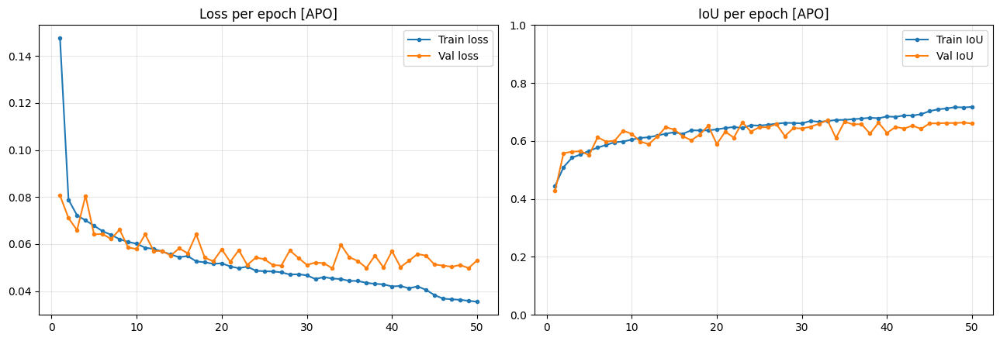

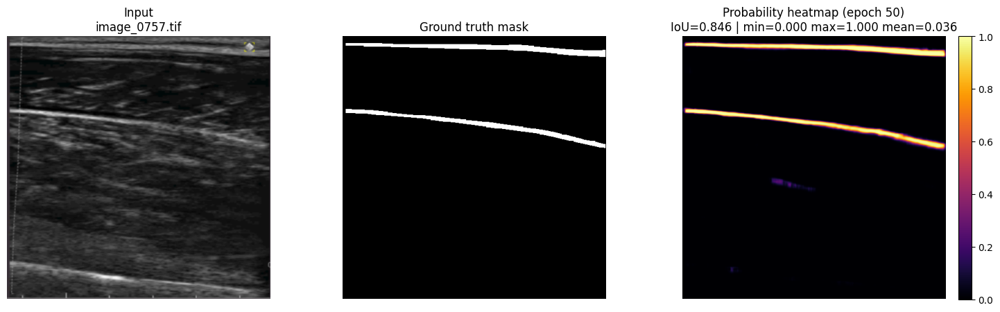

 Epoch   TrLoss   VaLoss   TrIoU   VaIoU        LR
    46   0.0368   0.0509  0.7093  0.6610   1.0e-04
    47   0.0365   0.0504  0.7123  0.6621   1.0e-04
    48   0.0363   0.0511  0.7168  0.6620   1.0e-04
    49   0.0359   0.0498  0.7157  0.6635   1.0e-04
    50   0.0355   0.0531  0.7177  0.6602   1.0e-04

Best val_iou aponeurosis: 0.6715


In [ ]:
from tqdm.auto import tqdm

APO_MAX_EPOCHS = 50

for epoch in range(apo_start_epoch, APO_MAX_EPOCHS):
    t0 = time.time()
    apo_model_unet.train()
    train_loss, train_iou = 0.0, 0.0
    pbar = tqdm(train_loader, desc=f"[APO] Epoch {epoch+1}/{APO_MAX_EPOCHS} [train]", leave=False)
    for imgs, masks in pbar:
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        apo_optimizer.zero_grad()
        out = apo_model_unet(imgs)
        loss = apo_criterion(out, masks)
        loss.backward()
        apo_optimizer.step()
        batch_iou = iou_score(out.detach(), masks)
        train_loss += loss.item() * imgs.size(0)
        train_iou += batch_iou * imgs.size(0)
        pbar.set_postfix(loss=f"{loss.item():.4f}", iou=f"{batch_iou:.4f}")
    train_loss /= len(train_loader.dataset)
    train_iou /= len(train_loader.dataset)

    apo_model_unet.eval()
    val_loss, val_iou = 0.0, 0.0
    pbar = tqdm(val_loader, desc=f"[APO] Epoch {epoch+1}/{APO_MAX_EPOCHS} [val]", leave=False)
    with torch.no_grad():
        for imgs, masks in pbar:
            imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
            out = apo_model_unet(imgs)
            l = apo_criterion(out, masks).item()
            i = iou_score(out, masks)
            val_loss += l * imgs.size(0)
            val_iou += i * imgs.size(0)
            pbar.set_postfix(loss=f"{l:.4f}", iou=f"{i:.4f}")
    val_loss /= len(val_loader.dataset)
    val_iou /= len(val_loader.dataset)

    apo_scheduler.step(val_loss)
    lr_now = apo_optimizer.param_groups[0]['lr']
    dt = time.time() - t0

    apo_history['epoch'].append(epoch + 1)
    apo_history['train_loss'].append(train_loss)
    apo_history['val_loss'].append(val_loss)
    apo_history['train_iou'].append(train_iou)
    apo_history['val_iou'].append(val_iou)
    apo_history['lr'].append(lr_now)
    apo_save_history_csv()

    is_best = val_iou > apo_best_iou
    if is_best:
        apo_best_iou = val_iou
        apo_plateau_epochs = 0
        flag = " ⭐ new best"
    else:
        apo_plateau_epochs += 1
        flag = f" (plateau {apo_plateau_epochs}/8 after min lr)"

    apo_save_checkpoint(epoch, is_best)

    print(f"[APO] Epoch {epoch+1}: train_loss={train_loss:.4f} val_loss={val_loss:.4f} "
          f"train_iou={train_iou:.4f} val_iou={val_iou:.4f} lr={lr_now:.1e} time={dt:.1f}s{flag}")
    apo_plot_history()

    if lr_now <= 1e-5 and apo_plateau_epochs >= 8:
        print("Early stopping.")
        break

print(f"\nBest val_iou aponeurosis: {apo_best_iou:.4f}")



## FASC MODEL — model instantiation, optimizer, scheduler, checkpoints

This cell sets up a second, independent U-Net instance for fascicle segmentation, with
the same architecture and hyperparameters as the APO model above. This part of the code follows the same logic of the apo model.

In [18]:
# ============================================================
# FASCICLE MODEL — same U-Net architecture, separate instance
# ============================================================
fasc_model_unet = UNet(in_ch=3).to(DEVICE)

fasc_optimizer = torch.optim.Adam(fasc_model_unet.parameters(), lr=1e-3, betas=(0.9, 0.999), eps=1e-7)
fasc_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(fasc_optimizer, mode='min', factor=0.1, patience=10, min_lr=1e-5)
fasc_criterion = nn.BCEWithLogitsLoss()

fasc_ckpt_paths = setup_checkpoint_paths('fasc_model_unet')
FASC_CKPT_PATH = fasc_ckpt_paths['best']
FASC_LAST_CKPT_PATH = fasc_ckpt_paths['last']
FASC_HISTORY_PATH = fasc_ckpt_paths['history']

print("FASC_LAST_CKPT_PATH:", repr(FASC_LAST_CKPT_PATH))
print("Exists?", os.path.exists(FASC_LAST_CKPT_PATH))

FASC_LAST_CKPT_PATH: '/content/drive/MyDrive/UMUD_checkpoints/fasc_model_unet_last.pt'
Exists? True


In [19]:
import csv

fasc_start_epoch = 0
fasc_best_iou = 0.0
fasc_plateau_epochs = 0
fasc_history = {'epoch': [], 'train_loss': [], 'val_loss': [], 'train_iou': [], 'val_iou': [], 'lr': []}
fasc_best_val_loss = float('inf')  # <-- AGGIUNGI QUESTA RIGA

if os.path.exists(FASC_LAST_CKPT_PATH):
    ckpt = torch.load(FASC_LAST_CKPT_PATH, map_location=DEVICE)
    fasc_model_unet.load_state_dict(ckpt['model_state'])
    fasc_optimizer.load_state_dict(ckpt['optimizer_state'])
    fasc_scheduler.load_state_dict(ckpt['scheduler_state'])
    fasc_start_epoch = ckpt['epoch'] + 1
    fasc_best_iou = ckpt['best_iou']
    fasc_plateau_epochs = ckpt['plateau_epochs']
    fasc_best_val_loss = ckpt.get('best_val_loss', float('inf'))
    print(f"✅ Resumed from epoch {fasc_start_epoch}, best_iou so far = {fasc_best_iou:.4f}")

    if os.path.exists(FASC_HISTORY_PATH):
        with open(FASC_HISTORY_PATH, 'r') as f:
            reader = csv.DictReader(f)
            for row in reader:
                for k in fasc_history:
                    fasc_history[k].append(float(row[k]) if k != 'epoch' else int(row[k]))
        print(f"✅ History restored: {len(fasc_history['epoch'])} epochs already logged")
else:
    print("No checkpoint found, starting from scratch.")

✅ Resumed from epoch 50, best_iou so far = 0.0646


In [20]:
import time
import random
from IPython.display import clear_output
import matplotlib.pyplot as plt

random.seed(1)
FASC_IDX_MONITOR = random.randint(0, len(val_ds_f) - 1)
print(f"Validation image monitored during training: idx={FASC_IDX_MONITOR}, "
      f"filename={val_ds_f.filenames[FASC_IDX_MONITOR]}")


def fasc_save_checkpoint(epoch, is_best):
    state = {
        'epoch': epoch, 'model_state': fasc_model_unet.state_dict(),
        'optimizer_state': fasc_optimizer.state_dict(), 'scheduler_state': fasc_scheduler.state_dict(),
        'best_iou': fasc_best_iou, 'best_val_loss': fasc_best_val_loss, 'plateau_epochs': fasc_plateau_epochs,
    }
    torch.save(state, FASC_LAST_CKPT_PATH)
    if is_best:
        torch.save(state, FASC_CKPT_PATH)


def fasc_save_history_csv():
    with open(FASC_HISTORY_PATH, 'w', newline='') as f:
        writer = csv.writer(f)
        writer.writerow(fasc_history.keys())
        writer.writerows(zip(*fasc_history.values()))


def fasc_plot_history():
    clear_output(wait=True)

    fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))
    axes[0].plot(fasc_history['epoch'], fasc_history['train_loss'], label='Train loss', marker='o', ms=3)
    axes[0].plot(fasc_history['epoch'], fasc_history['val_loss'], label='Val loss', marker='o', ms=3)
    axes[0].set_title('Loss per epoch [FASC]'); axes[0].legend(); axes[0].grid(alpha=0.3)
    axes[1].plot(fasc_history['epoch'], fasc_history['train_iou'], label='Train IoU', marker='o', ms=3)
    axes[1].plot(fasc_history['epoch'], fasc_history['val_iou'], label='Val IoU', marker='o', ms=3)
    axes[1].set_title('IoU per epoch [FASC]'); axes[1].legend(); axes[1].grid(alpha=0.3); axes[1].set_ylim(0, 1)
    plt.tight_layout(); plt.show()

    fasc_model_unet.eval()
    img_t, mask_t, meta = val_ds_f[FASC_IDX_MONITOR]
    with torch.no_grad():
        logits = fasc_model_unet(img_t.unsqueeze(0).to(DEVICE))
        prob = torch.sigmoid(logits)[0, 0].cpu().numpy()
    mask_true = mask_t.squeeze(0).numpy()
    img_arr = img_t.permute(1, 2, 0).numpy()
    iou_monitor = iou_score(logits, mask_t.unsqueeze(0).to(DEVICE))

    p_min, p_max, p_mean = prob.min(), prob.max(), prob.mean()

    fig2, axes2 = plt.subplots(1, 3, figsize=(15, 4.5))
    axes2[0].imshow(img_arr); axes2[0].set_title(f"Input\n{meta['filename']}"); axes2[0].axis('off')
    axes2[1].imshow(mask_true, cmap='gray'); axes2[1].set_title("Ground truth mask"); axes2[1].axis('off')

    im = axes2[2].imshow(prob, cmap='inferno', vmin=0, vmax=1)
    axes2[2].set_title(
        f"Probability heatmap (epoch {fasc_history['epoch'][-1]})\n"
        f"IoU={iou_monitor:.3f} | min={p_min:.3f} max={p_max:.3f} mean={p_mean:.3f}"
    )
    axes2[2].axis('off')
    fig2.colorbar(im, ax=axes2[2], fraction=0.046, pad=0.04)

    plt.tight_layout(); plt.show()

    n_show = min(5, len(fasc_history['epoch']))
    print(f"{'Epoch':>6} {'TrLoss':>8} {'VaLoss':>8} {'TrIoU':>7} {'VaIoU':>7} {'LR':>9}")
    for i in range(-n_show, 0):
        marker = " *" if fasc_history['val_iou'][i] == fasc_best_iou else ""
        print(f"{fasc_history['epoch'][i]:>6} {fasc_history['train_loss'][i]:>8.4f} {fasc_history['val_loss'][i]:>8.4f} "
              f"{fasc_history['train_iou'][i]:>7.4f} {fasc_history['val_iou'][i]:>7.4f} {fasc_history['lr'][i]:>9.1e}{marker}")

Validation image monitored during training: idx=68, filename=image_2176.tif


In [56]:
from tqdm.auto import tqdm

FASC_MAX_EPOCHS = 50

for epoch in range(fasc_start_epoch, FASC_MAX_EPOCHS):
    t0 = time.time()
    fasc_model_unet.train()
    train_loss, train_iou = 0.0, 0.0
    pbar = tqdm(train_loader_f, desc=f"[FASC] Epoch {epoch+1}/{FASC_MAX_EPOCHS} [train]", leave=False)
    for imgs, masks in pbar:
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        fasc_optimizer.zero_grad()
        out = fasc_model_unet(imgs)
        loss = fasc_criterion(out, masks)
        loss.backward()
        fasc_optimizer.step()
        batch_iou = iou_score(out.detach(), masks)
        train_loss += loss.item() * imgs.size(0)
        train_iou += batch_iou * imgs.size(0)
        pbar.set_postfix(loss=f"{loss.item():.4f}", iou=f"{batch_iou:.4f}")
    train_loss /= len(train_loader_f.dataset)
    train_iou /= len(train_loader_f.dataset)

    fasc_model_unet.eval()
    val_loss, val_iou = 0.0, 0.0
    pbar = tqdm(val_loader_f, desc=f"[FASC] Epoch {epoch+1}/{FASC_MAX_EPOCHS} [val]", leave=False)
    with torch.no_grad():
        for imgs, masks in pbar:
            imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
            out = fasc_model_unet(imgs)
            l = fasc_criterion(out, masks).item()
            i = iou_score(out, masks)
            val_loss += l * imgs.size(0)
            val_iou += i * imgs.size(0)
            pbar.set_postfix(loss=f"{l:.4f}", iou=f"{i:.4f}")
    val_loss /= len(val_loader_f.dataset)
    val_iou /= len(val_loader_f.dataset)

    fasc_scheduler.step(val_loss)
    lr_now = fasc_optimizer.param_groups[0]['lr']
    dt = time.time() - t0

    fasc_history['epoch'].append(epoch + 1)
    fasc_history['train_loss'].append(train_loss)
    fasc_history['val_loss'].append(val_loss)
    fasc_history['train_iou'].append(train_iou)
    fasc_history['val_iou'].append(val_iou)
    fasc_history['lr'].append(lr_now)
    fasc_save_history_csv()

    is_best = val_loss < fasc_best_val_loss
    if is_best:
        fasc_best_val_loss = val_loss
        fasc_plateau_epochs = 0
        flag = " ⭐ new best (val_loss)"
    else:
        fasc_plateau_epochs += 1
        flag = f" (plateau {fasc_plateau_epochs}/8 after min lr)"

    if val_iou > fasc_best_iou:  # tengo traccia comunque, solo per stampa/riferimento
        fasc_best_iou = val_iou

    fasc_save_checkpoint(epoch, is_best)

    print(f"[FASC] Epoch {epoch+1}: train_loss={train_loss:.4f} val_loss={val_loss:.4f} "
          f"train_iou={train_iou:.4f} val_iou={val_iou:.4f} lr={lr_now:.1e} time={dt:.1f}s{flag}")
    fasc_plot_history()

    if lr_now <= 1e-5 and fasc_plateau_epochs >= 8:
        print("Early stopping.")
        break

print(f"\nBest val_iou fascicles: {fasc_best_iou:.4f}")


Best val_iou fascicles: 0.0646


[APO] caching val probs:   0%|          | 0/35 [00:00<?, ?it/s]

[APO] sweeping thresholds:   0%|          | 0/19 [00:00<?, ?it/s]

[APO] best threshold = 0.40  (val IoU = 0.6646)


[FASC] caching val probs:   0%|          | 0/92 [00:00<?, ?it/s]

[FASC] sweeping thresholds:   0%|          | 0/19 [00:00<?, ?it/s]

[FASC] best threshold = 0.15  (val IoU = 0.2009)


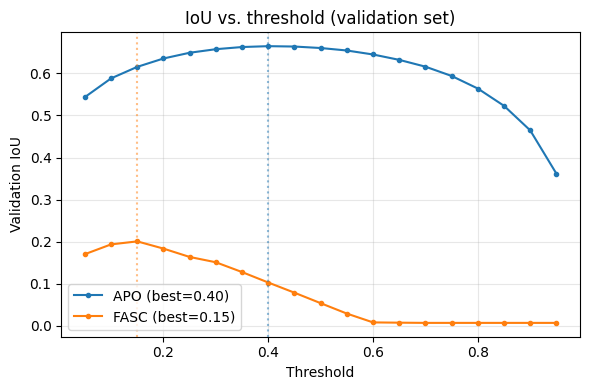

In [22]:
# ============================================================
# THRESHOLD TUNING (validation set) — APO and FASC, separately
# ============================================================
import torch
import numpy as np
from tqdm.auto import tqdm

THRESHOLD_GRID = np.round(np.arange(0.05, 0.96, 0.05), 2)

@torch.no_grad()
def tune_threshold(model, loader, device, thresholds=THRESHOLD_GRID, desc="model", eps=1e-7):
    """Caches sigmoid probabilities once, then scores every candidate threshold
    against the cached values (avoids re-running the forward pass per threshold).
    IoU is the same per-image formula as iou_score(), averaged over the val set."""
    model.eval()
    cached = []
    for imgs, masks in tqdm(loader, desc=f"[{desc}] caching val probs"):
        imgs = imgs.to(device)
        probs = torch.sigmoid(model(imgs)).cpu()
        cached.append((probs, masks))

    best_thr, best_iou = float(thresholds[0]), -1.0
    thr_ious = []
    for thr in tqdm(thresholds, desc=f"[{desc}] sweeping thresholds"):
        iou_sum, n = 0.0, 0
        for probs, masks in cached:
            pred = (probs > thr).float()
            inter = (pred * masks).sum(dim=(1, 2, 3))
            union = pred.sum(dim=(1, 2, 3)) + masks.sum(dim=(1, 2, 3)) - inter
            iou_sum += ((inter + eps) / (union + eps)).sum().item()
            n += masks.size(0)
        mean_iou = iou_sum / n
        thr_ious.append(mean_iou)
        if mean_iou > best_iou:
            best_iou, best_thr = mean_iou, float(thr)

    print(f"[{desc}] best threshold = {best_thr:.2f}  (val IoU = {best_iou:.4f})")
    return best_thr, best_iou, list(zip([float(t) for t in thresholds], thr_ious))


APO_BEST_THR, apo_best_val_iou, apo_thr_sweep = tune_threshold(
    apo_model_unet, val_loader, DEVICE, desc="APO"
)
FASC_BEST_THR, fasc_best_val_iou, fasc_thr_sweep = tune_threshold(
    fasc_model_unet, val_loader_f, DEVICE, desc="FASC"
)

import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(*zip(*apo_thr_sweep), marker='o', ms=3, label=f"APO (best={APO_BEST_THR:.2f})")
ax.plot(*zip(*fasc_thr_sweep), marker='o', ms=3, label=f"FASC (best={FASC_BEST_THR:.2f})")
ax.axvline(APO_BEST_THR, color='C0', linestyle=':', alpha=0.5)
ax.axvline(FASC_BEST_THR, color='C1', linestyle=':', alpha=0.5)
ax.set_xlabel('Threshold'); ax.set_ylabel('Validation IoU')
ax.set_title('IoU vs. threshold (validation set)')
ax.legend(); ax.grid(alpha=0.3)
plt.tight_layout(); plt.show()

## METRIC CALCULATIONS

This cell handles pixel-to-millimeter calibration. Ultrasound images typically embed a
physical scale bar, a set of tick marks, as part of the on-screen overlay. The raw UMUD competition images retain their original device overlays, so we have to
recover a sort of conversion rule `px_per_cm` ourselves before architecture measurements can be reported in mm.

This function is adapted verbatim from the UMUD competition baseline notebook's own
`collect_metadata()`, since scale-bar tick detection is highly format-specific, with
different pixel offsets and thresholds per ultrasound device or export format —
.png versus several fixed-resolution formats. For each image it detects tick-mark
positions along known fixed columns, infers `px_per_cm` from the spacing between the
first and second (major or minor) tick, and infers the scan bounding box (l, t, r, b)
from hard-coded offsets keyed to the number of ticks or the image shape. It's only
applied to the TEST set here, since that's the split with unlabeled data we ultimately
need to score; the assertion checks throughout are format-consistency guards inherited
from the baseline, and they're meant to fail loudly on an unrecognized image layout.

In [21]:
def collect_metadata(image_dir):
    """Determine px_per_cm and the bounding box for every image in image_dir.
    Verbatim logic from the UMUD baseline notebook's collect_metadata(),
    adapted only to take a directory (test_idir) instead of a glob pattern."""
    nt = []
    test_df = []
    for fname in sorted(os.listdir(image_dir)):
        path = os.path.join(image_dir, fname)
        px_per_cm = -1
        l, t, r, b = -1, -1, -1, -1
        filetype = path[-3:]
        with Image.open(path) as img:
            a = np.asarray(img)
        if len(a.shape) == 3:
            assert a.shape[2] == 3
        height, width = a.shape[:2]

        # Determine the scale (pixels per cm)
        if filetype == 'png':
            first_tick = np.argmax(a[:, 6].mean(axis=-1) > 50)
            second_minor_tick = 150 + np.argmax(a[150:, 6].mean(axis=-1) > 50)
            second_major_tick = 150 + np.argmax(a[150:, 9].mean(axis=-1) > 50)
            last_tick = len(a) - 1 - np.argmax(a[:, 6].mean(axis=-1)[::-1] > 50)
            if (second_major_tick - first_tick) < 3 * (second_minor_tick - first_tick):
                px_per_cm = second_major_tick - first_tick
            else:
                px_per_cm = second_minor_tick - first_tick
            hw = a.shape[1] // 2
            w2 = np.argmin(a[:, hw:].sum(axis=(0, 2)))
            l, t, r, b = hw - w2, first_tick, hw + w2, last_tick
            assert 2.8 < (r - l) / px_per_cm < 2.9
        elif a.shape == (800, 1200, 3):
            if (a[87, 1147:1157] == 175).all():
                assert (a[87, 1147:1157] == 175).all()
                first_tick = np.argmax(a[:, 1150].mean(axis=-1) > 50)
                second_major_tick = first_tick + 20 + np.argmax(a[first_tick + 20:, 1150].mean(axis=-1) > 50)
                last_tick = len(a) - 1 - np.argmax(a[:, 1150].mean(axis=-1)[::-1] > 50)
                n_ticks = (last_tick - first_tick) / (second_major_tick - first_tick)
                nt.append(n_ticks)
                n_ticks = round(n_ticks)
                if n_ticks <= 14:
                    px_per_cm = (last_tick - first_tick) / n_ticks * 2
                    if n_ticks == 7:
                        l, t, r, b = 142, 91, 1058, last_tick
                    elif n_ticks == 8:
                        l, t, r, b = 162, 91, 1038, last_tick
                    elif n_ticks == 9:
                        l, t, r, b = 210, 91, 990, last_tick
                    elif n_ticks == 10:
                        l, t, r, b = 249, 91, 951, last_tick
                    elif n_ticks == 11:
                        l, t, r, b = 281, 91, 919, last_tick
                    elif n_ticks == 12:
                        l, t, r, b = 307, 91, 893, last_tick
                    elif n_ticks == 13:
                        l, t, r, b = 330, 91, 870, last_tick
                    elif n_ticks == 14:
                        l, t, r, b = 349, 91, 851, last_tick
                    else:
                        assert False
                    assert 5.7 < (r - l) / px_per_cm < 5.8
                elif n_ticks == 15:
                    px_per_cm = (last_tick - first_tick) / 3
                    l, t, r, b = 142, 91, 1058, last_tick
                    assert 5.7 < (r - l) / px_per_cm < 5.8
                else:
                    assert False
            elif (a[42, 67:74, 0] > 115).all():
                px_per_cm = (783 - 42) / 5
                l, t, r, b = 170, 42, 1030, 798
            else:
                assert False
        elif a.shape == (644, 1088, 3):
            px_per_cm = 630.5 / 5
            l, t, r, b = 140, 0, 947, 643
        elif a.shape[0] in [512, 513]:
            if a[-5, 49, 0] == 168 and a[-5, 438, 0] == 168:
                px_per_cm = (442 - 53) / 5
            elif a[-5, 52, 0] == 168 and a[-5, 441, 0] == 168:
                px_per_cm = (442 - 53) / 5
            elif a[-5, 53, 0] == 168 and a[-5, 442, 0] == 168:
                px_per_cm = (442 - 53) / 5
            else:
                assert False
            l, t, r, b = 0, 0, width, height - 10
        elif a.shape[0] == 853:
            assert len(a.shape) == 2
            if a[-5, 100] == 170 and a[-5, 934] == 170:
                px_per_cm = (934 - 100) / 5
            elif a[-5, 44] == 170 and a[-5, 879] == 170:
                px_per_cm = (879 - 44) / 5
            else:
                assert False
            l, t, r, b = 0, 0, width, height
        else:
            assert False, "Unknown format"

        test_df.append((fname, filetype, a.shape[0], a.shape[1], len(a.shape),
                         px_per_cm, l, t, r, b))

    test_df = pd.DataFrame(test_df, columns=['image_id', 'filetype', 'height', 'width', 'dim',
                                              'px_per_cm', 'l', 't', 'r', 'b'])
    print(f'good: {((test_df.px_per_cm > 0) & (test_df.l >= 0)).mean():.0%}')
    return test_df


test_df = collect_metadata(test_idir)
test_df

good: 100%


,image_id,filetype,height,width,dim,px_per_cm,l,t,r,b
0,IMG_00001.tif,tif,800,1200,3,135.333333,210,91,990,696
1,IMG_00002.tif,tif,800,1200,3,152.250000,162,91,1038,696
2,IMG_00003.tif,tif,800,1200,3,135.333333,210,91,990,696
3,IMG_00004.tif,tif,800,1200,3,135.333333,210,91,990,696
4,IMG_00005.tif,tif,800,1200,3,101.500000,307,91,893,696
...,...,...,...,...,...,...,...,...,...,...
304,IMG_00305.png,png,800,1200,3,172.000000,354,117,846,722
305,IMG_00306.png,png,800,1200,3,172.000000,354,117,846,722
306,IMG_00307.png,png,800,1200,3,153.000000,381,117,819,734
307,IMG_00308.png,png,800,1200,3,150.000000,385,117,815,722


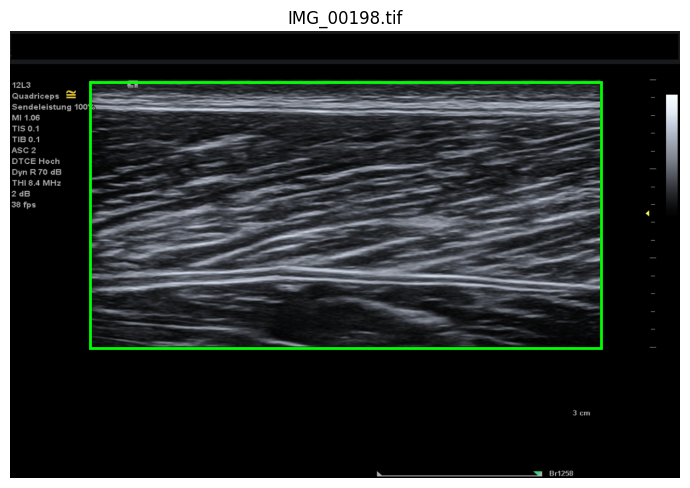

IMG_00198.tif
  raw shape        : (800, 1200, 3)  (tif)
  px_per_cm        : 159.67
  mm_per_px        : 0.0626
  bbox (l,t,r,b)   : (142, 91, 1058, 566)
  bbox size (px)   : 916 x 475
  bbox size (cm)   : 5.74 x 2.97



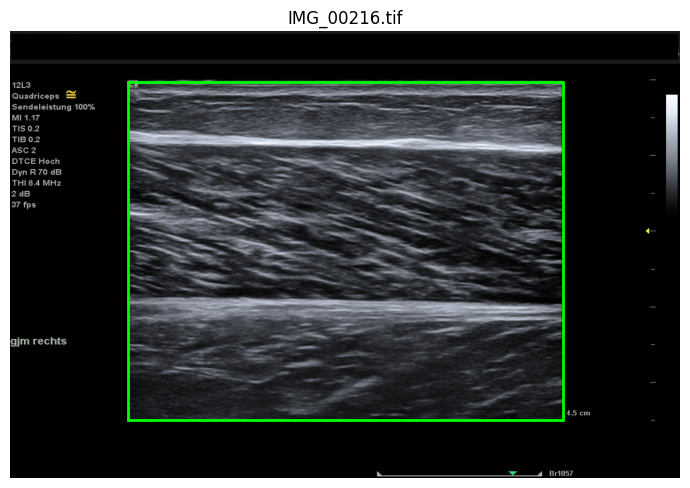

IMG_00216.tif
  raw shape        : (800, 1200, 3)  (tif)
  px_per_cm        : 135.33
  mm_per_px        : 0.0739
  bbox (l,t,r,b)   : (210, 91, 990, 696)
  bbox size (px)   : 780 x 605
  bbox size (cm)   : 5.76 x 4.47



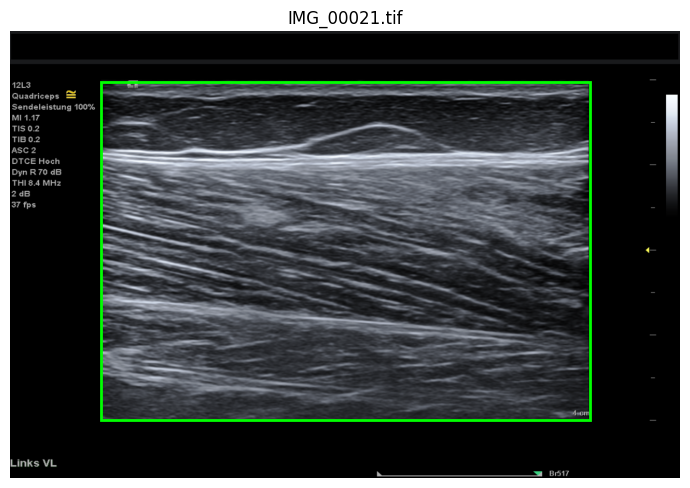

IMG_00021.tif
  raw shape        : (800, 1200, 3)  (tif)
  px_per_cm        : 152.25
  mm_per_px        : 0.0657
  bbox (l,t,r,b)   : (162, 91, 1038, 696)
  bbox size (px)   : 876 x 605
  bbox size (cm)   : 5.75 x 3.97



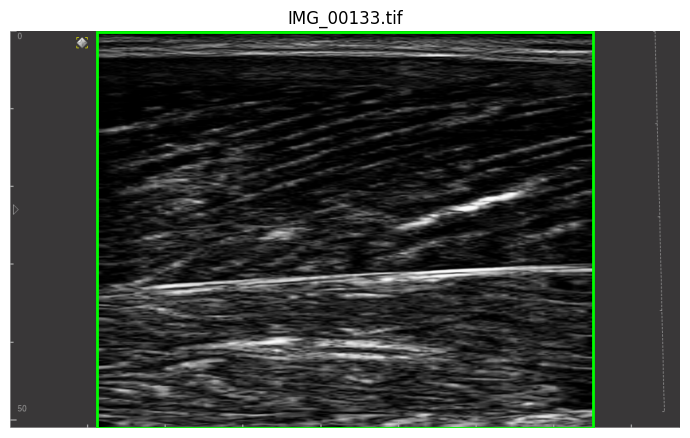

IMG_00133.tif
  raw shape        : (644, 1088, 3)  (tif)
  px_per_cm        : 126.10
  mm_per_px        : 0.0793
  bbox (l,t,r,b)   : (140, 0, 947, 643)
  bbox size (px)   : 807 x 643
  bbox size (cm)   : 6.40 x 5.10



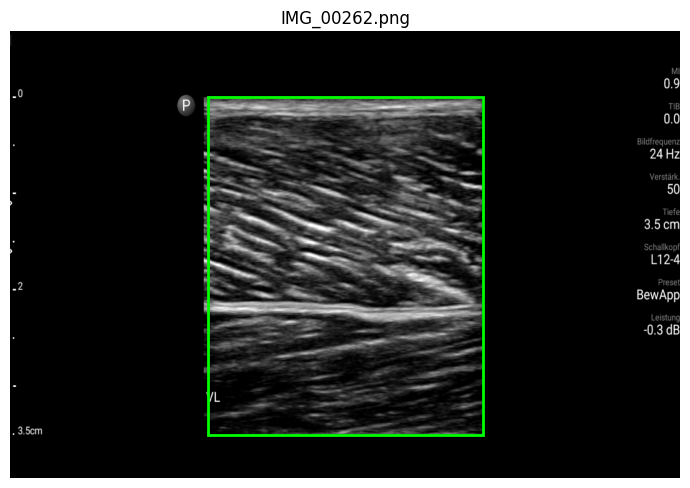

IMG_00262.png
  raw shape        : (800, 1200, 3)  (png)
  px_per_cm        : 172.00
  mm_per_px        : 0.0581
  bbox (l,t,r,b)   : (354, 117, 846, 722)
  bbox size (px)   : 492 x 605
  bbox size (cm)   : 2.86 x 3.52



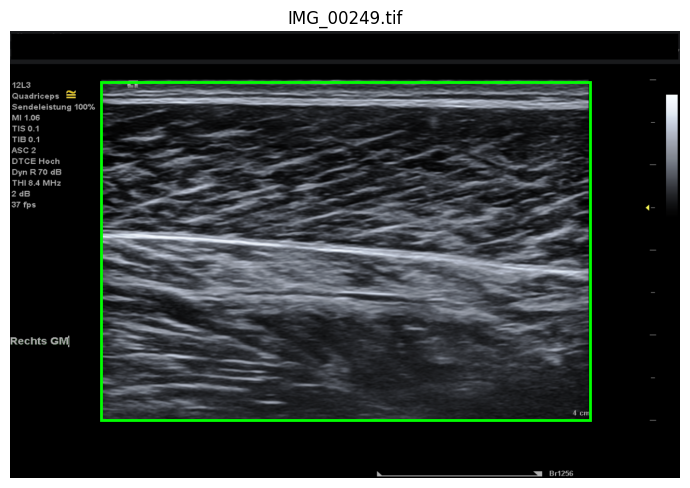

IMG_00249.tif
  raw shape        : (800, 1200, 3)  (tif)
  px_per_cm        : 152.25
  mm_per_px        : 0.0657
  bbox (l,t,r,b)   : (162, 91, 1038, 696)
  bbox size (px)   : 876 x 605
  bbox size (cm)   : 5.75 x 3.97



In [23]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def show_calibration_samples(test_df, image_dir, n=6, seed=0):
    """Plot n random test images with their calibration box and printed stats."""
    random.seed(seed)
    sample_idx = random.sample(range(len(test_df)), min(n, len(test_df)))

    for idx in sample_idx:
        row = test_df.iloc[idx]
        path = os.path.join(image_dir, row.image_id)
        with Image.open(path) as img:
            a = np.asarray(img)

        px_per_cm = row.px_per_cm
        mm_per_px = 10 / px_per_cm if px_per_cm > 0 else float('nan')
        box_w_cm = (row.r - row.l) / px_per_cm if px_per_cm > 0 else float('nan')
        box_h_cm = (row.b - row.t) / px_per_cm if px_per_cm > 0 else float('nan')

        fig, ax = plt.subplots(figsize=(7, 5))
        ax.imshow(a, cmap='gray' if a.ndim == 2 else None)
        rect = patches.Rectangle((row.l, row.t), row.r - row.l, row.b - row.t,
                                  linewidth=2, edgecolor='lime', facecolor='none')
        ax.add_patch(rect)
        ax.set_title(row.image_id)
        ax.axis('off')
        plt.tight_layout()
        plt.show()

        print(f"{row.image_id}")
        print(f"  raw shape        : {a.shape}  ({row.filetype})")
        print(f"  px_per_cm        : {px_per_cm:.2f}")
        print(f"  mm_per_px        : {mm_per_px:.4f}")
        print(f"  bbox (l,t,r,b)   : ({row.l}, {row.t}, {row.r}, {row.b})")
        print(f"  bbox size (px)   : {row.r - row.l} x {row.b - row.t}")
        print(f"  bbox size (cm)   : {box_w_cm:.2f} x {box_h_cm:.2f}")
        print()


show_calibration_samples(test_df, test_idir, n=6)

In [24]:
# ============================================================
# Load apo model from best checkpoint (needed after any
# kernel restart — the model object doesn't persist on disk,
# only the .pt checkpoint file does)
# ============================================================
import torch

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

APO_CKPT_DIR = '/content/drive/MyDrive/UMUD_checkpoints'
APO_CKPT_PATH = os.path.join(APO_CKPT_DIR, 'apo_model_unet_best.pt')

apo_model_unet = UNet(in_ch=3).to(DEVICE)
apo_ckpt = torch.load(APO_CKPT_PATH, map_location=DEVICE)
apo_model_unet.load_state_dict(apo_ckpt['model_state'])
apo_model_unet.eval()

print(f"Loaded APO model from {APO_CKPT_PATH} (epoch {apo_ckpt['epoch']}, best_iou={apo_ckpt['best_iou']:.4f})")

Loaded APO model from /content/drive/MyDrive/UMUD_checkpoints/apo_model_unet_best.pt (epoch 32, best_iou=0.6715)


In [25]:
# ============================================================
# Load fasc model from best checkpoint (needed after any
# kernel restart — mirrors the APO reload cell above)
# ============================================================
fasc_ckpt_paths = setup_checkpoint_paths('fasc_model_unet')
FASC_CKPT_PATH = fasc_ckpt_paths['best']

fasc_model_unet = UNet(in_ch=3).to(DEVICE)
fasc_ckpt = torch.load(FASC_CKPT_PATH, map_location=DEVICE)
fasc_model_unet.load_state_dict(fasc_ckpt['model_state'])
fasc_model_unet.eval()

print(f"Loaded FASC model from {FASC_CKPT_PATH} (epoch {fasc_ckpt['epoch']}, best_iou={fasc_ckpt['best_iou']:.4f})")

Loaded FASC model from /content/drive/MyDrive/UMUD_checkpoints/fasc_model_unet_best.pt (epoch 39, best_iou=0.0072)


### Preprocessing for TEST images (no mask available)

This cell defines preprocessing for inference on the TEST set, mirroring the
T1-T2-T3 chain used in training via `UltrasoundDataset`, but without a mask, since the
test set is unlabeled, and without augmentation. It uses the precomputed
`test_boxes.csv` ROI boxes.

In [26]:
# ============================================================
# Preprocessing for TEST images (no mask available),
# same T1->T2->T3 chain used in training.
# ============================================================
import torch
import numpy as np
from PIL import Image
import pandas as pd
import os

test_boxes_df = pd.read_csv('test_boxes.csv').set_index('image_name')

def preprocess_test_image(fname, test_idir, net_size=NET_SIZE):
    path = os.path.join(test_idir, fname)
    img_pil = Image.open(path).convert('RGB')
    orig_w, orig_h = img_pil.size
    img_512 = img_pil.resize((512, 512), resample=Image.BILINEAR)

    x_min, y_min, w, h = test_boxes_df.loc[fname, ['x_min', 'y_min', 'width', 'height']].astype(int)
    box = (x_min, y_min, x_min + w, y_min + h)
    img_crop = img_512.crop(box)
    img_net = img_crop.resize((net_size, net_size), resample=Image.BILINEAR)

    img_arr = np.array(img_net, dtype=np.float32) / 255.0
    img_t = torch.from_numpy(img_arr).permute(2, 0, 1)

    meta = {'filename': fname, 'orig_size': (orig_w, orig_h), 'box_512': (x_min, y_min, w, h)}
    return img_t, meta

In [27]:
# ============================================================
# Interactive threshold slider for the apo prediction.
# Recomputes only the binary mask (cheap) on slider move —
# the forward pass (expensive) runs once per image, cached.
# ============================================================
import matplotlib.pyplot as plt
from ipywidgets import interact, FloatSlider

def predict_apo_prob(fname, test_idir, apo_model, net_size=NET_SIZE):
    """Forward pass only, returns raw probability map (no thresholding)."""
    img_t, meta = preprocess_test_image(fname, test_idir, net_size)
    apo_model.eval()
    with torch.no_grad():
        logits = apo_model(img_t.unsqueeze(0).to(DEVICE))
        prob = torch.sigmoid(logits)[0, 0].cpu().numpy()
    img_arr = img_t.permute(1, 2, 0).numpy()
    return img_arr, prob, meta


def show_prediction_interactive(fname, test_idir, apo_model):
    img_arr, prob, meta = predict_apo_prob(fname, test_idir, apo_model)

    def _plot(thresh=0.8):
        binary = (prob > thresh).astype(np.uint8)
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        axes[0].imshow(img_arr); axes[0].set_title(f"Input\n{fname}"); axes[0].axis('off')
        im = axes[1].imshow(prob, cmap='inferno', vmin=0, vmax=1)
        axes[1].set_title(f"Probability\nmin={prob.min():.3f} max={prob.max():.3f}"); axes[1].axis('off')
        fig.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)
        axes[2].imshow(binary, cmap='gray')
        axes[2].set_title(f"Binary (thr={thresh:.2f})\nforeground px={binary.sum()}"); axes[2].axis('off')
        plt.tight_layout()
        plt.show()

    interact(_plot, thresh=FloatSlider(min=0.0, max=1.0, step=0.01, value=0.5, description='Threshold'))


# usage: pick one image, get an interactive slider
sample_fname = sorted(os.listdir(test_idir))[0]
show_prediction_interactive(sample_fname, test_idir, apo_model_unet)

interactive(children=(FloatSlider(value=0.5, description='Threshold', max=1.0, step=0.01), Output()), _dom_cla…

### Split binary apo mask into upper/lower aponeurosis + polynomial fit

This is a core post-processing step, we use connected-component labeling to
separate the binary APO mask into its two bands, superficial and deep, keeping the two
largest components if noise produces extra small blobs, then orders them top to bottom
by mean y. `fit_aponeurosis_poly()` fits a 2nd-order polynomial to each band's
per-column mean y — a simple centerline fit, later superseded by the edge-based fit
below.

In [28]:
# ============================================================
# Split binary apo mask into upper (superficial) and
# lower (deep) aponeurosis, fit a 2nd-order polynomial to each
# — same logic as DL_Track_US post-processing (Ritsche et al.).
# ============================================================
import numpy as np
from scipy import ndimage

def split_aponeuroses(apo_mask, min_area=200):
    """Connected-component split, sorted top->bottom by mean y."""
    labeled, n = ndimage.label(apo_mask)
    components = []
    for i in range(1, n + 1):
        ys, xs = np.where(labeled == i)
        if len(xs) < min_area:
            continue
        components.append((ys.mean(), xs, ys))
    if len(components) < 2:
        return None, None
    if len(components) > 2:
        components.sort(key=lambda c: len(c[1]), reverse=True)
        components = components[:2]
    components.sort(key=lambda c: c[0])
    (_, xs_up, ys_up), (_, xs_low, ys_low) = components
    return (xs_up, ys_up), (xs_low, ys_low)


def fit_aponeurosis_poly(xs, ys, deg=2):
    order = np.argsort(xs)
    xs, ys = xs[order], ys[order]
    x_unique = np.unique(xs)
    y_mean = np.array([ys[xs == x].mean() for x in x_unique])
    coeffs = np.polyfit(x_unique, y_mean, deg)
    return np.poly1d(coeffs), x_unique.min(), x_unique.max()

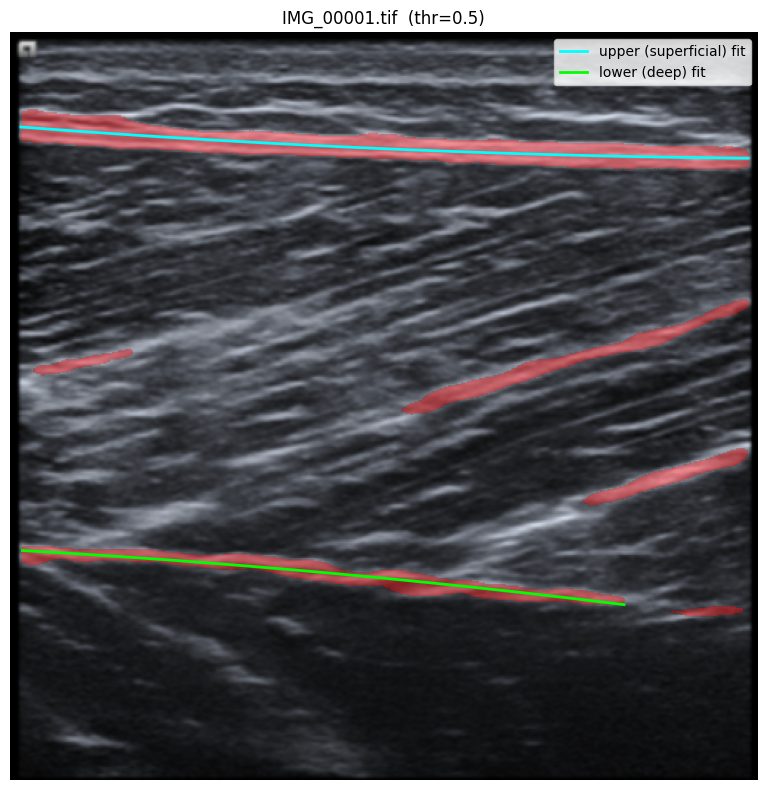

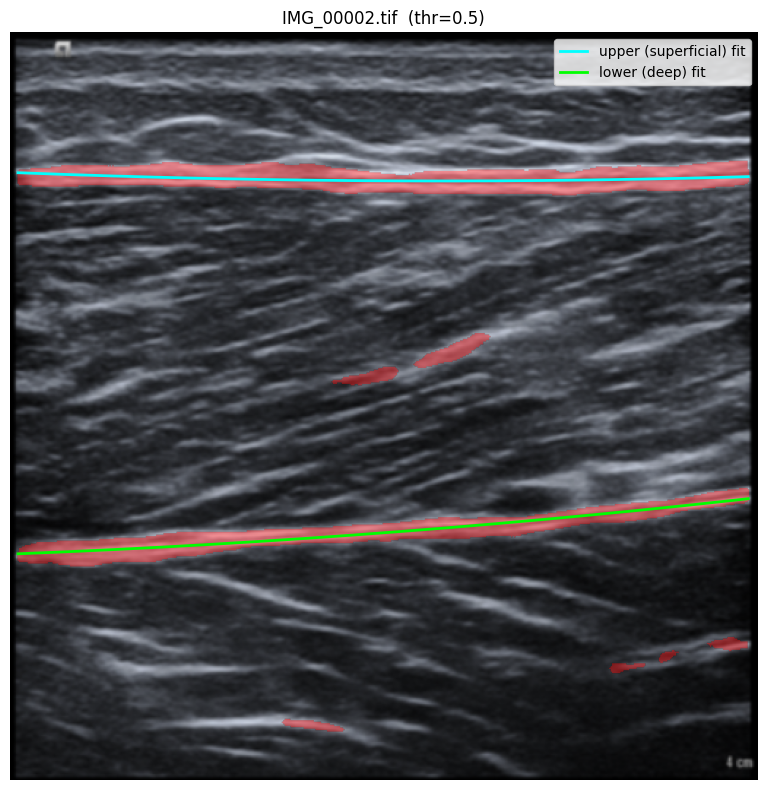

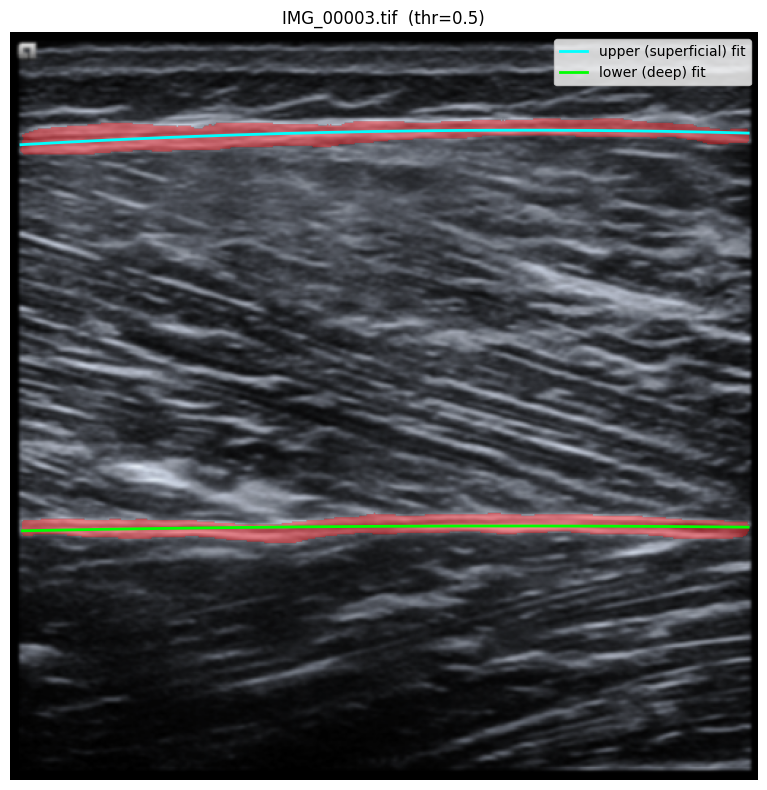

In [29]:
# ============================================================
# Visualize the split + polynomial fit on top of the
# binary mask, for one image, at a chosen threshold.
# ============================================================
import matplotlib.pyplot as plt

def show_aponeurosis_fit(fname, test_idir, apo_model, thresh=0.5):
    img_arr, prob, meta = predict_apo_prob(fname, test_idir, apo_model)
    binary = (prob > thresh).astype(np.uint8)

    apo_pts = split_aponeuroses(binary)
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(img_arr)
    ax.imshow(np.ma.masked_where(binary == 0, binary), cmap='autumn', alpha=0.4)

    if apo_pts[0] is None:
        ax.set_title(f"{fname}\n⚠️ could not split into 2 aponeuroses (thr={thresh})")
    else:
        (xs_up, ys_up), (xs_low, ys_low) = apo_pts
        poly_up, xu_lo, xu_hi = fit_aponeurosis_poly(xs_up, ys_up, deg=2)
        poly_low, xl_lo, xl_hi = fit_aponeurosis_poly(xs_low, ys_low, deg=2)

        xs_plot_up = np.linspace(xu_lo, xu_hi, 200)
        xs_plot_low = np.linspace(xl_lo, xl_hi, 200)
        ax.plot(xs_plot_up, poly_up(xs_plot_up), color='cyan', linewidth=2, label='upper (superficial) fit')
        ax.plot(xs_plot_low, poly_low(xs_plot_low), color='lime', linewidth=2, label='lower (deep) fit')
        ax.legend(loc='upper right')
        ax.set_title(f"{fname}  (thr={thresh})")

    ax.axis('off')
    plt.tight_layout()
    plt.show()


sample_fnames = sorted(os.listdir(test_idir))[:3]
for fname in sample_fnames:
    show_aponeurosis_fit(fname, test_idir, apo_model_unet, thresh=0.5)

The centroid fit above traces the *middle* of each aponeurosis band, but
Muscle Thickness is defined between the two INNER edges (the boundary each
aponeurosis shares with the muscle belly), not their centerlines. The next
cell refits each band along its inner edge instead, which is what MT
actually needs.

In [30]:
# ============================================================
# Fit the INNER edge of each aponeurosis band, not its
# centroid. For the upper (superficial) band, the inner edge
# is its BOTTOM boundary (max y per column, facing the muscle
# belly). For the lower (deep) band, the inner edge is its TOP
# boundary (min y per column). Fit uses the FULL horizontal
# extent of each band, not a restricted window.
#
# Polynomial degree is now chosen adaptively from the band's
# x-extent (width in px): <100 -> deg 0, 100-350 -> deg 1, >200 -> deg 2.
# ============================================================
import numpy as np

def choose_poly_degree(width, low=100, high=350):
    """Pick fit degree from the observed x-extent (in pixels)."""
    if width < low:
        return 0
    elif width < high:
        return 1
    else:
        return 2


def edge_of_aponeurosis(xs, ys, edge='max'):
    """
    edge='max' -> bottom boundary of the band (use for the UPPER/
                  superficial aponeurosis: its inner edge, facing muscle)
    edge='min' -> top boundary of the band (use for the LOWER/deep
                  aponeurosis: its inner edge, facing muscle)
    """
    order = np.argsort(xs)
    xs, ys = xs[order], ys[order]
    x_unique = np.unique(xs)
    if edge == 'max':
        y_edge = np.array([ys[xs == x].max() for x in x_unique])
    else:
        y_edge = np.array([ys[xs == x].min() for x in x_unique])
    return x_unique, y_edge


def fit_aponeurosis_edge_poly(xs, ys, edge, deg=None, low=100, high=350):
    """
    If deg is None, the degree is chosen adaptively from the band's
    x-extent (x_unique.max() - x_unique.min()) using choose_poly_degree.
    Pass an explicit deg to override the adaptive behavior.
    """
    x_unique, y_edge = edge_of_aponeurosis(xs, ys, edge=edge)
    width = x_unique.max() - x_unique.min()
    if deg is None:
        deg = choose_poly_degree(width, low=low, high=high)
    coeffs = np.polyfit(x_unique, y_edge, deg)
    return np.poly1d(coeffs), x_unique.min(), x_unique.max(), deg

### Fit the INNER edge of each aponeurosis band (not centroid)

This cell refines the polynomial fit: instead of fitting each band's centerline, it
fits its inner edge, the boundary facing the muscle belly, which is what fascicle
endpoints and muscle-thickness measurements should reference.

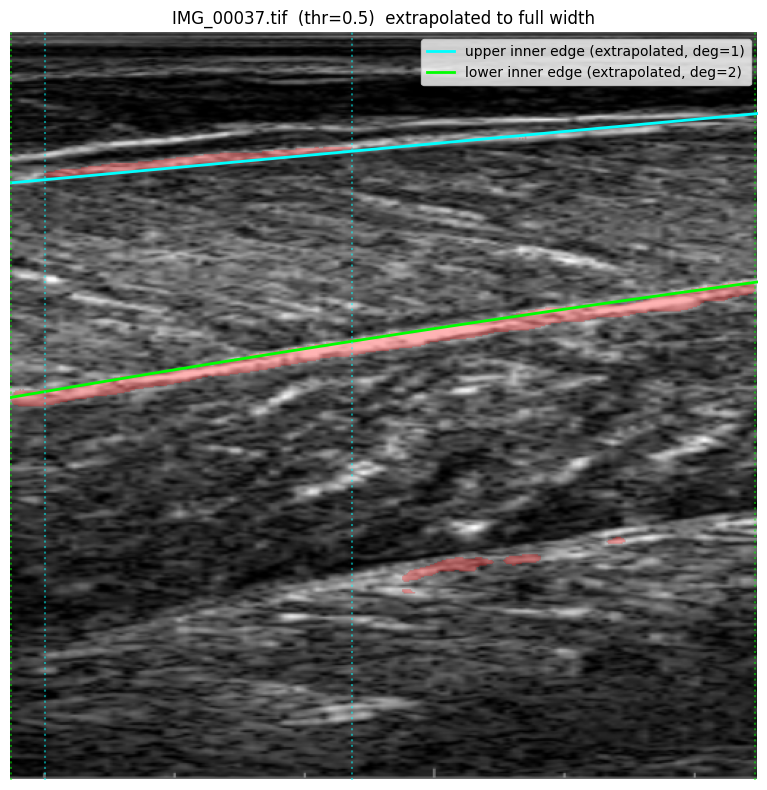

In [31]:
# ============================================================
# Extend the fitted curves to the FULL image width (0 to
# net_size), extrapolating beyond the observed band extent using
# the same polynomial coefficients already fitted.
#
# Polynomial degree per band is chosen adaptively (via
# fit_aponeurosis_edge_poly -> choose_poly_degree): <100px -> deg 0,
# 100-350px -> deg 1, >350px -> deg 2.
# ============================================================
import matplotlib.pyplot as plt

def show_aponeurosis_edge_fit_extended(fname, test_idir, apo_model, thresh=0.5, net_size=NET_SIZE):
    img_arr, prob, meta = predict_apo_prob(fname, test_idir, apo_model)
    binary = (prob > thresh).astype(np.uint8)

    apo_pts = split_aponeuroses(binary)
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(img_arr)
    ax.imshow(np.ma.masked_where(binary == 0, binary), cmap='autumn', alpha=0.3)

    if apo_pts[0] is None:
        ax.set_title(f"{fname}\n⚠️ could not split into 2 aponeuroses (thr={thresh})")
    else:
        (xs_up, ys_up), (xs_low, ys_low) = apo_pts

        # degree chosen adaptively inside fit_aponeurosis_edge_poly
        poly_up, xu_lo, xu_hi, deg_up = fit_aponeurosis_edge_poly(xs_up, ys_up, edge='max')
        poly_low, xl_lo, xl_hi, deg_low = fit_aponeurosis_edge_poly(xs_low, ys_low, edge='min')

        # extrapolate across the FULL image width, not just [x_lo, x_hi]
        xs_full = np.linspace(0, net_size, 300)
        ax.plot(xs_full, poly_up(xs_full), color='cyan', linewidth=2,
                 label=f'upper inner edge (extrapolated, deg={deg_up})')
        ax.plot(xs_full, poly_low(xs_full), color='lime', linewidth=2,
                 label=f'lower inner edge (extrapolated, deg={deg_low})')

        # mark the ORIGINAL observed extent with dashed vertical lines, for reference
        ax.axvline(xu_lo, color='cyan', linestyle=':', alpha=0.5)
        ax.axvline(xu_hi, color='cyan', linestyle=':', alpha=0.5)
        ax.axvline(xl_lo, color='lime', linestyle=':', alpha=0.5)
        ax.axvline(xl_hi, color='lime', linestyle=':', alpha=0.5)

        ax.legend(loc='upper right')
        ax.set_title(f"{fname}  (thr={thresh})  extrapolated to full width")
        ax.set_xlim(0, net_size)
        ax.set_ylim(net_size, 0)

    ax.axis('off')
    plt.tight_layout()
    plt.show()


sample_fnames = sorted(os.listdir(test_idir))[36:37]
for fname in sample_fnames:
    show_aponeurosis_edge_fit_extended(fname, test_idir, apo_model_unet, thresh=0.5)


### MT via mean distance at three x-quantiles (0.1, 0.5, 0.9)

This cell estimates muscle thickness (MT). Ritsche et al. define MT as "the shortest
distance between the superficial and deep aponeuroses" computed "from the central
portion of the image". Here we approximate this by sampling the vertical distance
between the two extrapolated inner-edge curves at three fixed horizontal quantiles of
the image width — 10%, 50% and 90% — and averaging, which is a simple, robust proxy
for "central portion" that also smooths out local curve noise, rather than relying on
a single midpoint sample.

Distances are computed in original image pixel coordinates, via
`point_net_to_original`, which inverts the T1-T3 chain, so they can be directly
divided by this image's `px_per_cm`, from `collect_metadata`, to get MT in mm.
Calibration has to happen in original pixel space, since that's where the scale bar
was measured.

In [32]:
# ============================================================
# MT computed as the MEAN of the distance between the two
# extrapolated inner-edge curves, sampled at x = 0.1, 0.5, 0.9
# (quantiles of image width, in NET-SPACE x), then each point
# pair mapped to ORIGINAL image coordinates before measuring
# distance, then converted px -> mm using this image's px_per_cm.
# ============================================================
import numpy as np
import torch

def point_net_to_original(x_net, y_net, meta, net_size=NET_SIZE):
    x_min, y_min, w, h = meta['box_512']
    orig_w, orig_h = meta['orig_size']
    x_512 = x_min + (x_net / net_size) * w
    y_512 = y_min + (y_net / net_size) * h
    x_orig = (x_512 / 512) * orig_w
    y_orig = (y_512 / 512) * orig_h
    return x_orig, y_orig

def compute_mt_mm_quantiles(fname, test_idir, apo_model, calib_df,
                              thresh=0.5, net_size=NET_SIZE, quantiles=(0.1, 0.5, 0.9)):
    img_arr, prob, meta = predict_apo_prob(fname, test_idir, apo_model, net_size)
    binary = (prob > thresh).astype(np.uint8)

    apo_pts = split_aponeuroses(binary)
    if apo_pts[0] is None:
        return None

    (xs_up, ys_up), (xs_low, ys_low) = apo_pts
    # let the degree be chosen adaptively (<50px -> 0, 50-200px -> 1, >200px -> 2)
    poly_up, _, _, deg_up = fit_aponeurosis_edge_poly(xs_up, ys_up, edge='max')
    poly_low, _, _, deg_low = fit_aponeurosis_edge_poly(xs_low, ys_low, edge='min')

    # sample x at the three quantile fractions of the NET-SPACE width
    xs_query = [q * net_size for q in quantiles]

    dists_px_orig = []
    sample_points = []  # (xo_up, yo_up, xo_low, yo_low) for visualization
    for xn in xs_query:
        yn_up = poly_up(xn)
        yn_low = poly_low(xn)
        xo_up, yo_up = point_net_to_original(xn, yn_up, meta, net_size)
        xo_low, yo_low = point_net_to_original(xn, yn_low, meta, net_size)
        dists_px_orig.append(np.hypot(xo_low - xo_up, yo_low - yo_up))
        sample_points.append((xo_up, yo_up, xo_low, yo_low))

    mt_px = float(np.mean(dists_px_orig))

    row = calib_df.loc[fname] if fname in calib_df.index else None
    mt_mm = None
    if row is not None and row['px_per_cm'] > 0:
        mt_mm = mt_px / row['px_per_cm'] * 10.0  # cm -> mm

    return {
        'filename': fname,
        'mt_px': mt_px,
        'mt_mm': mt_mm,
        'dists_px_at_quantiles': dists_px_orig,
        'sample_points_orig': sample_points,
        'meta': meta,
        'deg_up': deg_up,
        'deg_low': deg_low,
    }

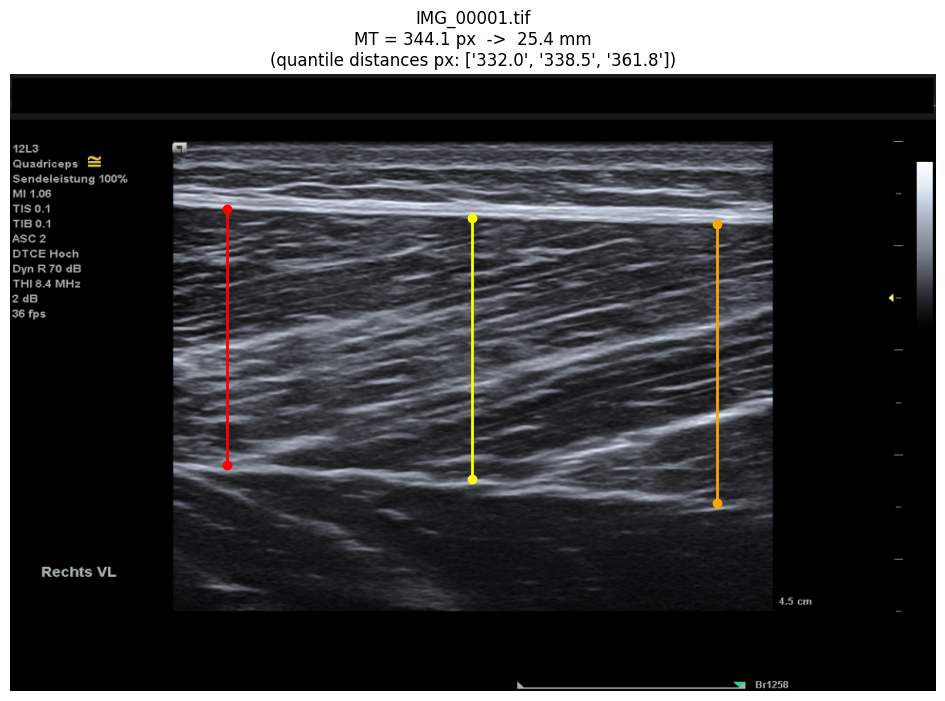

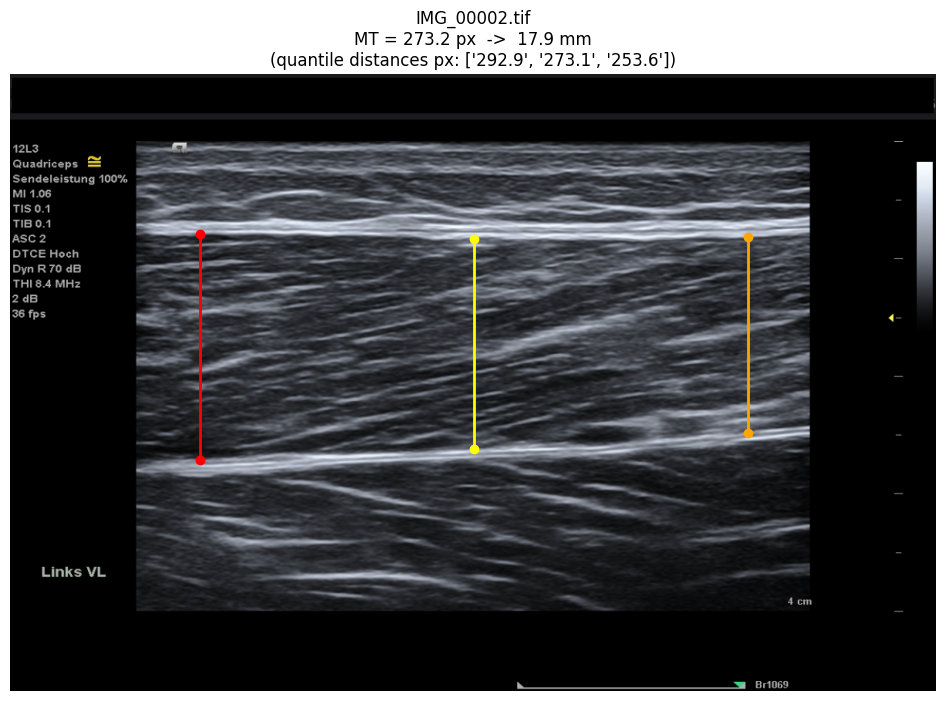

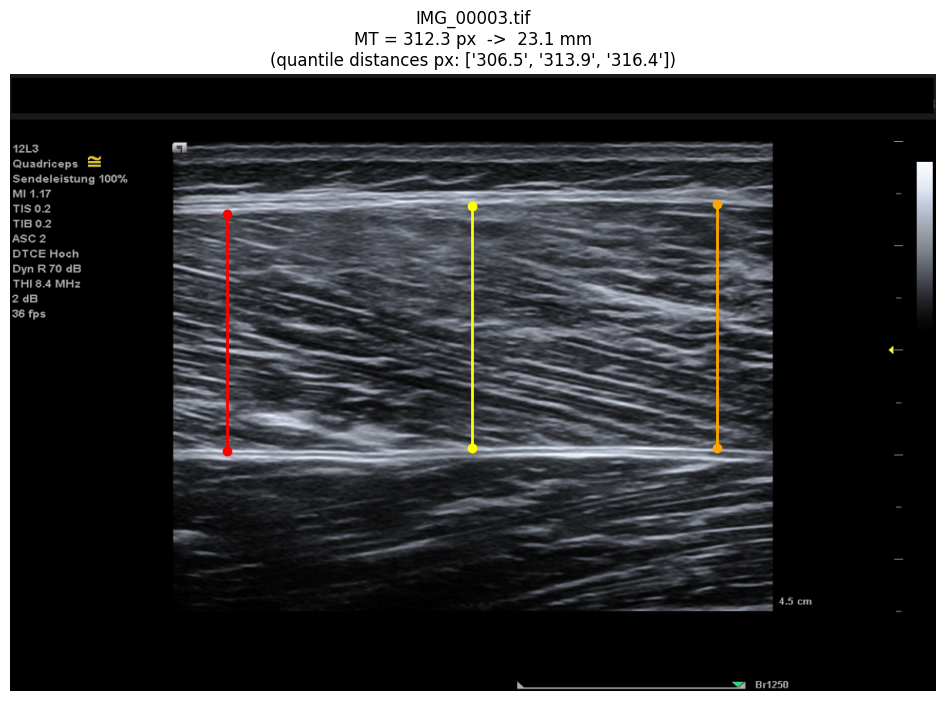

In [33]:
# ============================================================
# Visualize on the ORIGINAL image — the three quantile
# segments (0.1, 0.5, 0.9) mapped back to original coordinates,
# plus the resulting MT in px and mm.
# ============================================================
import matplotlib.pyplot as plt
from PIL import Image
import os

test_calib = test_df.set_index('image_id')

def show_mt_quantiles(fname, test_idir, apo_model, calib_df, thresh=0.5):
    result = compute_mt_mm_quantiles(fname, test_idir, apo_model, calib_df, thresh=thresh)
    if result is None:
        print(f"{fname}: could not compute MT (bad aponeurosis split)")
        return

    orig_img = Image.open(os.path.join(test_idir, fname)).convert('RGB')
    fig, ax = plt.subplots(figsize=(10, 7))
    ax.imshow(orig_img)

    colors = ['red', 'yellow', 'orange']
    for (xo_up, yo_up, xo_low, yo_low), c, d_px in zip(
            result['sample_points_orig'], colors, result['dists_px_at_quantiles']):
        ax.plot([xo_up, xo_low], [yo_up, yo_low], color=c, linewidth=2, marker='o')

    mm_str = f"{result['mt_mm']:.1f} mm" if result['mt_mm'] is not None else "N/A (no calibration)"
    ax.set_title(f"{fname}\nMT = {result['mt_px']:.1f} px  ->  {mm_str}\n"
                 f"(quantile distances px: {[f'{d:.1f}' for d in result['dists_px_at_quantiles']]})")
    ax.axis('off')
    plt.tight_layout()
    plt.show()


sample_fnames = sorted(os.listdir(test_idir))[:3]
for fname in sample_fnames:
    show_mt_quantiles(fname, test_idir, apo_model_unet, test_calib, thresh=0.4)

In [34]:
# ============================================================
# Run MT (quantile-based) over the FULL test set, using
# each image's own px_per_cm from test_calib for conversion.
# Also print every image's per-quantile distances and MT as we go.
#
# Set print_images=True to additionally render the quantile-line
# visualization (same as show_mt_quantiles) for every image, so
# you can manually check them all. Leave False for normal runs —
# rendering every image will make the notebook file very heavy.
# ============================================================
from tqdm.auto import tqdm
import pandas as pd
import numpy as np

print_images = False  # <-- set True to visually check every image in output

results = []
failed = []

test_fnames = sorted(os.listdir(test_idir))

for fname in tqdm(test_fnames, desc="Computing MT (test set)"):
    result = compute_mt_mm_quantiles(fname, test_idir, apo_model_unet, test_calib, thresh=0.4)
    if result is None:
        failed.append((fname, 'apo split failed'))
        print(f"{fname}: FAILED (apo split failed)")
        continue
    if result['mt_mm'] is None:
        failed.append((fname, 'no calibration (px_per_cm <= 0)'))
        print(f"{fname}: FAILED (no calibration)")
        continue

    dists_str = ", ".join(f"{d:.1f}px" for d in result['dists_px_at_quantiles'])
    print(f"{fname}: quantile distances = [{dists_str}]  ->  "
          f"MT = {result['mt_px']:.1f}px = {result['mt_mm']:.2f}mm")

    if print_images:
        show_mt_quantiles(fname, test_idir, apo_model_unet, test_calib, thresh=0.4)

    results.append({
        'image_id': fname,
        'mt_px': result['mt_px'],
        'mt_mm': result['mt_mm'],
        'dists_px_at_quantiles': result['dists_px_at_quantiles'],  # keep per-quantile values in the df too
    })

mt_df = pd.DataFrame(results)
print(f"\nSucceeded: {len(mt_df)}/{len(test_fnames)}   Failed: {len(failed)}")
if failed:
    reasons = pd.Series([r for _, r in failed]).value_counts()
    print("Failure reasons:")
    print(reasons)

Computing MT (test set):   0%|          | 0/309 [00:00<?, ?it/s]

IMG_00001.tif: quantile distances = [332.0px, 338.5px, 361.8px]  ->  MT = 344.1px = 25.43mm
IMG_00002.tif: quantile distances = [292.9px, 273.1px, 253.6px]  ->  MT = 273.2px = 17.94mm
IMG_00003.tif: quantile distances = [306.5px, 313.9px, 316.4px]  ->  MT = 312.3px = 23.07mm
IMG_00004.tif: quantile distances = [339.1px, 356.0px, 389.3px]  ->  MT = 361.5px = 26.71mm
IMG_00005.tif: quantile distances = [275.4px, 286.2px, 294.6px]  ->  MT = 285.4px = 28.12mm
IMG_00006.tif: quantile distances = [341.7px, 347.2px, 347.1px]  ->  MT = 345.3px = 34.02mm
IMG_00007.tif: quantile distances = [392.2px, 380.9px, 387.6px]  ->  MT = 386.9px = 28.59mm
IMG_00008.tif: quantile distances = [384.5px, 395.0px, 418.8px]  ->  MT = 399.4px = 29.51mm
IMG_00009.tif: quantile distances = [267.9px, 286.0px, 312.5px]  ->  MT = 288.8px = 18.12mm
IMG_00010.tif: quantile distances = [293.8px, 292.9px, 296.6px]  ->  MT = 294.4px = 19.34mm
IMG_00011.tif: quantile distances = [269.3px, 267.2px, 289.9px]  ->  MT = 275.5p

In [35]:
# ============================================================
# Save MT results (test set) to Google Drive, alongside
# the existing checkpoints/history in UMUD_checkpoints. Also
# prints every image's per-quantile distances as it saves.
# ============================================================
import os
from datetime import datetime

RESULTS_DIR = '/content/drive/MyDrive/UMUD_checkpoints/results'
os.makedirs(RESULTS_DIR, exist_ok=True)

timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')
mt_results_path = os.path.join(RESULTS_DIR, f'mt_results_{timestamp}.csv')
mt_results_latest_path = os.path.join(RESULTS_DIR, 'mt_results_latest.csv')  # stable name, always overwritten

# expand dists_px_at_quantiles into separate columns before saving,
# since a list-in-a-cell doesn't round-trip cleanly through CSV
mt_df_export = mt_df.copy()
if 'dists_px_at_quantiles' in mt_df_export.columns:
    q_cols = pd.DataFrame(
        mt_df_export['dists_px_at_quantiles'].tolist(),
        columns=['dist_px_q10', 'dist_px_q50', 'dist_px_q90'],
        index=mt_df_export.index,
    )
    mt_df_export = pd.concat([mt_df_export.drop(columns=['dists_px_at_quantiles']), q_cols], axis=1)

mt_df_export.to_csv(mt_results_path, index=False)
mt_df_export.to_csv(mt_results_latest_path, index=False)  # convenience copy, always the most recent run

print(f"✅ Saved {len(mt_df_export)} results to Drive:")
print(f"   {mt_results_path}")
print(f"   {mt_results_latest_path}  (latest, overwritten each run)")

# also save the failure list, so a run's failures aren't lost
if failed:
    failed_df = pd.DataFrame(failed, columns=['image_id', 'reason'])
    failed_path = os.path.join(RESULTS_DIR, f'mt_failed_{timestamp}.csv')
    failed_df.to_csv(failed_path, index=False)
    print(f"✅ Saved {len(failed_df)} failures to: {failed_path}")

print(f"\nFull per-image printout:")
for _, row in mt_df_export.iterrows():
    print(f"{row['image_id']}: MT = {row['mt_px']:.1f}px = {row['mt_mm']:.2f}mm  "
          f"(q10={row['dist_px_q10']:.1f}, q50={row['dist_px_q50']:.1f}, q90={row['dist_px_q90']:.1f})")

✅ Saved 309 results to Drive:
   /content/drive/MyDrive/UMUD_checkpoints/results/mt_results_20260718_091439.csv
   /content/drive/MyDrive/UMUD_checkpoints/results/mt_results_latest.csv  (latest, overwritten each run)

Full per-image printout:
IMG_00001.tif: MT = 344.1px = 25.43mm  (q10=332.0, q50=338.5, q90=361.8)
IMG_00002.tif: MT = 273.2px = 17.94mm  (q10=292.9, q50=273.1, q90=253.6)
IMG_00003.tif: MT = 312.3px = 23.07mm  (q10=306.5, q50=313.9, q90=316.4)
IMG_00004.tif: MT = 361.5px = 26.71mm  (q10=339.1, q50=356.0, q90=389.3)
IMG_00005.tif: MT = 285.4px = 28.12mm  (q10=275.4, q50=286.2, q90=294.6)
IMG_00006.tif: MT = 345.3px = 34.02mm  (q10=341.7, q50=347.2, q90=347.1)
IMG_00007.tif: MT = 386.9px = 28.59mm  (q10=392.2, q50=380.9, q90=387.6)
IMG_00008.tif: MT = 399.4px = 29.51mm  (q10=384.5, q50=395.0, q90=418.8)
IMG_00009.tif: MT = 288.8px = 18.12mm  (q10=267.9, q50=286.0, q90=312.5)
IMG_00010.tif: MT = 294.4px = 19.34mm  (q10=293.8, q50=292.9, q90=296.6)
IMG_00011.tif: MT = 275.5px

### Sanity check: MT vs. stated physiological range

Ritsche et al. report muscle thickness values roughly in the 10–50mm range
for the muscles in this dataset. This cell checks what fraction of our
predicted MT values fall inside that range and plots the distribution, as a
quick way to catch systematic calibration or fitting errors before trusting
the full test-set results.


MT (mm) distribution over 309 images:
  min=12.6  p5=14.4  p50=21.3  p95=28.8  max=40.3

Within stated 10-50mm range: 309/309 (100.0%)
Outliers (<10mm or >50mm): 0


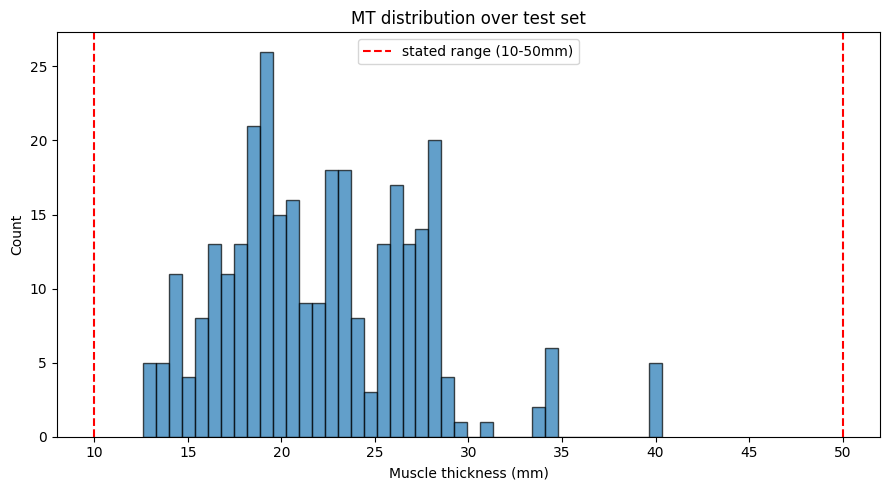

,image_id,mt_px,mt_mm,dists_px_at_quantiles
0,IMG_00001.tif,344.099473,25.426069,"[332.00773495419, 338.4849602343675, 361.80572..."
1,IMG_00002.tif,273.185156,17.943196,"[292.90536117663976, 273.0573838479654, 253.59..."
2,IMG_00003.tif,312.258623,23.073297,"[306.4865630337615, 313.9153065682308, 316.374..."
3,IMG_00004.tif,361.467260,26.709403,"[339.0987597813253, 356.0460601975485, 389.256..."
4,IMG_00005.tif,285.393715,28.117607,"[275.4466540819126, 286.1577241194634, 294.576..."
5,IMG_00006.tif,345.343133,34.023954,"[341.74102415651134, 347.2098194612191, 347.07..."
6,IMG_00007.tif,386.892397,28.588108,"[392.16374185841266, 380.90120799717226, 387.6..."
7,IMG_00008.tif,399.414726,29.513403,"[384.5109534729236, 394.9565455458741, 418.776..."
8,IMG_00009.tif,288.804872,18.115001,"[267.9330325834022, 285.9503293766254, 312.531..."
9,IMG_00010.tif,294.435157,19.338927,"[293.8319652527402, 292.88028744182856, 296.59..."


In [36]:
# ============================================================
# Distribution check against the stated physiological
# range for the test set (10-50mm), plus a quick histogram.
# ============================================================
import matplotlib.pyplot as plt

print(f"\nMT (mm) distribution over {len(mt_df)} images:")
print(f"  min={mt_df.mt_mm.min():.1f}  p5={mt_df.mt_mm.quantile(0.05):.1f}  "
      f"p50={mt_df.mt_mm.quantile(0.5):.1f}  p95={mt_df.mt_mm.quantile(0.95):.1f}  max={mt_df.mt_mm.max():.1f}")

in_range = mt_df.mt_mm.between(10, 50)
print(f"\nWithin stated 10-50mm range: {in_range.sum()}/{len(mt_df)} ({in_range.mean():.1%})")
print(f"Outliers (<10mm or >50mm): {(~in_range).sum()}")

if (~in_range).sum() > 0:
    print("\nExample outliers:")
    print(mt_df[~in_range].sort_values('mt_mm').head(10))
    print(mt_df[~in_range].sort_values('mt_mm').tail(10))

fig, ax = plt.subplots(figsize=(9, 5))
ax.hist(mt_df.mt_mm, bins=40, edgecolor='black', alpha=0.7)
ax.axvline(10, color='red', linestyle='--', label='stated range (10-50mm)')
ax.axvline(50, color='red', linestyle='--')
ax.set_xlabel('Muscle thickness (mm)')
ax.set_ylabel('Count')
ax.set_title('MT distribution over test set')
ax.legend()
plt.tight_layout()
plt.show()

mt_df.head(10)

### Fascicle analysis — muscle-band filtering and constrained FL/PA selection

The earlier fascicle-analysis pass computed FL and PA from whichever fascicle
fragments happened to survive the binary threshold, ranked simply by fragment
length (FL) or proximity to the deep aponeurosis (PA). In practice this let in
fragments that were mostly noise sitting outside the true muscle belly, or
fascicle-line extrapolations that shot off at implausible angles once extended
far past their own visible pixels.

This section replaces that logic with additional constraints, applied in order:

1. **Muscle-band filter.** A fascicle fragment is only considered a real
   fascicle if the majority of its own pixels lie between the fitted
   superficial and deep aponeurosis curves (`filter_fascicles_in_muscle`).
   Fragments mostly straddling outside the muscle belly, artifacts sitting in
   subcutaneous fat or below the deep aponeurosis, are dropped before FL or PA
   ever look at them.

2. **FL selection is anchored to a single dominant fragment.** We take the
   single longest surviving fragment, fit its line, and extrapolate it to
   both aponeuroses to measure fascicle length. We then greedily add up to
   two more fragments (3 total), but only if each one's slope has the *same
   sign* as the dominant fragment's — a sign flip almost always indicates a
   spurious or crossing fragment rather than a genuine parallel fascicle, so
   we stop at the first mismatch rather than skipping past it. FL fragments
   that extrapolate to an implausible length (`fl_mm > 200`) are dropped
   outright. The final FL is a simple (equal-weight) mean across the
   surviving fragments.

3. **PA selection reuses the FL dominant fragment as a reference, but never
   measures its own angle.** Among the remaining same-sign, in-band
   fragments (excluding the dominant one itself), we compute the pennation
   angle each makes with the deep aponeurosis, keep only those within a
   physiologically plausible range (5°–45°), and take the fragments closest
   to the aponeurosis contact point, up to 10. The aponeurosis itself is
   never extrapolated outside its own observed extent for either the
   contact-point search or the local tangent used to measure the angle — the
   only thing allowed to extend beyond its own visible pixels is the
   fascicle's straight-line fit.

This yields two independent but related summaries per image: a mean FL from
up to 3 fragments, and a mean PA from up to 10 fragments, both filtered by
the same underlying muscle-band and slope-sign logic.

In [37]:
# ================================================================
# SECTION: FASCICLE ANALYSIS — FL & PA (rewritten, self-contained)
# ================================================================
#
# Rules implemented in this section:
#
# 1) MUSCLE-BAND FILTER: a fascicle fragment is only kept if the
#    MAJORITY of its length lies inside the band between the two
#    fitted aponeurosis curves. Fragments that are mostly outside
#    the band (mostly above the superficial apo or mostly below
#    the deep apo) are discarded entirely, before FL or PA even
#    look at them.
#
# 2) FL (fascicle length): among the surviving in-band fragments,
#    take the single LONGEST one, fit its line, extrapolate to
#    both aponeuroses, measure FL. Then look at the next-longest
#    fragment: keep it ONLY if its line has the SAME SIGN of slope
#    as the longest one. Repeat once more for a third candidate,
#    same rule. Stop at 3 total, or as soon as a candidate fails
#    the sign test (we do not skip over it and keep looking).
#
# 3) PA (pennation angle): among the surviving in-band fragments
#    that ALSO satisfy the same sign-of-slope constraint used for
#    FL (i.e. same sign as the longest/dominant fascicle), rank by
#    closeness to the deep aponeurosis and take the 3 closest.
#    This is an independent selection from FL's — it just reuses
#    the same sign constraint.
# ================================================================

import numpy as np
import torch
from scipy import ndimage
from scipy.optimize import minimize_scalar
from PIL import Image
import os
import matplotlib.pyplot as plt

# ----------------------------------------------------------------
# 0. Basic prediction helpers (APO + FASC forward passes)
# ----------------------------------------------------------------
def predict_apo_prob(fname, test_idir, apo_model, net_size=NET_SIZE):
    img_t, meta = preprocess_test_image(fname, test_idir, net_size)
    apo_model.eval()
    with torch.no_grad():
        logits = apo_model(img_t.unsqueeze(0).to(DEVICE))
        prob = torch.sigmoid(logits)[0, 0].cpu().numpy()
    img_arr = img_t.permute(1, 2, 0).numpy()
    return img_arr, prob, meta


def predict_fasc_prob(fname, test_idir, fasc_model, net_size=NET_SIZE):
    img_t, meta = preprocess_test_image(fname, test_idir, net_size)
    fasc_model.eval()
    with torch.no_grad():
        logits = fasc_model(img_t.unsqueeze(0).to(DEVICE))
        prob = torch.sigmoid(logits)[0, 0].cpu().numpy()
    return prob, meta


# ----------------------------------------------------------------
# 1. Aponeurosis split + inner-edge polynomial fit
# ----------------------------------------------------------------
def split_aponeuroses(apo_mask, min_area=200):
    """Connected-component split into upper/lower band, sorted top->bottom."""
    labeled, n = ndimage.label(apo_mask)
    components = []
    for i in range(1, n + 1):
        ys, xs = np.where(labeled == i)
        if len(xs) < min_area:
            continue
        components.append((ys.mean(), xs, ys))
    if len(components) < 2:
        return None, None
    if len(components) > 2:
        components.sort(key=lambda c: len(c[1]), reverse=True)
        components = components[:2]
    components.sort(key=lambda c: c[0])
    (_, xs_up, ys_up), (_, xs_low, ys_low) = components
    return (xs_up, ys_up), (xs_low, ys_low)


def fit_aponeurosis_edge_poly(xs, ys, edge, deg=2):
    """edge='max' -> bottom boundary (inner edge of UPPER/superficial apo)
       edge='min' -> top boundary (inner edge of LOWER/deep apo)"""
    order = np.argsort(xs)
    xs, ys = xs[order], ys[order]
    x_unique = np.unique(xs)
    y_edge = (np.array([ys[xs == x].max() for x in x_unique]) if edge == 'max'
              else np.array([ys[xs == x].min() for x in x_unique]))
    coeffs = np.polyfit(x_unique, y_edge, deg)
    return np.poly1d(coeffs), x_unique.min(), x_unique.max()


# ----------------------------------------------------------------
# 2. Fascicle fragment extraction (connected components + line fit)
# ----------------------------------------------------------------
def extract_fascicle_segments(fasc_mask, min_area=15):
    labeled, n = ndimage.label(fasc_mask, structure=np.ones((3, 3)))
    fascicles = []
    for i in range(1, n + 1):
        ys, xs = np.where(labeled == i)
        if len(xs) < min_area:
            continue
        A = np.vstack([xs, np.ones_like(xs)]).T
        slope, intercept = np.linalg.lstsq(A, ys, rcond=None)[0]
        fascicles.append({'xs': xs, 'ys': ys, 'slope': slope, 'intercept': intercept})
    return fascicles


# ----------------------------------------------------------------
# 3. Muscle-band filter — majority-of-length-inside rule
# ----------------------------------------------------------------
def fraction_inside_band(f, poly_up, poly_low):
    """Fraction of a fragment's OWN pixels that fall between the two
    aponeurosis curves (poly_up(x) <= y <= poly_low(x))."""
    y_up_bound = poly_up(f['xs'])
    y_low_bound = poly_low(f['xs'])
    inside = (f['ys'] >= y_up_bound) & (f['ys'] <= y_low_bound)
    return inside.mean()


def filter_fascicles_in_muscle(fascicles, poly_up, poly_low, min_inside_frac=0.5):
    """Keep only fragments where the MAJORITY of their length lies
    inside the band between the two aponeuroses."""
    kept = []
    for f in fascicles:
        frac = fraction_inside_band(f, poly_up, poly_low)
        f['frac_inside'] = frac
        if frac > min_inside_frac:
            kept.append(f)
    return kept


# ----------------------------------------------------------------
# 4. Geometry helpers
# ----------------------------------------------------------------
def fragment_length(f):
    order = np.argsort(f['xs'])
    xs_sorted, ys_sorted = f['xs'][order], f['ys'][order]
    x0, y0 = xs_sorted[0], ys_sorted[0]
    x1, y1 = xs_sorted[-1], ys_sorted[-1]
    return np.hypot(x1 - x0, y1 - y0)


def point_net_to_original(x_net, y_net, meta, net_size=NET_SIZE):
    x_min, y_min, w, h = meta['box_512']
    orig_w, orig_h = meta['orig_size']
    x_512 = x_min + (x_net / net_size) * w
    y_512 = y_min + (y_net / net_size) * h
    x_orig = (x_512 / 512) * orig_w
    y_orig = (y_512 / 512) * orig_h
    return x_orig, y_orig


def closest_approach_extrapolated(slope, intercept, poly, net_size=NET_SIZE, search_margin=2.0):
    """Find x where the (extrapolated) fascicle line and an aponeurosis
    curve are closest — used for FL, where the line must be allowed to
    extend beyond the observed fragment/frame to reach the aponeurosis."""
    def abs_diff(x):
        return abs((slope * x + intercept) - poly(x))
    x_lo = -search_margin * net_size
    x_hi = (1 + search_margin) * net_size
    res = minimize_scalar(abs_diff, bounds=(x_lo, x_hi), method='bounded')
    x_best = res.x
    y_line = slope * x_best + intercept
    return x_best, y_line, abs(y_line - poly(x_best))


def closest_approach_bounded(slope, intercept, poly, x_lo, x_hi):
    """Same as above but constrained to the aponeurosis's OWN observed
    x-range — no extrapolation. Used for PA."""
    def abs_diff(x):
        return abs((slope * x + intercept) - poly(x))
    res = minimize_scalar(abs_diff, bounds=(x_lo, x_hi), method='bounded')
    x_best = res.x
    y_line = slope * x_best + intercept
    return x_best, y_line, abs(y_line - poly(x_best))




In [51]:
# ================================================================
# FL (fascicle length) — reverted to top 3, EQUAL weights
# ================================================================
#
# - longest fragment first, then same-sign only, stop at first
#   sign mismatch, max 3 total.
# - NO extrapolation-based weighting anymore. Each surviving
#   fragment counts equally (weight 1) in the mean.
# - fragments with fl_mm > 200 are EXCLUDED entirely (not just
#   zero-weighted), since equal weighting has no room for "soft"
#   downweighting — implausible fragments are dropped outright.
# ================================================================

def select_fascicles_for_fl(fascicles, top_k=3):
    if not fascicles:
        return [], None

    ranked = sorted(fascicles, key=fragment_length, reverse=True)
    chosen = [ranked[0]]
    dominant_sign = np.sign(ranked[0]['slope'])

    for f in ranked[1:]:
        if len(chosen) >= top_k:
            break
        if np.sign(f['slope']) == dominant_sign:
            chosen.append(f)
        else:
            break

    return chosen, dominant_sign


def compute_fl_for_selected(chosen, poly_up, poly_low, meta, px_per_cm,
                             net_size=NET_SIZE, max_fl_mm=200.0):
    results = []
    for f in chosen:
        x_up, y_up_line, gap_up = closest_approach_extrapolated(f['slope'], f['intercept'], poly_up, net_size)
        x_low, y_low_line, gap_low = closest_approach_extrapolated(f['slope'], f['intercept'], poly_low, net_size)
        xo_up, yo_up = point_net_to_original(x_up, y_up_line, meta, net_size)
        xo_low, yo_low = point_net_to_original(x_low, y_low_line, meta, net_size)
        fl_px = np.hypot(xo_low - xo_up, yo_low - yo_up)
        fl_mm = fl_px / px_per_cm * 10.0 if px_per_cm else None

        if fl_mm is not None and fl_mm > max_fl_mm:
            continue  # drop implausible fragment entirely

        results.append({
            'fl_px': fl_px, 'fl_mm': fl_mm,
            'pt_up_orig': (xo_up, yo_up), 'pt_low_orig': (xo_low, yo_low),
            'gap_up_px': gap_up, 'gap_low_px': gap_low,
            'x_up_net': x_up, 'x_low_net': x_low,
            'slope': f['slope'], 'frag_len': fragment_length(f),
        })
    return results


def mean_fl(fl_results):
    """Simple (equal-weight) mean FL in mm (falls back to px if no calibration)."""
    if not fl_results:
        return {'fl_mm_mean': None, 'fl_px_mean': None, 'n': 0}

    fl_px_mean = float(np.mean([r['fl_px'] for r in fl_results]))
    fl_mm_vals = [r['fl_mm'] for r in fl_results]
    fl_mm_mean = float(np.mean(fl_mm_vals)) if all(v is not None for v in fl_mm_vals) else None

    return {'fl_mm_mean': fl_mm_mean, 'fl_px_mean': fl_px_mean, 'n': len(fl_results)}

In [52]:
# ================================================================
# PA (pennation angle) — simplified, no weighting
# ================================================================

def compute_pa_single(f, poly_low, xl_lo, xl_hi, meta, net_size=NET_SIZE,
                       margin_px=30, window_px=25):
    """Compute contact point + PA angle for a single fragment against
    the deep aponeurosis. The contact-point search and the local
    tangent are both bounded to poly_low's own observed x-range
    [xl_lo, xl_hi] — the aponeurosis is never evaluated outside that
    range. Returns None if the fragment's x-range doesn't overlap the
    deep apo's observed range at all."""
    x_frag_lo, x_frag_hi = f['xs'].min(), f['xs'].max()
    x_lo = max(xl_lo, x_frag_lo - margin_px)
    x_hi = min(xl_hi, x_frag_hi + margin_px)
    if x_lo >= x_hi:
        return None

    x_low, y_low, gap = closest_approach_bounded(f['slope'], f['intercept'], poly_low, x_lo, x_hi)

    idx_far = np.argmax(np.abs(f['xs'] - x_low))
    x_up = f['xs'][idx_far]
    y_up = f['slope'] * x_up + f['intercept']

    xo_low, yo_low = point_net_to_original(x_low, y_low, meta, net_size)
    xo_up, yo_up = point_net_to_original(x_up, y_up, meta, net_size)

    x_a = np.clip(x_low - window_px, xl_lo, xl_hi)
    x_b = np.clip(x_low + window_px, xl_lo, xl_hi)
    xo_a, yo_a = point_net_to_original(x_a, poly_low(x_a), meta, net_size)
    xo_b, yo_b = point_net_to_original(x_b, poly_low(x_b), meta, net_size)

    apo_angle = np.degrees(np.arctan2(yo_b - yo_a, xo_b - xo_a))
    fasc_angle = np.degrees(np.arctan2(yo_up - yo_low, xo_up - xo_low))
    pa_deg = abs(fasc_angle - apo_angle)
    if pa_deg > 90:
        pa_deg = 180 - pa_deg

    return {
        'pa_deg': pa_deg, 'gap_low_px': gap,
        'pt_low_orig': (xo_low, yo_low), 'pt_up_orig': (xo_up, yo_up),
        'apo_tangent_orig': ((xo_a, yo_a), (xo_b, yo_b)),
        'slope': f['slope'],
    }


def select_and_compute_pa(fascicles_in_band, dominant_fragment, poly_low, xl_lo, xl_hi,
                           dominant_sign, meta, net_size=NET_SIZE,
                           angle_lo=5.0, angle_hi=45.0, top_k=10):
    dominant_id = id(dominant_fragment)
    candidates = [
        f for f in fascicles_in_band
        if id(f) != dominant_id and np.sign(f['slope']) == dominant_sign
    ]

    scored = []
    for f in candidates:
        pa = compute_pa_single(f, poly_low, xl_lo, xl_hi, meta, net_size)
        if pa is None:
            continue
        if angle_lo <= pa['pa_deg'] <= angle_hi:
            scored.append(pa)

    ranked = sorted(scored, key=lambda r: r['gap_low_px'])
    return ranked[:top_k]


def mean_pa(pa_results):
    """Simple (equal-weight) mean PA in degrees."""
    if not pa_results:
        return {'pa_deg_mean': None, 'n': 0}
    pa_deg_mean = float(np.mean([r['pa_deg'] for r in pa_results]))
    return {'pa_deg_mean': pa_deg_mean, 'n': len(pa_results)}

In [41]:
def analyze_fascicles(fname, test_idir, apo_model, fasc_model, calib_df,
                       thresh_apo=0.5, thresh_fasc=0.1, net_size=NET_SIZE,
                       min_inside_frac=0.5, fl_top_k=3,
                       pa_angle_lo=5.0, pa_angle_hi=45.0, pa_top_k=10,
                       max_fl_mm=200.0):
    img_arr, prob_apo, meta = predict_apo_prob(fname, test_idir, apo_model, net_size)
    apo_bin = (prob_apo > thresh_apo).astype(np.uint8)
    apo_pts = split_aponeuroses(apo_bin)
    if apo_pts[0] is None:
        return None

    (xs_up, ys_up), (xs_low, ys_low) = apo_pts
    poly_up, _, _ = fit_aponeurosis_edge_poly(xs_up, ys_up, edge='max', deg=2)
    poly_low, xl_lo, xl_hi = fit_aponeurosis_edge_poly(xs_low, ys_low, edge='min', deg=2)

    prob_fasc, _ = predict_fasc_prob(fname, test_idir, fasc_model, net_size)
    fasc_bin = (prob_fasc > thresh_fasc).astype(np.uint8)
    fascicles_raw = extract_fascicle_segments(fasc_bin)
    fascicles_in_band = filter_fascicles_in_muscle(fascicles_raw, poly_up, poly_low, min_inside_frac)

    empty_result = {
        'filename': fname, 'img_arr': img_arr, 'meta': meta,
        'apo_bin': apo_bin, 'fasc_bin': fasc_bin,
        'poly_up': poly_up, 'poly_low': poly_low,
        'fascicles_raw': fascicles_raw, 'fascicles_in_band': [],
        'fl_results': [], 'pa_results': [], 'dominant_sign': None,
        'fl_summary': {'fl_mm_mean': None, 'fl_px_mean': None, 'n': 0},
        'pa_summary': {'pa_deg_mean': None, 'n': 0},
    }
    if not fascicles_in_band:
        return empty_result

    fl_chosen, dominant_sign = select_fascicles_for_fl(fascicles_in_band, top_k=fl_top_k)
    if not fl_chosen:
        return empty_result
    dominant_fragment = fl_chosen[0]

    row = calib_df.loc[fname] if fname in calib_df.index else None
    px_per_cm = row['px_per_cm'] if (row is not None and row['px_per_cm'] > 0) else None
    fl_results = compute_fl_for_selected(fl_chosen, poly_up, poly_low, meta, px_per_cm, net_size, max_fl_mm)
    fl_summary = mean_fl(fl_results)

    pa_results = select_and_compute_pa(
        fascicles_in_band, dominant_fragment, poly_low, xl_lo, xl_hi, dominant_sign,
        meta, net_size, angle_lo=pa_angle_lo, angle_hi=pa_angle_hi, top_k=pa_top_k
    )
    pa_summary = mean_pa(pa_results)

    return {
        'filename': fname, 'img_arr': img_arr, 'meta': meta,
        'apo_bin': apo_bin, 'fasc_bin': fasc_bin,
        'poly_up': poly_up, 'poly_low': poly_low,
        'fascicles_raw': fascicles_raw, 'fascicles_in_band': fascicles_in_band,
        'fl_results': fl_results, 'pa_results': pa_results,
        'dominant_sign': dominant_sign,
        'fl_summary': fl_summary, 'pa_summary': pa_summary,
    }

### Full pipeline walkthrough on a single test image

This cell chains every stage of inference — aponeurosis segmentation, curve
fitting, fascicle segmentation, band filtering, and FL/PA selection — on one
test image, plotting the intermediate result after each stage. It's the
main visual QA tool for spotting where the pipeline breaks down on a given
image, rather than trusting only the aggregate metrics computed over the
full test set.

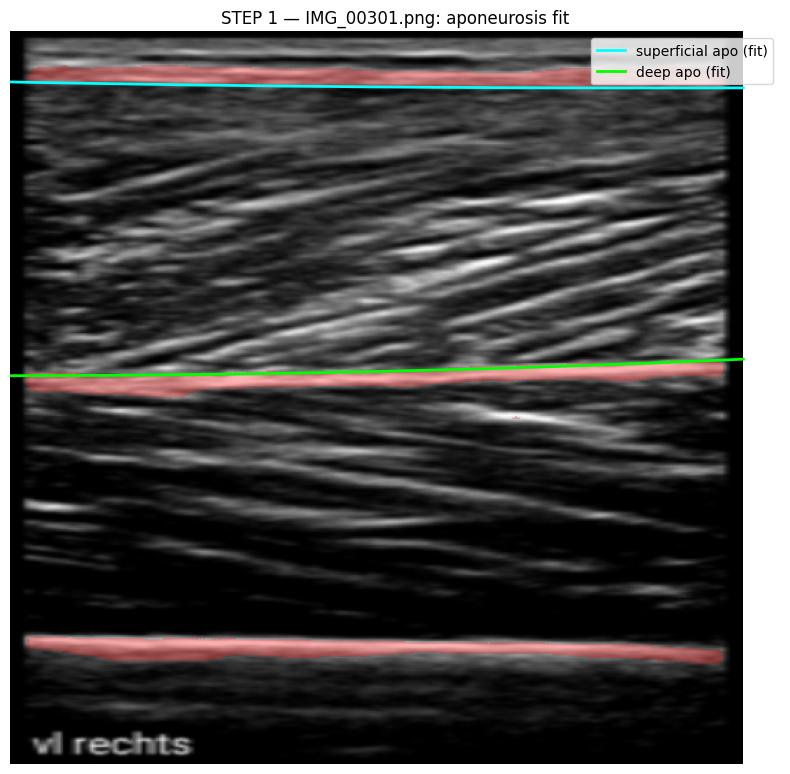

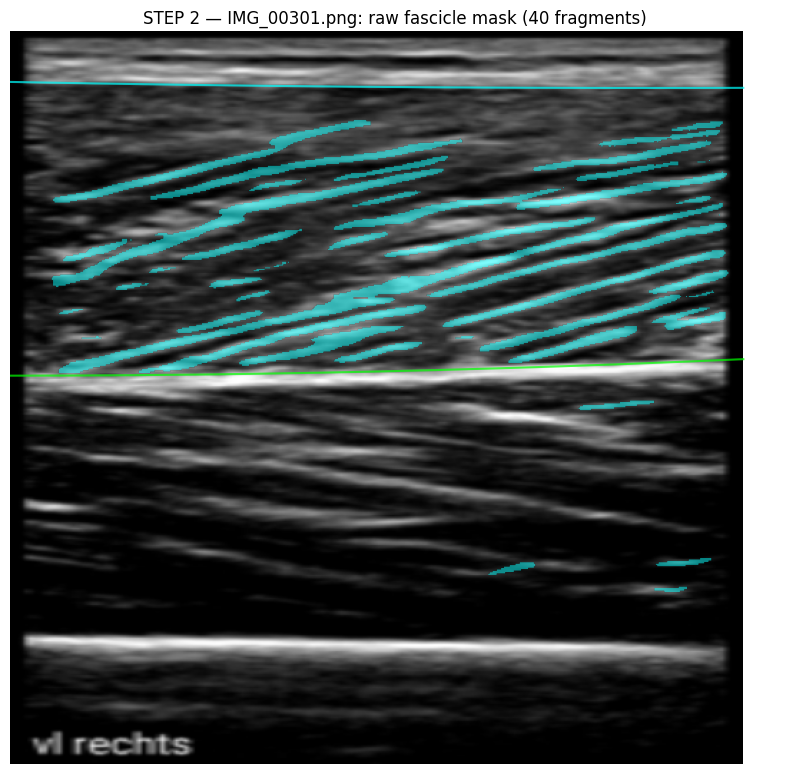

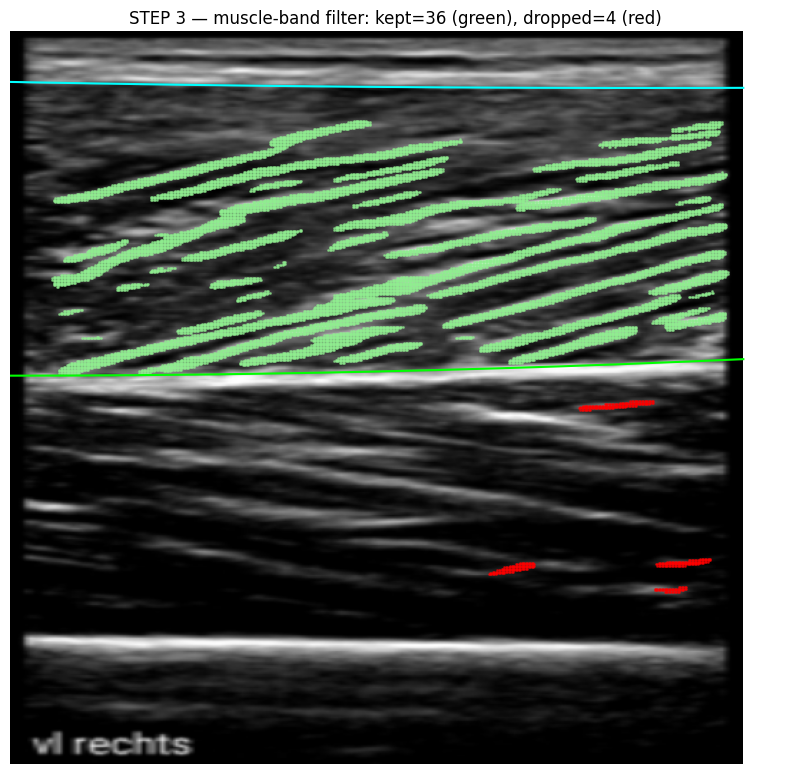

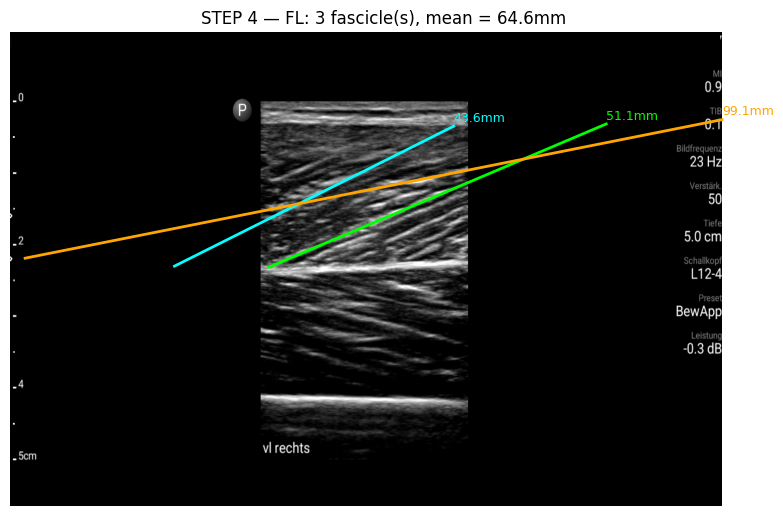

/tmp/ipykernel_1056/2376160673.py:62: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  palette = cm.get_cmap('tab10', max(n_pa, 1))


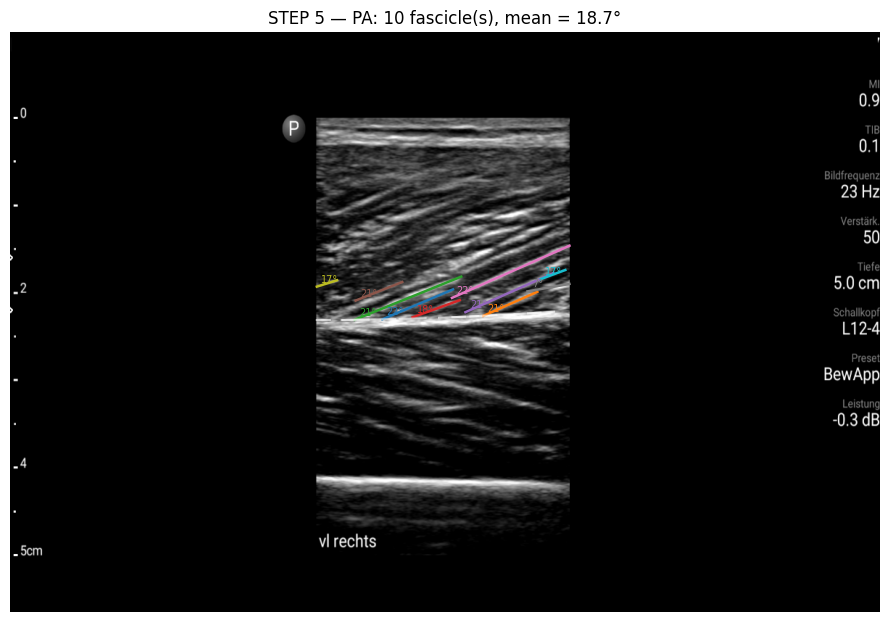


FL results:
  #1: frag_len=477.3px  slope=-0.256  FL=618.6px = 51.12mm
  #2: frag_len=283.1px  slope=-0.302  FL=527.0px = 43.56mm
  #3: frag_len=276.8px  slope=-0.120  FL=1198.7px = 99.06mm
  -> mean FL: mm=64.58195531847714, px=781.4416593535734, n=3

PA results:
  #1: slope=-0.256  gap_to_apo=0.00px  PA=21.81°
  #2: slope=-0.269  gap_to_apo=0.00px  PA=21.24°
  #3: slope=-0.244  gap_to_apo=0.00px  PA=21.33°
  #4: slope=-0.220  gap_to_apo=1.49px  PA=18.37°
  #5: slope=-0.268  gap_to_apo=5.24px  PA=21.47°
  #6: slope=-0.240  gap_to_apo=22.36px  PA=20.97°
  #7: slope=-0.268  gap_to_apo=22.52px  PA=21.67°
  #8: slope=-0.107  gap_to_apo=25.69px  PA=6.55°
  #9: slope=-0.191  gap_to_apo=38.90px  PA=17.35°
  #10: slope=-0.224  gap_to_apo=39.13px  PA=16.64°
  -> mean PA: 18.73902169764276, n=10


In [46]:
# ================================================================
# DEMO: run the full pipeline on one test image, step by step
# ================================================================
sample_fname = sorted(os.listdir(test_idir))[300]   # <- change to inspect any image
result = analyze_fascicles(sample_fname, test_idir, apo_model_unet, fasc_model_unet,
                            test_calib, thresh_apo=0.5, thresh_fasc=0.01)

orig_img = Image.open(os.path.join(test_idir, sample_fname)).convert('RGB')

# ---- STEP 1: aponeurosis masks + fitted curves ----
xs_full = np.linspace(0, NET_SIZE, 300)
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(result['img_arr'])
ax.imshow(np.ma.masked_where(result['apo_bin'] == 0, result['apo_bin']), cmap='autumn', alpha=0.3)
ax.plot(xs_full, result['poly_up'](xs_full), color='cyan', linewidth=2, label='superficial apo (fit)')
ax.plot(xs_full, result['poly_low'](xs_full), color='lime', linewidth=2, label='deep apo (fit)')
ax.legend(loc='upper right')
ax.set_title(f"STEP 1 — {sample_fname}: aponeurosis fit")
ax.axis('off'); plt.tight_layout(); plt.show()

# ---- STEP 2: raw fascicle fragments (before band filtering) ----
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(result['img_arr'])
ax.imshow(np.ma.masked_where(result['fasc_bin'] == 0, result['fasc_bin']), cmap='cool', alpha=0.5)
ax.plot(xs_full, result['poly_up'](xs_full), color='cyan', linewidth=1.5, alpha=0.7)
ax.plot(xs_full, result['poly_low'](xs_full), color='lime', linewidth=1.5, alpha=0.7)
ax.set_title(f"STEP 2 — {sample_fname}: raw fascicle mask ({len(result['fascicles_raw'])} fragments)")
ax.axis('off'); plt.tight_layout(); plt.show()

# ---- STEP 3: fragments kept after the muscle-band filter ----
kept_ids = {id(f) for f in result['fascicles_in_band']}

fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(result['img_arr'])
ax.plot(xs_full, result['poly_up'](xs_full), color='cyan', linewidth=1.5)
ax.plot(xs_full, result['poly_low'](xs_full), color='lime', linewidth=1.5)
for f in result['fascicles_raw']:
    color = 'lightgreen' if id(f) in kept_ids else 'red'
    ax.scatter(f['xs'], f['ys'], s=1, color=color, alpha=0.6)
kept, dropped = len(result['fascicles_in_band']), len(result['fascicles_raw']) - len(result['fascicles_in_band'])
ax.set_title(f"STEP 3 — muscle-band filter: kept={kept} (green), dropped={dropped} (red)")
ax.axis('off'); plt.tight_layout(); plt.show()

# ---- STEP 4: FL ----
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(orig_img)
colors = ['lime', 'cyan', 'orange']
for r, c in zip(result['fl_results'], colors):
    xo_up, yo_up = r['pt_up_orig']; xo_low, yo_low = r['pt_low_orig']
    ax.plot([xo_up, xo_low], [yo_up, yo_low], color=c, linewidth=2)
    fl_str = f"{r['fl_mm']:.1f}mm" if r['fl_mm'] else f"{r['fl_px']:.1f}px"
    ax.text(xo_up, yo_up - 8, fl_str, color=c, fontsize=9)
fl_sum_str = f"{result['fl_summary']['fl_mm_mean']:.1f}mm" if result['fl_summary']['fl_mm_mean'] else "N/A"
ax.set_title(f"STEP 4 — FL: {len(result['fl_results'])} fascicle(s), mean = {fl_sum_str}")
ax.axis('off'); plt.tight_layout(); plt.show()

# ---- STEP 5: PA ----
import matplotlib.cm as cm
fig, ax = plt.subplots(figsize=(9, 9))
ax.imshow(orig_img)
n_pa = len(result['pa_results'])
palette = cm.get_cmap('tab10', max(n_pa, 1))
for i, r in enumerate(result['pa_results']):
    c = palette(i % 10)
    xo_up, yo_up = r['pt_up_orig']; xo_low, yo_low = r['pt_low_orig']
    (xo_a, yo_a), (xo_b, yo_b) = r['apo_tangent_orig']
    ax.plot([xo_up, xo_low], [yo_up, yo_low], color=c, linewidth=1.8)
    ax.plot([xo_a, xo_b], [yo_a, yo_b], color='white', linewidth=1.5, alpha=0.6)
    ax.text(xo_low + 6, yo_low - 6, f"{r['pa_deg']:.0f}°", color=c, fontsize=7)
pa_sum_str = f"{result['pa_summary']['pa_deg_mean']:.1f}°" if result['pa_summary']['pa_deg_mean'] else "N/A"
ax.set_title(f"STEP 5 — PA: {n_pa} fascicle(s), mean = {pa_sum_str}")
ax.axis('off'); plt.tight_layout(); plt.show()

# ---- Printed summary ----
print("\nFL results:")
for i, r in enumerate(result['fl_results'], 1):
    mm_str = f"{r['fl_mm']:.2f}mm" if r['fl_mm'] else "N/A"
    print(f"  #{i}: frag_len={r['frag_len']:.1f}px  slope={r['slope']:.3f}  FL={r['fl_px']:.1f}px = {mm_str}")
print(f"  -> mean FL: mm={result['fl_summary']['fl_mm_mean']}, "
      f"px={result['fl_summary']['fl_px_mean']}, n={result['fl_summary']['n']}")

print("\nPA results:")
for i, r in enumerate(result['pa_results'], 1):
    print(f"  #{i}: slope={r['slope']:.3f}  gap_to_apo={r['gap_low_px']:.2f}px  PA={r['pa_deg']:.2f}°")
print(f"  -> mean PA: {result['pa_summary']['pa_deg_mean']}, n={result['pa_summary']['n']}")

### Running FL/PA analysis over the full test set

This cell mirrors the muscle-thickness (MT) batch cell above, but for
fascicle length and pennation angle. For every test image it calls
`analyze_fascicles`, which performs the aponeurosis fit, muscle-band
filtering, and constrained FL/PA fragment selection described above, and
records both the summary statistics (mean FL, mean PA, fragment counts) and
the individual per-fragment values for later inspection.

Images can fail at several distinct points, and we track *why* rather than
just *that*: aponeurosis splitting can fail outright (same failure mode as
MT), no fascicle fragments may survive the muscle-band filter, or all FL
fragments may get dropped by the implausible-length cutoff. Separating these
failure reasons makes it much easier to tell whether a given image is a
segmentation problem (bad APO/FASC masks) or a geometry problem (fragments
exist but don't pass the physiological plausibility checks).

Set `print_images=True` to additionally render the FL and PA overlay plots
for every image in the output — useful for a manual visual QA pass, but it
will make the notebook file very heavy, so it's left off by default for
normal runs.

In [64]:
# ============================================================
# Run FL/PA (analyze_fascicles) over the FULL test set,
# using each image's own px_per_cm from test_calib for the
# mm conversion. Mirrors the MT batch-processing cell above.
#
# Set print_images=True to additionally render STEP 4/5 plots
# for every image, so you can manually check them all. Leave
# False for normal runs — rendering every image will make the
# notebook file very heavy.
# ============================================================
from tqdm.auto import tqdm
import pandas as pd
import numpy as np

print_images = False  # <-- set True to visually check every image in output

fl_pa_results = []
fl_pa_failed = []

test_fnames = sorted(os.listdir(test_idir))

for fname in tqdm(test_fnames, desc="Computing FL/PA (test set)"):
    result = analyze_fascicles(
        fname, test_idir, apo_model_unet, fasc_model_unet, test_calib,
        thresh_apo=0.5, thresh_fasc=0.15
    )

    if result is None:
        fl_pa_failed.append((fname, 'apo split failed'))
        print(f"{fname}: FAILED (apo split failed)")
        continue

    if not result['fascicles_in_band']:
        fl_pa_failed.append((fname, 'no fascicles inside muscle band'))
        print(f"{fname}: FAILED (no fascicles inside muscle band)")
        continue

    if not result['fl_results']:
        fl_pa_failed.append((fname, 'no valid FL fragments'))
        print(f"{fname}: FAILED (no valid FL fragments)")
        continue

    fl_mm_str = f"{result['fl_summary']['fl_mm_mean']:.2f}mm" if result['fl_summary']['fl_mm_mean'] else "N/A"
    pa_deg_str = f"{result['pa_summary']['pa_deg_mean']:.2f}°" if result['pa_summary']['pa_deg_mean'] else "N/A"
    print(f"{fname}: FL n={result['fl_summary']['n']} mean={fl_mm_str}  |  "
          f"PA n={result['pa_summary']['n']} mean={pa_deg_str}")

    if print_images:
        # STEP 4 — FL
        orig_img = Image.open(os.path.join(test_idir, fname)).convert('RGB')
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.imshow(orig_img)
        colors = ['lime', 'cyan', 'orange']
        for r, c in zip(result['fl_results'], colors):
            xo_up, yo_up = r['pt_up_orig']; xo_low, yo_low = r['pt_low_orig']
            ax.plot([xo_up, xo_low], [yo_up, yo_low], color=c, linewidth=2)
            fl_str = f"{r['fl_mm']:.1f}mm" if r['fl_mm'] else f"{r['fl_px']:.1f}px"
            ax.text(xo_up, yo_up - 8, fl_str, color=c, fontsize=9)
        ax.set_title(f"{fname} — FL: {len(result['fl_results'])} fascicle(s), mean = {fl_mm_str}")
        ax.axis('off'); plt.tight_layout(); plt.show()

        # STEP 5 — PA
        import matplotlib.cm as cm
        fig, ax = plt.subplots(figsize=(9, 9))
        ax.imshow(orig_img)
        n_pa = len(result['pa_results'])
        palette = cm.get_cmap('tab10', max(n_pa, 1))
        for i, r in enumerate(result['pa_results']):
            c = palette(i % 10)
            xo_up, yo_up = r['pt_up_orig']; xo_low, yo_low = r['pt_low_orig']
            (xo_a, yo_a), (xo_b, yo_b) = r['apo_tangent_orig']
            ax.plot([xo_up, xo_low], [yo_up, yo_low], color=c, linewidth=1.8)
            ax.plot([xo_a, xo_b], [yo_a, yo_b], color='white', linewidth=1.5, alpha=0.6)
            ax.text(xo_low + 6, yo_low - 6, f"{r['pa_deg']:.0f}°", color=c, fontsize=7)
        ax.set_title(f"{fname} — PA: {n_pa} fascicle(s), mean = {pa_deg_str}")
        ax.axis('off'); plt.tight_layout(); plt.show()

    fl_pa_results.append({
        'image_id': fname,
        'fl_mm_mean': result['fl_summary']['fl_mm_mean'],
        'fl_px_mean': result['fl_summary']['fl_px_mean'],
        'fl_n': result['fl_summary']['n'],
        'pa_deg_mean': result['pa_summary']['pa_deg_mean'],
        'pa_n': result['pa_summary']['n'],
        'dominant_sign': result['dominant_sign'],
        # keep per-fragment detail too, useful for later debugging/QA
        'fl_fragments_mm': [r['fl_mm'] for r in result['fl_results']],
        'fl_fragments_px': [r['fl_px'] for r in result['fl_results']],
        'pa_fragments_deg': [r['pa_deg'] for r in result['pa_results']],
    })

fl_pa_df = pd.DataFrame(fl_pa_results)
print(f"\nSucceeded: {len(fl_pa_df)}/{len(test_fnames)}   Failed: {len(fl_pa_failed)}")
if fl_pa_failed:
    reasons = pd.Series([r for _, r in fl_pa_failed]).value_counts()
    print("Failure reasons:")
    print(reasons)

Computing FL/PA (test set):   0%|          | 0/309 [00:00<?, ?it/s]

IMG_00001.tif: FL n=3 mean=98.89mm  |  PA n=10 mean=18.54°
IMG_00002.tif: FL n=3 mean=95.07mm  |  PA n=10 mean=11.06°
IMG_00003.tif: FL n=3 mean=95.36mm  |  PA n=9 mean=13.68°
IMG_00004.tif: FL n=3 mean=168.48mm  |  PA n=6 mean=12.70°
IMG_00005.tif: FL n=3 mean=78.23mm  |  PA n=10 mean=17.47°
IMG_00006.tif: FL n=3 mean=91.38mm  |  PA n=10 mean=21.25°
IMG_00007.tif: FL n=3 mean=89.94mm  |  PA n=4 mean=18.51°
IMG_00008.tif: FL n=2 mean=93.96mm  |  PA n=4 mean=19.12°
IMG_00009.tif: FL n=3 mean=128.16mm  |  PA n=8 mean=8.19°
IMG_00010.tif: FL n=2 mean=72.88mm  |  PA n=6 mean=13.86°
IMG_00011.tif: FL n=3 mean=79.61mm  |  PA n=8 mean=12.38°
IMG_00012.tif: FL n=3 mean=87.62mm  |  PA n=10 mean=13.90°
IMG_00013.tif: FL n=3 mean=70.22mm  |  PA n=9 mean=8.00°
IMG_00014.tif: FAILED (no fascicles inside muscle band)
IMG_00015.tif: FL n=3 mean=123.13mm  |  PA n=10 mean=14.04°
IMG_00016.tif: FL n=3 mean=91.42mm  |  PA n=10 mean=18.88°
IMG_00017.tif: FL n=3 mean=86.21mm  |  PA n=10 mean=17.62°
IMG_000

## Saving FL/PA results to Google Drive

This cell saves the FL/PA results to the same `UMUD_checkpoints/results`
folder used for the MT results, following the same pattern: a timestamped
CSV for this specific run, plus a `_latest.csv` convenience copy that's
always overwritten with the most recent results, so downstream cells or a
separate analysis notebook can always read a stable filename without needing
to know the timestamp.

Since each image can have a variable number of FL/PA fragments (up to 3 for
FL, up to 10 for PA), the per-fragment lists are flattened into
semicolon-separated strings before export — a raw Python list doesn't
round-trip cleanly through CSV, since it gets written and read back as a
literal string like `"[1.2, 3.4]"` rather than a usable list. Any failures
(images where FL/PA couldn't be computed at all) are saved to a separate CSV
alongside the main results, tagged with the specific reason for the failure,
so a full run's failures aren't silently lost between sessions.

In [65]:
# ============================================================
# Save FL/PA results (test set) to Google Drive, alongside
# MT results and checkpoints/history in UMUD_checkpoints. Mirrors
# the MT save cell above.
# ============================================================
import os
from datetime import datetime

RESULTS_DIR = '/content/drive/MyDrive/UMUD_checkpoints/results'
os.makedirs(RESULTS_DIR, exist_ok=True)

timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')
fl_pa_results_path = os.path.join(RESULTS_DIR, f'fl_pa_results_{timestamp}.csv')
fl_pa_results_latest_path = os.path.join(RESULTS_DIR, 'fl_pa_results_latest.csv')  # stable name, always overwritten

# expand list-valued columns into stringified form before saving,
# since a list-in-a-cell doesn't round-trip cleanly through CSV
fl_pa_df_export = fl_pa_df.copy()
for col in ['fl_fragments_mm', 'fl_fragments_px', 'pa_fragments_deg']:
    if col in fl_pa_df_export.columns:
        fl_pa_df_export[col] = fl_pa_df_export[col].apply(
            lambda vals: ';'.join(f'{v:.2f}' for v in vals) if isinstance(vals, list) else ''
        )

fl_pa_df_export.to_csv(fl_pa_results_path, index=False)
fl_pa_df_export.to_csv(fl_pa_results_latest_path, index=False)  # convenience copy, always the most recent run

print(f"✅ Saved {len(fl_pa_df_export)} results to Drive:")
print(f"   {fl_pa_results_path}")
print(f"   {fl_pa_results_latest_path}  (latest, overwritten each run)")

# also save the failure list, so a run's failures aren't lost
if fl_pa_failed:
    fl_pa_failed_df = pd.DataFrame(fl_pa_failed, columns=['image_id', 'reason'])
    fl_pa_failed_path = os.path.join(RESULTS_DIR, f'fl_pa_failed_{timestamp}.csv')
    fl_pa_failed_df.to_csv(fl_pa_failed_path, index=False)
    print(f"✅ Saved {len(fl_pa_failed_df)} failures to: {fl_pa_failed_path}")

print(f"\nFull per-image printout:")
for _, row in fl_pa_df_export.iterrows():
    fl_str = f"{row['fl_mm_mean']:.2f}mm" if pd.notna(row['fl_mm_mean']) else "N/A"
    pa_str = f"{row['pa_deg_mean']:.2f}°" if pd.notna(row['pa_deg_mean']) else "N/A"
    print(f"{row['image_id']}: FL(n={row['fl_n']}) = {fl_str}  |  PA(n={row['pa_n']}) = {pa_str}")

fl_pa_df.head(10)

✅ Saved 294 results to Drive:
   /content/drive/MyDrive/UMUD_checkpoints/results/fl_pa_results_20260718_095420.csv
   /content/drive/MyDrive/UMUD_checkpoints/results/fl_pa_results_latest.csv  (latest, overwritten each run)
✅ Saved 15 failures to: /content/drive/MyDrive/UMUD_checkpoints/results/fl_pa_failed_20260718_095420.csv

Full per-image printout:
IMG_00001.tif: FL(n=3) = 98.89mm  |  PA(n=10) = 18.54°
IMG_00002.tif: FL(n=3) = 95.07mm  |  PA(n=10) = 11.06°
IMG_00003.tif: FL(n=3) = 95.36mm  |  PA(n=9) = 13.68°
IMG_00004.tif: FL(n=3) = 168.48mm  |  PA(n=6) = 12.70°
IMG_00005.tif: FL(n=3) = 78.23mm  |  PA(n=10) = 17.47°
IMG_00006.tif: FL(n=3) = 91.38mm  |  PA(n=10) = 21.25°
IMG_00007.tif: FL(n=3) = 89.94mm  |  PA(n=4) = 18.51°
IMG_00008.tif: FL(n=2) = 93.96mm  |  PA(n=4) = 19.12°
IMG_00009.tif: FL(n=3) = 128.16mm  |  PA(n=8) = 8.19°
IMG_00010.tif: FL(n=2) = 72.88mm  |  PA(n=6) = 13.86°
IMG_00011.tif: FL(n=3) = 79.61mm  |  PA(n=8) = 12.38°
IMG_00012.tif: FL(n=3) = 87.62mm  |  PA(n=10) =

,image_id,fl_mm_mean,fl_px_mean,fl_n,pa_deg_mean,pa_n,dominant_sign,fl_fragments_mm,fl_fragments_px,pa_fragments_deg
0,IMG_00001.tif,98.892229,1338.341504,3,18.540965,10,-1.0,"[104.67148378949486, 96.36562941971155, 98.892...","[1416.5540806178303, 1304.1481848134297, 1338....","[15.367860634312262, 19.283434445453228, 21.67..."
1,IMG_00002.tif,95.068883,1447.423743,3,11.064068,10,-1.0,"[95.06888298396005, 93.96639456874016, 100.825...","[1447.4237434307918, 1430.638357309069, 1535.0...","[13.452554391250253, 11.159566212877314, 11.07..."
2,IMG_00003.tif,95.356052,1290.485231,3,13.678739,9,1.0,"[91.44121531515259, 97.28782375050753, 95.3560...","[1237.504447265065, 1316.6285480902018, 1290.4...","[11.766544230834086, 12.414099650788586, 11.97..."
3,IMG_00004.tif,168.479813,2280.093463,3,12.700174,6,1.0,"[168.47981256143385, 170.61430950861322, 123.5...","[2280.093463331405, 2308.980322016566, 1672.31...","[15.653409175090758, 15.246883495190389, 14.11..."
4,IMG_00005.tif,78.226504,793.999015,3,17.469305,10,-1.0,"[78.22650392592206, 76.26703059150287, 86.8993...","[793.9990148481088, 774.1103605037541, 882.028...","[15.61998961527716, 18.939014296264556, 15.995..."
5,IMG_00006.tif,91.375735,927.463712,3,21.252619,10,-1.0,"[91.37573513361829, 88.48510123056867, 95.6272...","[927.4637116062256, 898.123777490272, 970.6170...","[16.679906029090148, 18.544544231061757, 21.27..."
6,IMG_00007.tif,89.943386,1217.233829,3,18.513502,4,1.0,"[89.94338638368708, 101.11700250355541, 79.370...","[1217.233829059232, 1368.4501005481168, 1074.1...","[18.378883646970735, 18.648119556937758, 23.51..."
7,IMG_00008.tif,93.963809,1271.643552,2,19.115695,4,1.0,"[103.94766735997003, 83.97995121234258]","[1406.7584316049279, 1136.528673073703]","[16.0321099300032, 17.210632128512486, 21.0207..."
8,IMG_00009.tif,128.157021,2043.189072,3,8.194004,8,1.0,"[141.48283002671454, 109.76721395515159, 128.1...","[2255.640547283049, 1750.0030110564169, 2043.1...","[12.54060178683639, 7.314432125064286, 7.45715..."
9,IMG_00010.tif,72.878492,1109.575041,2,13.862958,6,1.0,"[73.23966710618619, 72.51731699786004]","[1115.0739316916847, 1104.076151292419]","[15.41013383155314, 15.522300752637676, 16.756..."


### Final submission (real MT, FL and PA predictions)

With all three pipelines producing real predictions, this cell builds the
actual submission file. Any image missing a prediction for a given target
is filled with the mean of the available predictions for that column, and
every value is clipped to the known physiological range so a bad fallback
or an outlier prediction can't produce an implausible submission row.

In [66]:
# ============================================================
# Build the REAL submission CSV using actual predictions
# for all three targets:
#   - mt_mm  -> from mt_results_latest.csv   (muscle thickness pipeline)
#   - fl_mm  -> from fl_pa_results_latest.csv (fascicle length pipeline)
#   - pa_deg -> from fl_pa_results_latest.csv (pennation angle pipeline)
#
# Any test image missing a prediction in a given column gets that
# column filled with the MEAN of the available predictions for that
# column. After filling, all values are clipped to the known
# physiological ranges (test-set bounds), since a fallback mean or a
# noisy prediction can still fall outside plausible anatomy.
# ============================================================
import os
import pandas as pd

RESULTS_DIR = '/content/drive/MyDrive/UMUD_checkpoints/results'
SUBMISSIONS_DIR = '/content/drive/MyDrive/UMUD_checkpoints/submissions'
os.makedirs(SUBMISSIONS_DIR, exist_ok=True)

# --- physiological ranges (test set), used to cap over/undershoot ---
PHYS_RANGES = {
    'pa_deg': (5.0, 45.0),
    'fl_mm':  (30.0, 200.0),
    'mt_mm':  (10.0, 50.0),
}

# --- reload the latest saved MT results ---
mt_results_latest_path = os.path.join(RESULTS_DIR, 'mt_results_latest.csv')
mt_df = pd.read_csv(mt_results_latest_path)
print(f"Reloaded {len(mt_df)} MT results from: {mt_results_latest_path}")

# --- reload the latest saved FL/PA results ---
fl_pa_results_latest_path = os.path.join(RESULTS_DIR, 'fl_pa_results_latest.csv')
fl_pa_df = pd.read_csv(fl_pa_results_latest_path)
print(f"Reloaded {len(fl_pa_df)} FL/PA results from: {fl_pa_results_latest_path}")

# --- build the FULL list of test image_ids (some may be missing from
#     mt_df / fl_pa_df if they failed at some stage of either pipeline) ---
test_fnames = sorted(os.listdir(test_idir))
print(f"\nTotal test images: {len(test_fnames)}")

full_ids_df = pd.DataFrame({'image_id': test_fnames})

# --- merge MT ---
sub_df = full_ids_df.merge(mt_df[['image_id', 'mt_mm']], on='image_id', how='left')

# --- merge FL/PA (note: column names in fl_pa_df are fl_mm_mean / pa_deg_mean) ---
sub_df = sub_df.merge(
    fl_pa_df[['image_id', 'fl_mm_mean', 'pa_deg_mean']],
    on='image_id', how='left'
)
sub_df = sub_df.rename(columns={'fl_mm_mean': 'fl_mm', 'pa_deg_mean': 'pa_deg'})

# --- report + fill missing values per column with that column's mean ---
missing_report = {}
for col in ['mt_mm', 'fl_mm', 'pa_deg']:
    n_missing = sub_df[col].isna().sum()
    missing_report[col] = n_missing
    if n_missing > 0:
        fallback = sub_df[col].mean()
        print(f"⚠️ {n_missing} images missing '{col}' — filling with fallback mean = {fallback:.2f}")
        sub_df[col] = sub_df[col].fillna(fallback)
    else:
        print(f"✅ '{col}': no missing values")

# --- summary of missing predictions across all columns ---
total_missing_cells = sum(missing_report.values())
images_missing_any = sub_df.index[
    sub_df[['mt_mm', 'fl_mm', 'pa_deg']].isna().any(axis=1)  # already filled, so recompute pre-fill mask below
].tolist()
print("\n--- Missing predictions summary ---")
for col, n in missing_report.items():
    pct = 100 * n / len(sub_df)
    print(f"  {col}: {n} missing ({pct:.1f}% of {len(sub_df)} test images)")
print(f"  TOTAL missing cells (sum across columns): {total_missing_cells}")

# --- clip predictions to physiological ranges, reporting how many were capped ---
print("\n--- Clipping to physiological ranges ---")
for col, (lo, hi) in PHYS_RANGES.items():
    below = (sub_df[col] < lo).sum()
    above = (sub_df[col] > hi).sum()
    if below > 0 or above > 0:
        print(f"  {col}: {below} undershoot (<{lo}) clipped up, {above} overshoot (>{hi}) clipped down")
    else:
        print(f"  {col}: all values already within [{lo}, {hi}]")
    sub_df[col] = sub_df[col].clip(lower=lo, upper=hi)

# reorder columns to match sample submission format: image_id, pa_deg, fl_mm, mt_mm
sub_df = sub_df[['image_id', 'pa_deg', 'fl_mm', 'mt_mm']]

assert len(sub_df) == 309, f"Expected 309 rows, got {len(sub_df)}"
assert sub_df.isna().sum().sum() == 0, "Submission still contains NaNs after fallback fill"

submission_path = os.path.join(SUBMISSIONS_DIR, 'submission_full.csv')
sub_df.to_csv(submission_path, index=False)
print(f"\n✅ Saved full submission ({len(sub_df)} rows) to:\n   {submission_path}")
print(sub_df.head())

# ============================================================
# STEP: quick sanity-check summary of the final submission values
# ============================================================
print("\nSubmission value ranges (post-clip):")
for col in ['pa_deg', 'fl_mm', 'mt_mm']:
    print(f"  {col}: min={sub_df[col].min():.2f}  mean={sub_df[col].mean():.2f}  "
          f"median={sub_df[col].median():.2f}  max={sub_df[col].max():.2f}")

# ============================================================
# STEP: make the submission downloadable from Colab
# ============================================================
from google.colab import files

files.download(submission_path)

Reloaded 309 MT results from: /content/drive/MyDrive/UMUD_checkpoints/results/mt_results_latest.csv
Reloaded 294 FL/PA results from: /content/drive/MyDrive/UMUD_checkpoints/results/fl_pa_results_latest.csv

Total test images: 309
✅ 'mt_mm': no missing values
⚠️ 15 images missing 'fl_mm' — filling with fallback mean = 91.56
⚠️ 51 images missing 'pa_deg' — filling with fallback mean = 14.21

--- Missing predictions summary ---
  mt_mm: 0 missing (0.0% of 309 test images)
  fl_mm: 15 missing (4.9% of 309 test images)
  pa_deg: 51 missing (16.5% of 309 test images)
  TOTAL missing cells (sum across columns): 66

--- Clipping to physiological ranges ---
  pa_deg: all values already within [5.0, 45.0]
  fl_mm: 4 undershoot (<30.0) clipped up, 0 overshoot (>200.0) clipped down
  mt_mm: all values already within [10.0, 50.0]

✅ Saved full submission (309 rows) to:
   /content/drive/MyDrive/UMUD_checkpoints/submissions/submission_full.csv
        image_id     pa_deg       fl_mm      mt_mm
0  IM

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

102 team entries — min=0.3221  max=31.1966  mean=1.8007  median=1.2355
Saved: /content/drive/MyDrive/UMUD_checkpoints/figures/leaderboard_distribution_linear.pdf


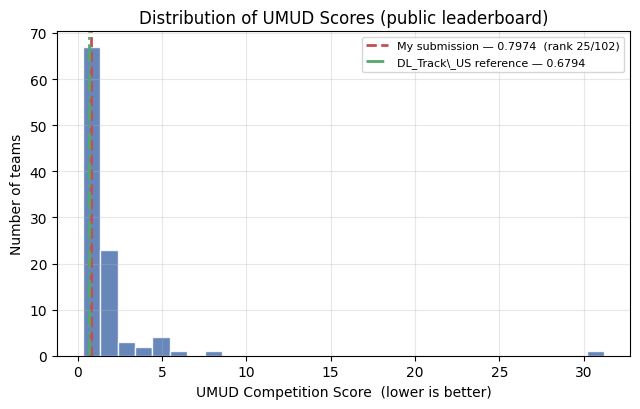

Saved: /content/drive/MyDrive/UMUD_checkpoints/figures/leaderboard_distribution_log.pdf


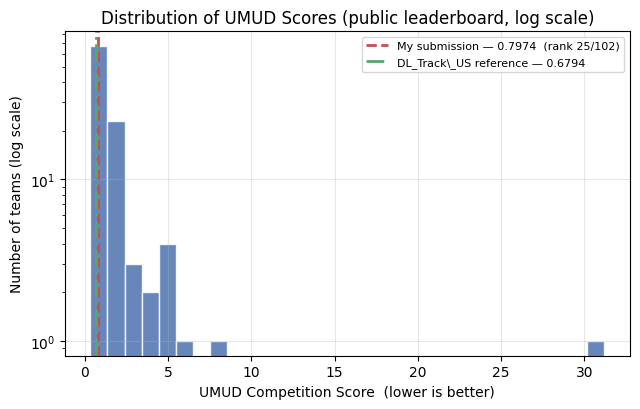

In [67]:
import numpy as np
import matplotlib.pyplot as plt
import os

# ============ DATA — full public leaderboard (102 teams) ============
leaderboard = [
    ("suguuuuu | no hand labelling", 0.32209),
    ("Patryk Wolny", 0.34538),
    ("AT0641", 0.38366),
    ("PatrickAIForFun", 0.41443),
    ("Yufo", 0.43061),
    ("Shishio Makoto", 0.45615),
    ("[Deleted]", 0.46041),
    ("Homin Park", 0.46489),
    ("test_umud", 0.52967),
    ("yingfali", 0.55637),
    ("Jason Karpeles", 0.59724),
    ("Yusaku Muroya", 0.61918),
    ("yuki", 0.63096),
    ("PavelLiashkov", 0.63877),
    ("tuko_tanzwoo", 0.66179),
    ("João Victor", 0.69642),
    ("Emre Cirak", 0.69664),
    ("Baxter Barlow", 0.71006),
    ("takitakii", 0.71868),
    ("Pardheev Krishna", 0.73101),
    ("Zhiyuan Ding", 0.73397),
    ("UIT_PQC", 0.74711),
    ("Cường Phạm Quốc", 0.74765),
    ("Mohit", 0.77645),
    ("Riccardo Santi rs", 0.79744),   # <-- me, rank 27
    ("Hanif Noer Rofiq", 0.82307),
    ("shinya kaneda", 0.83067),
    ("Malitha Gunawardhana", 0.87135),
    ("Master_1996", 0.87253),
    ("Uche Ozoemena", 0.89723),
    ("Roy Nikolaus", 0.90659),
    ("Yeyang", 0.93419),
    ("Raul Sîmpetru", 0.95352),
    ("Suguru02", 0.95801),
    ("Fernandosr85", 0.97691),
    ("Blue", 0.98768),
    ("Santiago Maniches", 0.99237),
    ("Master Teo", 1.00515),
    ("ABC", 1.01799),
    ("az.shaoon", 1.03740),
    ("Creatine supplement", 1.04830),
    ("Jonas M.", 1.05529),
    ("Gaurav Upreti", 1.08230),
    ("Andrew Lee", 1.09451),
    ("moeuuu", 1.11684),
    ("Vandit", 1.15113),
    ("Abinayan Anantharuban", 1.17692),
    ("Randy Harvey", 1.18081),
    ("yunfeng z", 1.20205),
    ("Abdulsamad", 1.21745),
    ("AmbrosM", 1.22094),
    ("Srishanth Sriramula", 1.25016),
    ("Kendall and Styves", 1.26563),
    ("Ashish Mishra", 1.27169),
    ("Ngọc Hưng Nguyễn", 1.29115),
    ("JinchengZhang1", 1.30038),
    ("Nitin Dagar", 1.32505),
    ("Alex Li", 1.33518),
    ("Kumar Abhijeet", 1.33851),
    ("BhargavaAbhi", 1.33851),
    ("Jeki Wan Taufik", 1.33851),
    ("Lakhindar Pal", 1.33851),
    ("bsenst", 1.33851),
    ("CuteClaw", 1.33851),
    ("Adi Kusuma", 1.33851),
    ("StephenNedumpally", 1.33851),
    ("The Coder Geek Squad Leader", 1.33851),
    ("Shiv Satyam", 1.43312),
    ("Tony", 1.43474),
    ("Marco DG", 1.45962),
    ("Karearea", 1.47894),
    ("Accer_sz", 1.48427),
    ("Leon Górecki", 1.51156),
    ("Misha Shikhov", 1.57233),
    ("Atsu40725", 1.59625),
    ("Danielle Lesin", 1.60024),
    ("093_이민재", 1.60559),
    ("Quang Minh Lê 227", 1.60764),
    ("ARJUN A S", 1.62129),
    ("Niaz Mahmud", 1.67783),
    ("Yu_Krxfo _", 1.69410),
    ("Surya milenial", 1.82283),
    ("hideaki_mizoue", 1.87113),
    ("Abhishek Prithvi Teja", 1.87113),
    ("Kyaw Htin Aung", 1.87113),
    ("Trí Huy, Ngô", 1.87113),
    ("Vlad Balanda", 1.87113),
    ("Mythri V", 1.90208),
    ("yanis_lou", 2.37445),
    ("hill le", 2.37996),
    ("cg", 2.41344),
    ("Sathya Narayanan 8", 2.88089),
    ("Advait Sajith", 2.89028),
    ("ZAOUI_Yassine", 4.00447),
    ("Bohatyrenko Victor", 4.14174),
    ("Tejas Akade MD23B002", 4.55614),
    ("jorge fabian avila", 5.12207),
    ("fzhhahah", 5.12207),
    ("Julien bertas", 5.44652),
    ("adrian drischoff", 6.15939),
    ("Skipar", 7.55649),
    ("ParkJuHeon", 31.19656),
]

BENCHMARK_NAME = "DL_Track_US reference (Ritsche et al., 2024)"
BENCHMARK_SCORE = 0.67944

MY_SCORE = 0.79744
MY_RANK = 25
N_TEAMS = len(leaderboard)  # 102

OUT_DIR = '/content/drive/MyDrive/UMUD_checkpoints/figures'
os.makedirs(OUT_DIR, exist_ok=True)
# ======================================================================

scores = np.array([s for _, s in leaderboard])
print(f"{len(scores)} team entries — min={scores.min():.4f}  max={scores.max():.4f}  "
      f"mean={scores.mean():.4f}  median={np.median(scores):.4f}")

def plot_leaderboard_distribution(scores, my_score, my_rank, benchmark_score,
                                   n_teams, log_y=False, n_bins=30,
                                   title=None, save_path=None):
    fig, ax = plt.subplots(figsize=(6.5, 4.2))
    ax.hist(scores, bins=n_bins, color='#4C72B0', edgecolor='white', alpha=0.85)

    ax.axvline(my_score, color='#C44E52', linestyle='--', linewidth=2,
               label=f'My submission — {my_score:.4f}  (rank {my_rank}/{n_teams})')
    ax.axvline(benchmark_score, color='#55A868', linestyle='-.', linewidth=2,
               label=f'DL_Track\\_US reference — {benchmark_score:.4f}')

    ax.set_xlabel('UMUD Competition Score  (lower is better)')
    ax.set_ylabel('Number of teams')
    if log_y:
        ax.set_yscale('log')
        ax.set_ylabel('Number of teams (log scale)')
    if title:
        ax.set_title(title)
    ax.legend(loc='upper right', fontsize=8)
    ax.grid(alpha=0.3)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved: {save_path}")
    plt.show()

# --- Linear scale ---
plot_leaderboard_distribution(
    scores, MY_SCORE, MY_RANK, BENCHMARK_SCORE, N_TEAMS, log_y=False,
    title='Distribution of UMUD Scores (public leaderboard)',
    save_path=os.path.join(OUT_DIR, 'leaderboard_distribution_linear.pdf')
)

# --- Log scale (y-axis: team count) ---
plot_leaderboard_distribution(
    scores, MY_SCORE, MY_RANK, BENCHMARK_SCORE, N_TEAMS, log_y=True,
    title='Distribution of UMUD Scores (public leaderboard, log scale)',
    save_path=os.path.join(OUT_DIR, 'leaderboard_distribution_log.pdf')
)